# Stroke Data

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import numpy as np
from scipy.stats import f_oneway
from sklearn.impute import KNNImputer, SimpleImputer
from scipy.stats import chi2_contingency
from fonctions import *
import lime
import lime.lime_tabular
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
pd.options.mode.chained_assignment = None 
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=UserWarning)
import os
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


In [3]:
df = pd.read_csv('healthcare-dataset-stroke-data.csv')

In [4]:
df

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.00,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.00,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.00,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.00,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.00,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
5,56669,Male,81.00,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1
6,53882,Male,74.00,1,1,Yes,Private,Rural,70.09,27.4,never smoked,1
7,10434,Female,69.00,0,0,No,Private,Urban,94.39,22.8,never smoked,1
8,27419,Female,59.00,0,0,Yes,Private,Rural,76.15,NaN,Unknown,1
9,60491,Female,78.00,0,0,Yes,Private,Urban,58.57,24.2,Unknown,1


In [5]:
df.describe(include='all')

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
count,5110.000000,5110,5110.000000,5110.000000,5110.000000,5110,5110,5110,5110.000000,4909.000000,5110,5110.000000
unique,NaN,3,NaN,NaN,NaN,2,5,2,NaN,NaN,4,NaN
top,NaN,Female,NaN,NaN,NaN,Yes,Private,Urban,NaN,NaN,never smoked,NaN
freq,NaN,2994,NaN,NaN,NaN,3353,2925,2596,NaN,NaN,1892,NaN
mean,36517.829354,NaN,43.226614,0.097456,0.054012,NaN,NaN,NaN,106.147677,28.893237,NaN,0.048728
std,21161.721625,NaN,22.612647,0.296607,0.226063,NaN,NaN,NaN,45.283560,7.854067,NaN,0.215320
min,67.000000,NaN,0.080000,0.000000,0.000000,NaN,NaN,NaN,55.120000,10.300000,NaN,0.000000
25%,17741.250000,NaN,25.000000,0.000000,0.000000,NaN,NaN,NaN,77.245000,23.500000,NaN,0.000000
50%,36932.000000,NaN,45.000000,0.000000,0.000000,NaN,NaN,NaN,91.885000,28.100000,NaN,0.000000
75%,54682.000000,NaN,61.000000,0.000000,0.000000,NaN,NaN,NaN,114.090000,33.100000,NaN,0.000000


* id : identifiant unique.  
* gender : genre du patient.  
* age : âge du patient.  
* hypertension : 0 si le patient n'a pas d'hypertension, 1 si le patient a de
l'hypertension.
* heart_disease : 0 si le patient n'a pas de maladie cardiaque, 1 si le
patient a une maladie cardiaque.
* ever_married : si le patient a déjà été marié ou pas.
* work_type : type de travail du patient.
* Residence_type : type de résidence du patient "Rural" ou "Urbain" (=1).
* avg_glucose_level : taux moyen de glucose dans le sang.
* bmi : indice de masse corporelle.
* smoking_status : "a déjà fumé", "n'a jamais fumé", "fumé" ou "Inconnu ".
* stroke : 1 si le patient a eu un accident vasculaire cérébral ou 0 s'il n'en
a pas eu.

**Premières observations :** 
* L'échantillon comprend des individus dont l'âge est compris entre 8 mois et 82 ans (moyenne = 43 ans).  
* la colonne bmi contient des outliers qu'il va falloir traiter ainsi que des valeurs manquantes.  
* La colonne smoking_status contient également des valeurs manquantes.
* La colonne avg_glucose_level semble contenir des données pertinentes et sans outliers.


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   int64  
 1   gender             5110 non-null   object 
 2   age                5110 non-null   float64
 3   hypertension       5110 non-null   int64  
 4   heart_disease      5110 non-null   int64  
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   Residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 479.2+ KB


In [7]:
df.duplicated().sum()

0

In [8]:
for col in df.select_dtypes('number'):
    print("_____",col) 
    print("nbr_nan:",df[col].isna().sum())
    print("valeurs uniques :",df[col].nunique())
    print(df[col].unique()[:5])
    print("_ _ _ _ _ _ _ _ _ _") 
    print("_ _ _ _ _ _ _ _ _ _") 

_____ id
nbr_nan: 0
valeurs uniques : 5110
[ 9046 51676 31112 60182  1665]
_ _ _ _ _ _ _ _ _ _
_ _ _ _ _ _ _ _ _ _
_____ age
nbr_nan: 0
valeurs uniques : 104
[67. 61. 80. 49. 79.]
_ _ _ _ _ _ _ _ _ _
_ _ _ _ _ _ _ _ _ _
_____ hypertension
nbr_nan: 0
valeurs uniques : 2
[0 1]
_ _ _ _ _ _ _ _ _ _
_ _ _ _ _ _ _ _ _ _
_____ heart_disease
nbr_nan: 0
valeurs uniques : 2
[1 0]
_ _ _ _ _ _ _ _ _ _
_ _ _ _ _ _ _ _ _ _
_____ avg_glucose_level
nbr_nan: 0
valeurs uniques : 3979
[228.69 202.21 105.92 171.23 174.12]
_ _ _ _ _ _ _ _ _ _
_ _ _ _ _ _ _ _ _ _
_____ bmi
nbr_nan: 201
valeurs uniques : 418
[36.6  nan 32.5 34.4 24. ]
_ _ _ _ _ _ _ _ _ _
_ _ _ _ _ _ _ _ _ _
_____ stroke
nbr_nan: 0
valeurs uniques : 2
[1 0]
_ _ _ _ _ _ _ _ _ _
_ _ _ _ _ _ _ _ _ _


Après vérification, il apparaît que la colonne bmi contient des valeurs abbérantes car il n'est pas possible d'avoir un IMC inférieur à 10.3 ou supérieur à 97.60.  

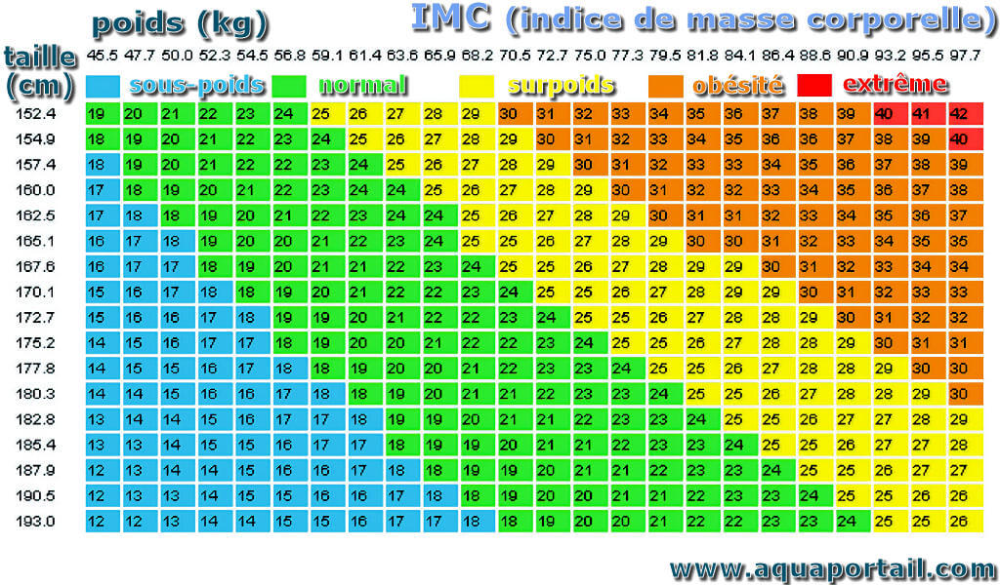

Je retire les lignes qui contiennent des valeurs inférieures à 10 et supérieures à 50

In [9]:
df = df.loc[(df['bmi']>10)|(df['bmi'].isna()),:]
df = df.loc[(df['bmi']<50)|(df['bmi'].isna()),:]

In [10]:
for col in df.select_dtypes('object'):
    print("_____",col) 
    print("nbr_nan:",df[col].isna().sum())
    print("valeurs uniques :",df[col].nunique())
    print(df[col].unique()[:5])
    print(df[col].value_counts())
    print("_ _ _ _ _ _ _ _ _ _") 
    print("_ _ _ _ _ _ _ _ _ _") 

_____ gender
nbr_nan: 0
valeurs uniques : 3
['Male' 'Female' 'Other']
gender
Female    2935
Male      2095
Other        1
Name: count, dtype: int64
_ _ _ _ _ _ _ _ _ _
_ _ _ _ _ _ _ _ _ _
_____ ever_married
nbr_nan: 0
valeurs uniques : 2
['Yes' 'No']
ever_married
Yes    3289
No     1742
Name: count, dtype: int64
_ _ _ _ _ _ _ _ _ _
_ _ _ _ _ _ _ _ _ _
_____ work_type
nbr_nan: 0
valeurs uniques : 5
['Private' 'Self-employed' 'Govt_job' 'children' 'Never_worked']
work_type
Private          2867
Self-employed     809
children          687
Govt_job          646
Never_worked       22
Name: count, dtype: int64
_ _ _ _ _ _ _ _ _ _
_ _ _ _ _ _ _ _ _ _
_____ Residence_type
nbr_nan: 0
valeurs uniques : 2
['Urban' 'Rural']
Residence_type
Urban    2560
Rural    2471
Name: count, dtype: int64
_ _ _ _ _ _ _ _ _ _
_ _ _ _ _ _ _ _ _ _
_____ smoking_status
nbr_nan: 0
valeurs uniques : 4
['formerly smoked' 'never smoked' 'smokes' 'Unknown']
smoking_status
never smoked       1859
Unknown            1523


In [11]:
#Je retire d'abord la ligne dont le genre est 'other' car une valeur ne peut pas représenter une classe.
df= df.loc[df['gender']!='Other',:]

<Axes: >

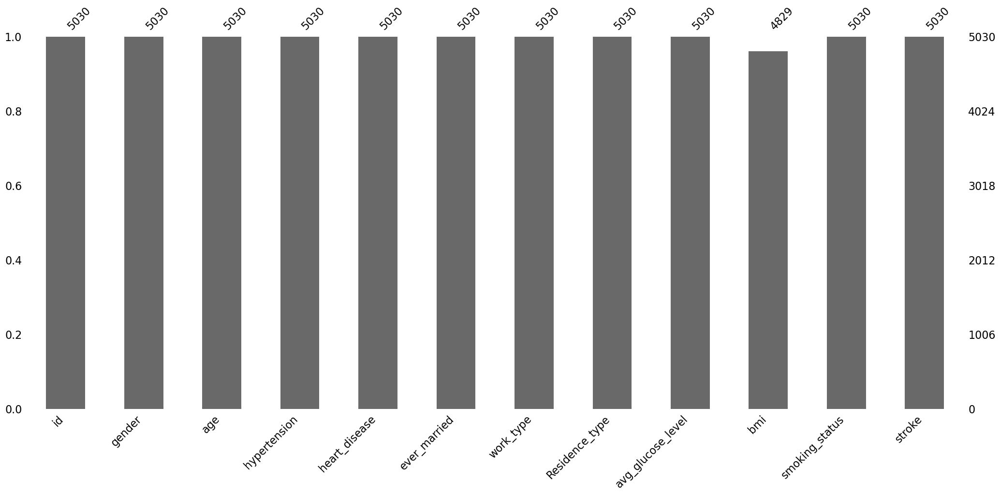

In [12]:
msno.bar(df)

In [13]:
df.loc[df['bmi'].isna()]['bmi'].shape

(201,)

La colonne **bmi** contient 201 valeurs manquantes.  
Avant de choisir une méthode d'imputation, je décide d'observer l'ensemble de mes variables. Cela me permettra de déterminer la méthode optimale d'imputation.

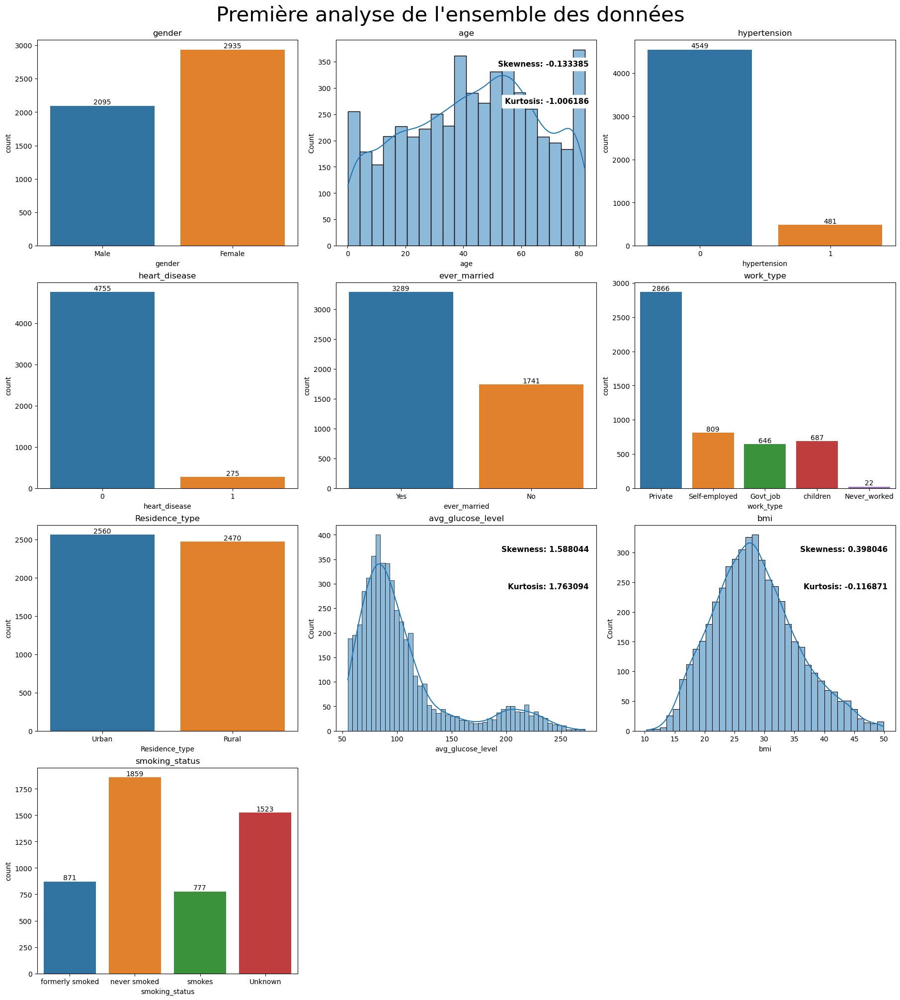

In [14]:
columns = df.columns[1:]

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 20), constrained_layout=True)
plt.suptitle("Première analyse de l'ensemble des données", fontsize=30)

for i, column in enumerate(columns):
    row = i // 3
    col = i % 3

    if df[column].dtype == 'object' or df[column].dtype=='int64':
        sns.countplot(x=column, data=df, ax=axes[row, col])
        axes[row, col].bar_label(axes[row, col].containers[0])
        axes[row, col].set_title(f'{column}')
    else:
        sns.histplot(x=column, data=df, kde=True, ax=axes[row, col])
        axes[row, col].set_title(f'{column}')

        skewness = df[column].skew()
        kurt = df[column].kurt()
        if not pd.isnull(skewness) and not pd.isnull(kurt):
            axes[row, col].text(x=0.97, y=0.90, transform=axes[row, col].transAxes,
                                s="Skewness: %f" % skewness,
                                fontweight='demibold', fontsize=11, verticalalignment='top',
                                horizontalalignment='right', backgroundcolor='white')
            axes[row, col].text(x=0.97, y=0.70, transform=axes[row, col].transAxes,
                                s="Kurtosis: %f" % kurt,
                                fontweight='demibold', fontsize=11, verticalalignment='center',
                                horizontalalignment='right', backgroundcolor='white')

fig.delaxes(axes[3,2])
fig.delaxes(axes[3,1])
plt.show()


Avant de commencer l'analyse des différentes variables, on remarque que la colonne stroke (dite target) est désiquilibrée. Je vais diviser mon dataframe en deux afin d'isoler mes deux groupes stroke (0/1) et relancer mes graphiques.

In [15]:
df_0= df.loc[df['stroke']==0,:];
df_1= df.loc[df['stroke']==1,:]

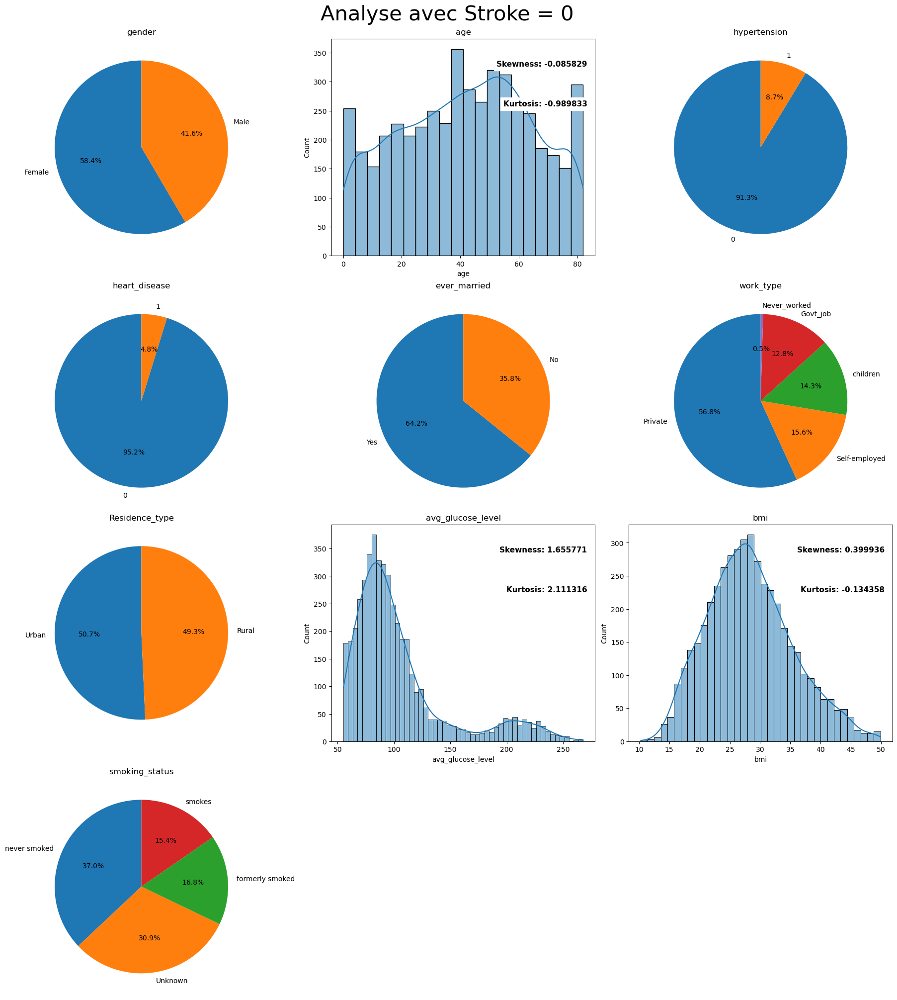

In [16]:
columns = df_0.columns[1:]

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 20), constrained_layout=True)
plt.suptitle("Analyse avec Stroke = 0", fontsize=30)

for i, column in enumerate(columns):
    row = i // 3
    col = i % 3

    if df_0[column].dtype == 'object' or df_0[column].dtype == 'int64':
        proportions = df_0[column].value_counts(normalize=True)
        axes[row, col].pie(proportions, labels=proportions.index, autopct='%1.1f%%', startangle=90)
        axes[row, col].set_title(f'{column}')
    else:
        sns.histplot(x=column, data=df_0, kde=True, ax=axes[row, col])
        axes[row, col].set_title(f'{column}')
        skewness = df_0[column].skew()
        kurt = df_0[column].kurt()
        if not pd.isnull(skewness) and not pd.isnull(kurt):
            axes[row, col].text(x=0.97, y=0.90, transform=axes[row, col].transAxes,
                                s="Skewness: %f" % skewness,
                                fontweight='demibold', fontsize=11, verticalalignment='top',
                                horizontalalignment='right', backgroundcolor='white')
            axes[row, col].text(x=0.97, y=0.70, transform=axes[row, col].transAxes,
                                s="Kurtosis: %f" % kurt,
                                fontweight='demibold', fontsize=11, verticalalignment='center',
                                horizontalalignment='right', backgroundcolor='white')
fig.delaxes(axes[3,2])
fig.delaxes(axes[3,1])
plt.show()


Le coefficient d'asymétrie (Sk, skewness en anglais) évalue le défaut de symétrie d'une distribution:
* Il est **nul pour une distribution symétrique**. 
* Il est **positif pour une distribution étalée à droite**.
* Il est **négatif pour une distribution étalée à gauche.**  

Le coefficient d'aplatissement (K, kurtosis en anglais) évalue la dispersion des valeurs "extrêmes" par référence à la loi normale. 
* Il est **nul pour une distribution normale**
* Il est **négatif pour une distribution moins "aplatie" qu'une distribution normale** 
* Il est **positif sur une distribution plus aplatie qu'une distribution normale.**

**Observations des données des personnes classés 0 (pas d'avc):**  
* On compte 60% de femmes pour 40% d'hommes
* La colonne âge indique un score skewness de -0.08 et un score Kurtosis de -0.98, ce qui nous permet de supposer que malgré une légère asymétrie à gauche et un léger aplatissement par rapport à une distribution normale, cette distribution est relativement proche de la normale.
* 92% des personnes de ce groupe ne souffrent pas d'hypertension
* 95% des personnes de ce groupe n'ont pas de maladies cardiaques.
* 64% des personnes ont déjà été mariés.  
* 57% des personnes travaillent dans le secteur privé
* Il n'y a pas de classe majoritaire dans la colonne residence type
* Pour la colonne avg glucose level, les valeurs indiquent une distribution qui est à la fois asymétrique vers la droite (skewness positif) et a des pics plus élevés par rapport à une distribution normale (kurtosis positif). 
* La colonne bmi indique une asymétrie à droite (présence d'outliers) et une distribution plus élevée que la normale.

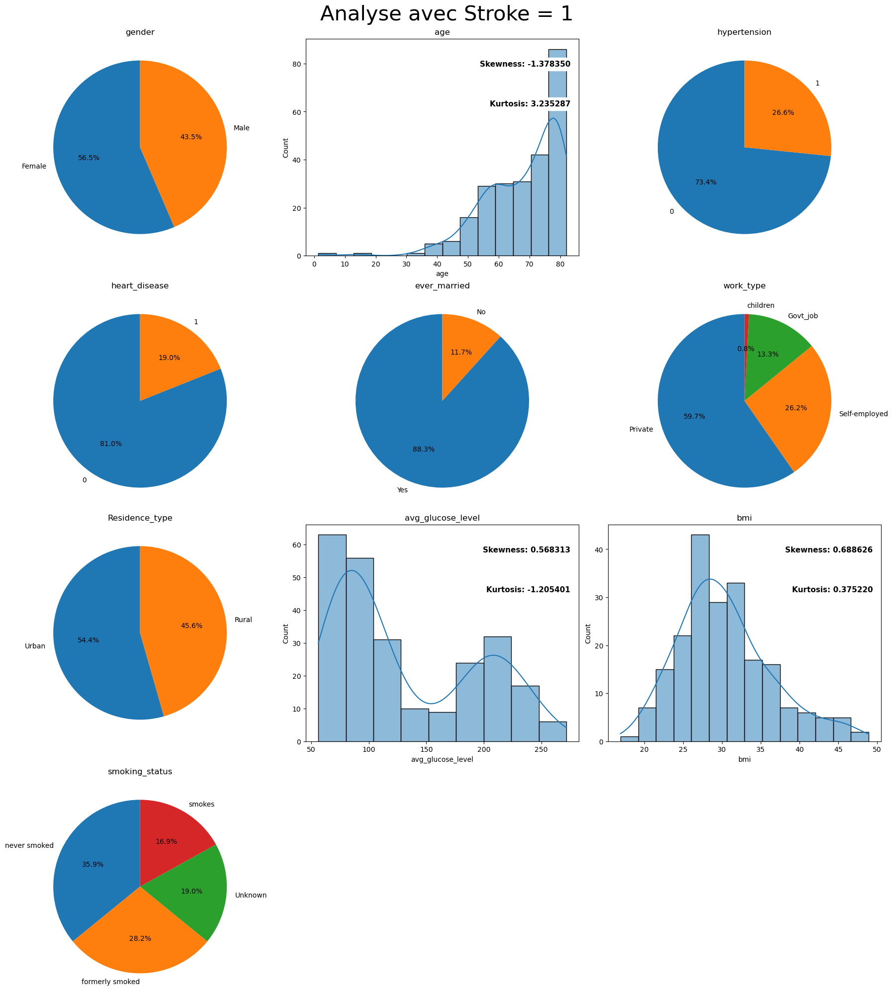

In [17]:
columns = df_1.columns[1:]

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 20), constrained_layout=True)
plt.suptitle("Analyse avec Stroke = 1", fontsize=30)


for i, column in enumerate(columns):
    row = i // 3
    col = i % 3

    if df_1[column].dtype == 'object' or df_1[column].dtype == 'int64':
        proportions = df_1[column].value_counts(normalize=True)
        axes[row, col].pie(proportions, labels=proportions.index, autopct='%1.1f%%', startangle=90)
        axes[row, col].set_title(f'{column}')
    else:
        sns.histplot(x=column, data=df_1, kde=True, ax=axes[row, col])
        axes[row, col].set_title(f'{column}')
        skewness = df_1[column].skew()
        kurt = df_1[column].kurt()
        if not pd.isnull(skewness) and not pd.isnull(kurt):
            axes[row, col].text(x=0.97, y=0.90, transform=axes[row, col].transAxes,
                                s="Skewness: %f" % skewness,
                                fontweight='demibold', fontsize=11, verticalalignment='top',
                                horizontalalignment='right', backgroundcolor='white')
            axes[row, col].text(x=0.97, y=0.70, transform=axes[row, col].transAxes,
                                s="Kurtosis: %f" % kurt,
                                fontweight='demibold', fontsize=11, verticalalignment='center',
                                horizontalalignment='right', backgroundcolor='white')

fig.delaxes(axes[3, 2])
fig.delaxes(axes[3, 1])
plt.show()


**Observartions des données des personnes classés 1 (avc):**
* La colonne 'gender' comprend 56% de femmes.
* La colonne âge indique une asymétrie à droite avec un skewness à -1.37 et un applatissement plus haut que pour une distribution normale. 
* 73% des personnes de ce groupe n'ont pas d'hypertension
* 81% des personnes de ce groupe n'ont pas de maladies cardiaques
* 88% des personnes ont déjà été mariés
* 59% des personnes travaillent dans le secteur privé
* 55% des personnes vivent en région urbaine
* La colonne avg_glucose est de type bimodale ce qui sous entend qu'il y a 2 sous ensembles au sein de cette catégorie (une concentration entre 50 et 150 et une autre entre 150 et 250)
* Pour la colonne bmi, les valeurs suggèrent une distribution légèrement asymétrique vers la droite, avec une concentration de valeurs plus importante autour de la moyenne et des extrémités plus épaisses que dans une distribution normale. Le score du kurtosis relativement faible indique que la distribution a des pics qui ne sont pas très élevés par rapport à une distribution normale.
* 36% des personnes de ce groupe n'ont jamais fumé et 28% sont des anciens fumeurs.

Nos deux groupes présentent des caractéristiques différentes. C'est pour cette raison que j'ai choisi d'utiliser la méthode d'imputation KNN Imputer.

In [18]:
df_nan = df.loc[df['bmi'].isna(),:]

Pour imputer les valeurs manquantes, je décide de commencer par encoder mes variables catégorielles et de standardiser mes valeurs afin d'appliquer un KNNImputer.

## Encodage

**Définition: un encodeur est utilisé pour convertir des variables catégorielles en une variable numérique afin de pouvoir les utiliser sur des modèles de machine learning, qui travaillent généralement avec des données numériques.**. 

Il existe différents type d'encodeurs:  

**LabelEncoder:**  

Il convertit chaque classe unique d'une variable catégorielle en un nombre entier. Utile lorsque l'ordre des catégories n'a pas d'importance.  

**OneHotEncoder:** 

Il crée une colonne binaire distincte pour chaque catégorie unique. Utile lorsque l'ordre des catégories n'a pas d'importance.  

**OrdinalEncoder:**

Il ressemble au LabelEncoder, mais avec la possibilité de spécifier un ordre explicite des catégories.

Pour mon jeu de données, je décide d'utiliser le One Hot Encodeur.

## Standardisation (normalisation)

La standardisation des données, également appelée *normalisation*, fait référence au processus de transformation des données brutes en une forme standardisée. La plupart du temps, cela implique de procéder à la modification des données afin que ces dernières obtiennent **une moyenne de zéro et un écart-type de un**.

Pour pouvoir utiliser le KNN Imputer, je dois aussi mettre à l'échelle mes données.  
Sklearn propose 3 types de standardiseurs :  
* **Standard Scaler** : Il standardise les données en les centrant autour de zéro (moyenne = 0) et en les mettant à l'échelle en fonction de l'écart type.   
* **Min Max Scaler** : Il met à l'échelle les données dans une plage spécifique, généralement entre 0 et 1. Il est utile lorsque les données ont une distribution non normale ou avec des algorithmes sensibles à l'échelle.  
* **Robust Scaler** : Il utilise des statistiques robustes en éliminant les médianes et en échelonnant les données en fonction des quantiles. Cela le rend robuste aux valeurs aberrantes.

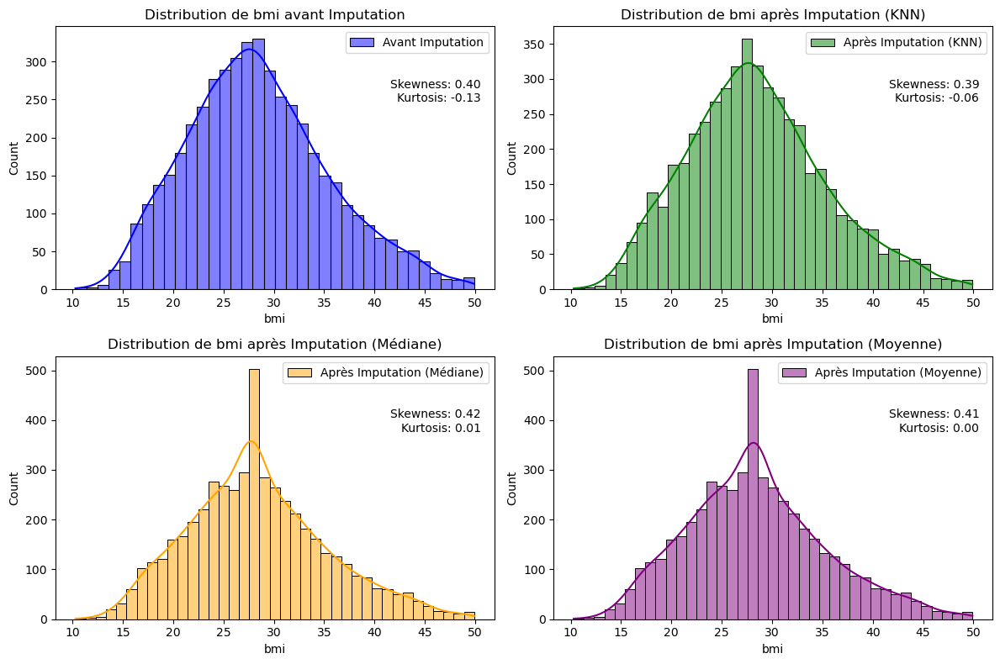

In [19]:
df_knn_imputed = impute_and_plot(df_0, df_1, df)    

En comparant les différentes méthodes d'imputations, je décide de garder le KNNImputer car ses scores skewness et Kurtosis sont ceux qui sont les plus proches de la distribution avant imputation.

In [20]:
df.set_index('id', inplace=True)
df_knn_imputed.set_index('id',inplace=True)
df_index = df.index

df['bmi'] = df_knn_imputed['bmi'].values

df.index = df_index

## colonne smoking-status

In [21]:
unknown = df.loc[df['smoking_status']=='Unknown'][['gender','age','hypertension','heart_disease','ever_married','work_type','Residence_type','avg_glucose_level','bmi','stroke']]

In [22]:
unknown['stroke'].value_counts()

stroke
0    1476
1      47
Name: count, dtype: int64

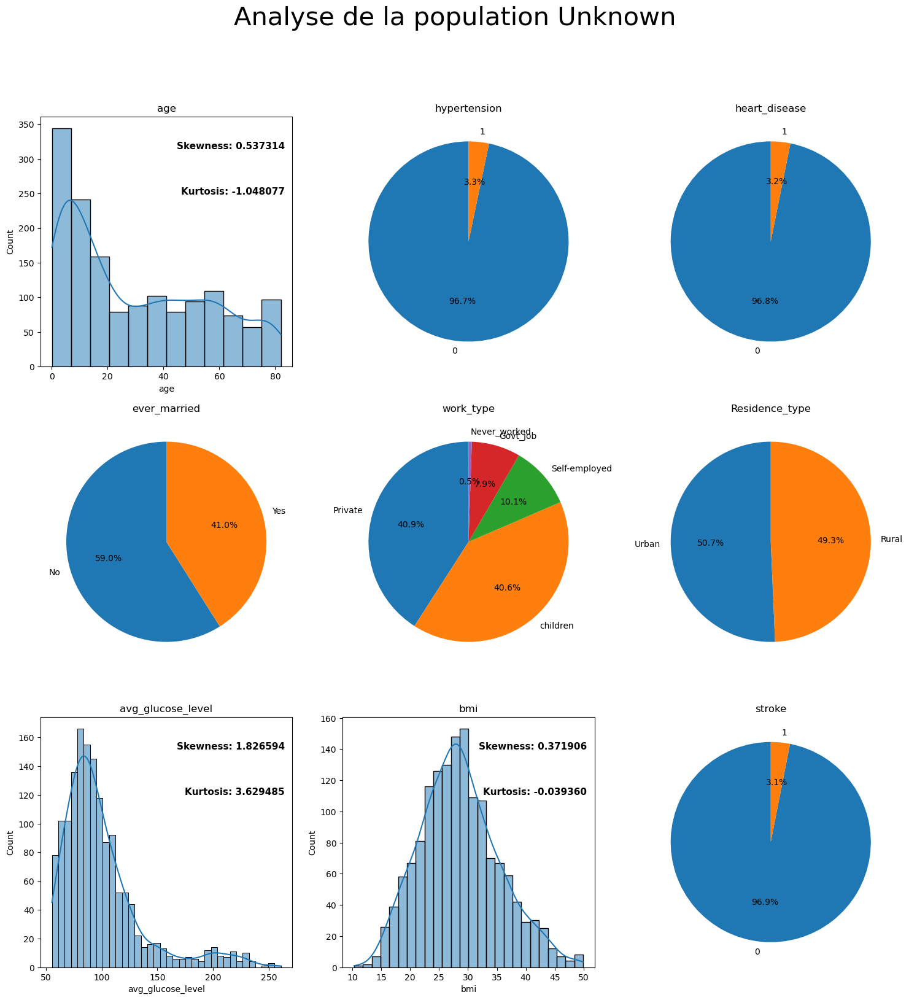

In [23]:
columns = unknown.columns[1:]

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 18))
plt.suptitle('Analyse de la population Unknown', fontsize=30)

for i, column in enumerate(columns):
    row = i // 3
    col = i % 3

    if unknown[column].dtype == 'object' or unknown[column].dtype == 'int64':
        proportions = unknown[column].value_counts(normalize=True)
        axes[row, col].pie(proportions, labels=proportions.index, autopct='%1.1f%%', startangle=90)
        axes[row, col].set_title(f'{column}')
    else:
        sns.histplot(x=column, data=unknown, kde=True, ax=axes[row, col])
        axes[row, col].set_title(f'{column}')
        skewness = unknown[column].skew()
        kurt = unknown[column].kurt()
        if not pd.isnull(skewness) and not pd.isnull(kurt):
            axes[row, col].text(x=0.97, y=0.90, transform=axes[row, col].transAxes,
                                s="Skewness: %f" % skewness,
                                fontweight='demibold', fontsize=11, verticalalignment='top',
                                horizontalalignment='right', backgroundcolor='white')
            axes[row, col].text(x=0.97, y=0.70, transform=axes[row, col].transAxes,
                                s="Kurtosis: %f" % kurt,
                                fontweight='demibold', fontsize=11, verticalalignment='center',
                                horizontalalignment='right', backgroundcolor='white')


#plt.tight_layout()
plt.show()


**Observations:**  
* Une grande proportion des individus dans ce jeu sont des enfants, il sera facile d'imputer la valeur manquante de smoking status par 'Never smoked'
* Vérifier la colonne work_type qui semble contenir des informations errronées. (enfant de 7 ans noté comme 'self-employed'). 
* 

In [24]:
df['smoking_status'].value_counts()

smoking_status
never smoked       1859
Unknown            1523
formerly smoked     871
smokes              777
Name: count, dtype: int64

In [25]:
df.loc[(df['age']<17)&(df['smoking_status']=='Unknown'),'smoking_status']='never smoked'
df.loc[(df['work_type']=="children"),'smoking_status']='never smoked'


In [26]:
df['smoking_status'].value_counts()

smoking_status
never smoked       2531
Unknown             866
formerly smoked     858
smokes              775
Name: count, dtype: int64

In [27]:
df.loc[df['age']<14]['work_type'].value_counts()

work_type
children         630
Private           10
Never_worked       3
Self-employed      2
Name: count, dtype: int64

In [28]:
df.loc[df['age']<14,'work_type']='children'
df.loc[df['work_type']=='children','smoking_status']='never smoked'

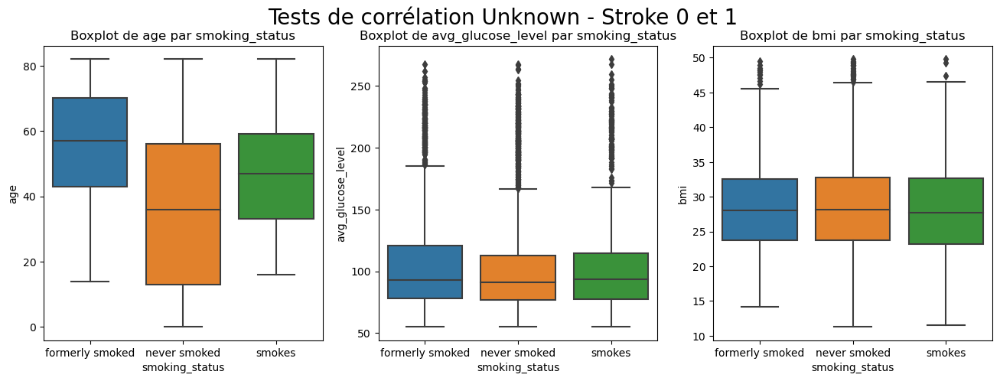

Variable: age
Statistique F : 280.2725351827424
p-valeur : 6.438654265547958e-115

Variable: avg_glucose_level
Statistique F : 14.049590926998032
p-valeur : 8.295644268568247e-07

Variable: bmi
Statistique F : 1.0211327609122602
p-valeur : 0.3602769451638911


Variable catégorielle: gender
Statistique du test du khi-deux d'indépendance : 11.611151525101784
************** p-valeur : 0.0030107207936772226



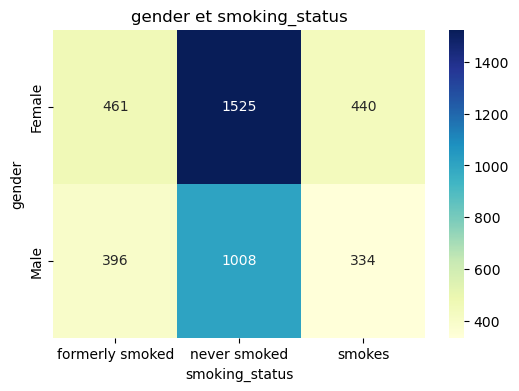


Variable catégorielle: hypertension
Statistique du test du khi-deux d'indépendance : 16.22645141181306
************** p-valeur : 0.0002995510494835941



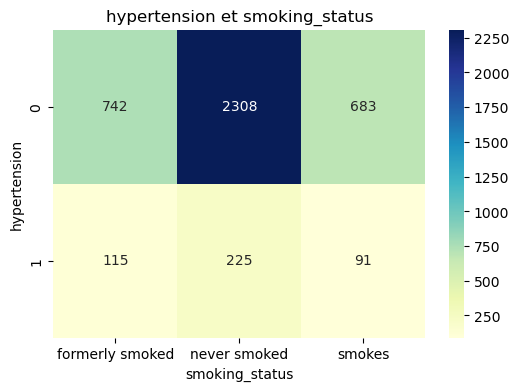


Variable catégorielle: heart_disease
Statistique du test du khi-deux d'indépendance : 47.13287011138762
************** p-valeur : 5.82407953510398e-11



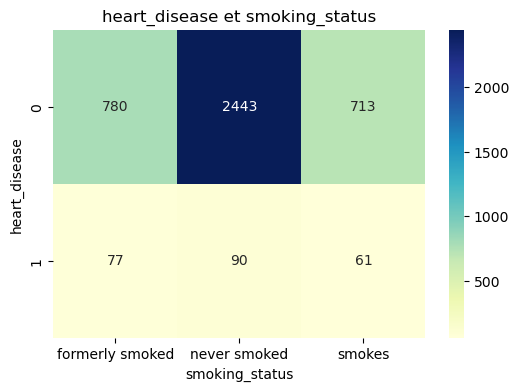


Variable catégorielle: ever_married
Statistique du test du khi-deux d'indépendance : 365.3439113331855
************** p-valeur : 4.6406376108593305e-80



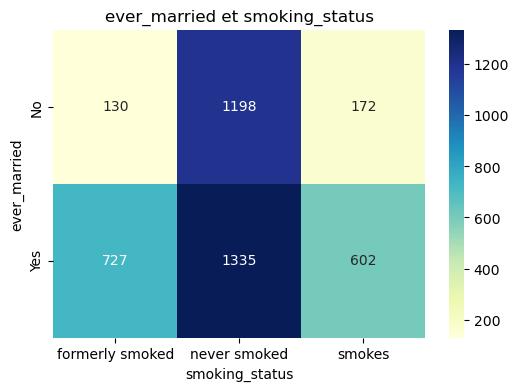


Variable catégorielle: work_type
Statistique du test du khi-deux d'indépendance : 582.2636414501945
************** p-valeur : 1.5193484951617668e-120



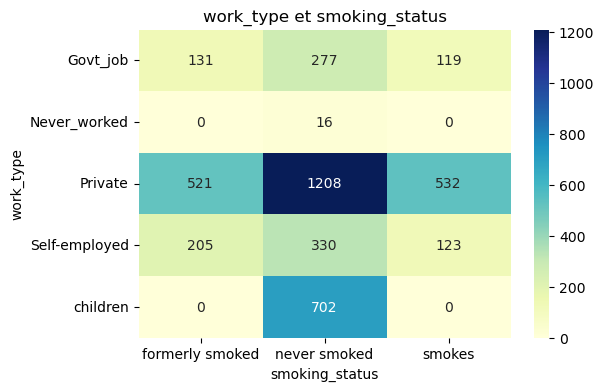


Variable catégorielle: Residence_type
Statistique du test du khi-deux d'indépendance : 5.7904197021818575
************** p-valeur : 0.05528742175147765



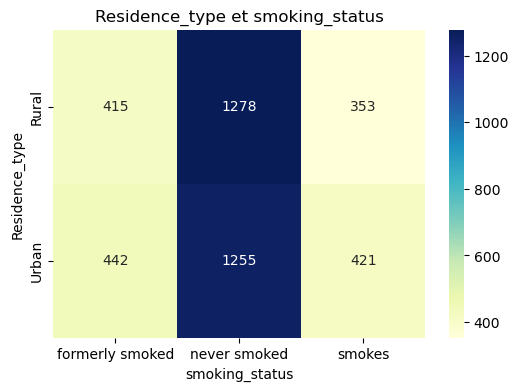


Variable catégorielle: smoking_status
Statistique du test du khi-deux d'indépendance : 8328.0
************** p-valeur : 0.0



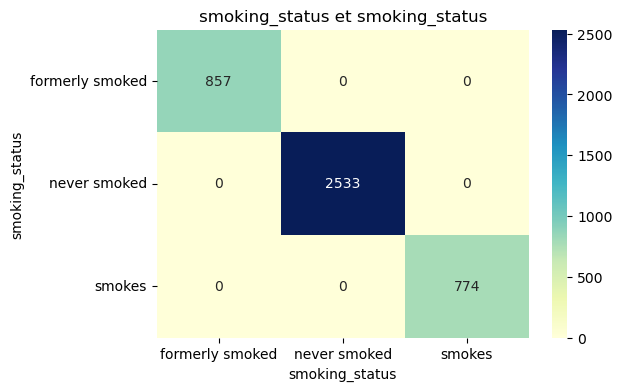

In [29]:
df_no_unknown_0 = df.loc[(df['smoking_status'] != 'Unknown') & (df['stroke'] == 0), :]
df_no_unknown_1 = df.loc[(df['smoking_status'] != 'Unknown') & (df['stroke'] == 1), :]
df_unknown = df.loc[(df['smoking_status'] != 'Unknown'),:]


numeric_columns = df_unknown.select_dtypes(include='float').columns

plt.figure(figsize=(16, 5))
plt.suptitle("Tests de corrélation Unknown - Stroke 0 et 1", fontsize=20)
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(1, 3, i)
    sns.boxplot(x='smoking_status', y=column, data=df_unknown)
    plt.title(f'Boxplot de {column} par smoking_status')

plt.show()

for column in numeric_columns:
    groups = [group_data[column].dropna() for group, group_data in df_unknown.groupby('smoking_status')]
    f_statistic, p_value = f_oneway(*groups)

    print(f"Variable: {column}")
    print(f"Statistique F : {f_statistic}")
    print(f"p-valeur : {p_value}")
    print("")


categorical_columns = df_unknown.select_dtypes(include=['object','int']).columns  
for column in categorical_columns[:-1]:
    contingency_table = pd.crosstab(df_unknown[column], df_unknown['smoking_status'])
    print("")
    chi2_stat, p_val, _, _ = chi2_contingency(contingency_table)
    print(f"Variable catégorielle: {column}")
    print(f"Statistique du test du khi-deux d'indépendance : {chi2_stat}")
    print(f"************** p-valeur : {p_val}")
    print("")

    plt.figure(figsize=(6, 4))
    sns.heatmap(contingency_table, annot=True, cmap="YlGnBu", fmt="d")
    plt.title(f'{column} et smoking_status')
    plt.xlabel('smoking_status')
    plt.ylabel(column)
    plt.show()
    

J'ai réalisé des tests anova et de khi2 afin de déterminer quelles variables sont corrélées à la colonne smoking_status.  
**Colonnes corrélées :**
* Age
* Avg_glucose_level
* gender
* hypertension
* heart_disease
* ever_married
* work_type

In [30]:
df_copy = df.copy()
bins = [0, 20, 30, 40, 50, 60, 80,float('inf')]
labels = ['0-20', '21-30', '31-40', '41-50', '51-60', '61-80','81+']

df_copy['age_cat'] = pd.cut(df_copy['age'], bins=bins, labels=labels, right=False)
df_copy['age_cat'] = df_copy['age_cat'].astype('object')

df_copy['smoking_status'] = df_copy['smoking_status'].replace('Unknown', np.nan)

In [31]:
df_copy['work_type'].value_counts(normalize=True)

work_type
Private          0.567793
Self-employed    0.160437
children         0.139563
Govt_job         0.128429
Never_worked     0.003777
Name: proportion, dtype: float64

* 56% des individus travaillent dans le secteur privé.  

In [32]:
df_sans_child = df_copy.loc[(df_copy["work_type"]!='children')&(~df_copy["smoking_status"].isna()),:]

J'effectue une nouvelle analyse en retirant les enfants afin de diminuer la part de non-fumeurs et ainsi voir si cela va modifier le mode qui actuellement est **'Never Smoked'**

In [33]:
df_sans_child.groupby('smoking_status')['work_type'].value_counts()

smoking_status   work_type    
formerly smoked  Private           521
                 Self-employed     205
                 Govt_job          131
never smoked     Private          1208
                 Self-employed     330
                 Govt_job          277
                 Never_worked       16
smokes           Private           532
                 Self-employed     123
                 Govt_job          119
Name: count, dtype: int64

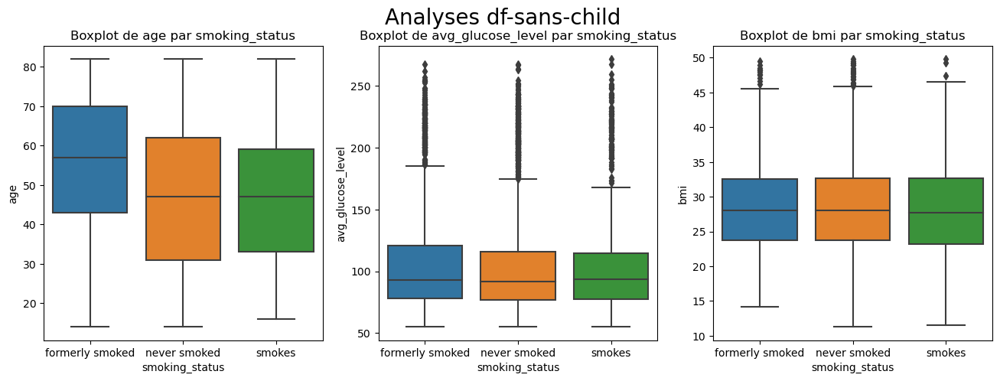

Variable: age
Statistique F : 67.84088675858587
p-valeur : 1.2596485244522114e-29

Variable: avg_glucose_level
Statistique F : 4.4264786889624075
p-valeur : 0.012024322860751245

Variable: bmi
Statistique F : 0.8033048394276867
p-valeur : 0.4479299856765372


Variable catégorielle: gender
Statistique du test du khi-deux d'indépendance : 36.659089207671734
************** p-valeur : 1.095418125458829e-08



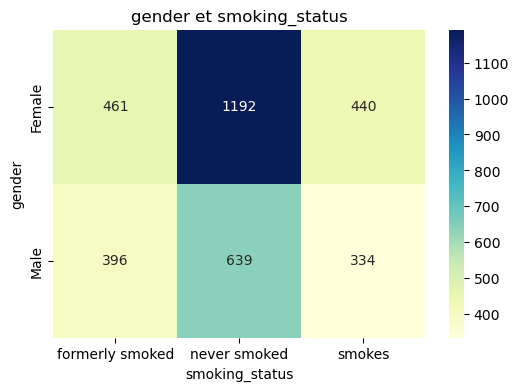


Variable catégorielle: hypertension
Statistique du test du khi-deux d'indépendance : 1.1229460043317925
************** p-valeur : 0.5703682910426895



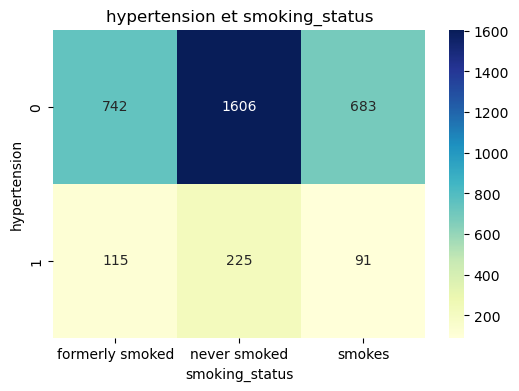


Variable catégorielle: heart_disease
Statistique du test du khi-deux d'indépendance : 19.058244062082665
************** p-valeur : 7.27034273320638e-05



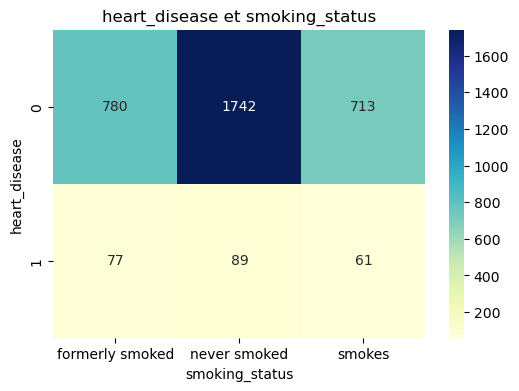


Variable catégorielle: ever_married
Statistique du test du khi-deux d'indépendance : 47.147757865310815
************** p-valeur : 5.780886763914416e-11



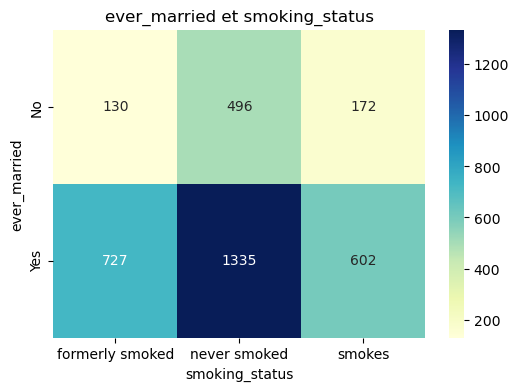


Variable catégorielle: work_type
Statistique du test du khi-deux d'indépendance : 34.239341782276774
************** p-valeur : 6.048013788373141e-06



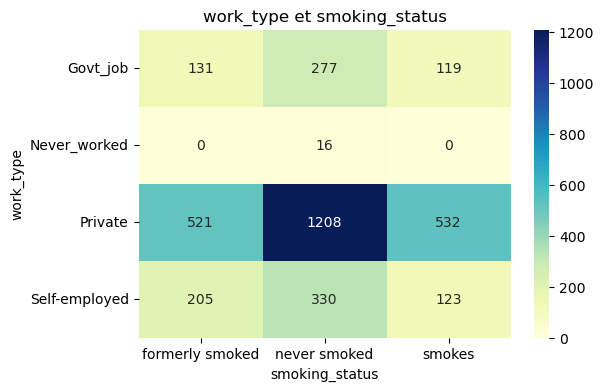


Variable catégorielle: Residence_type
Statistique du test du khi-deux d'indépendance : 6.1686287668879505
************** p-valeur : 0.04576139791918455



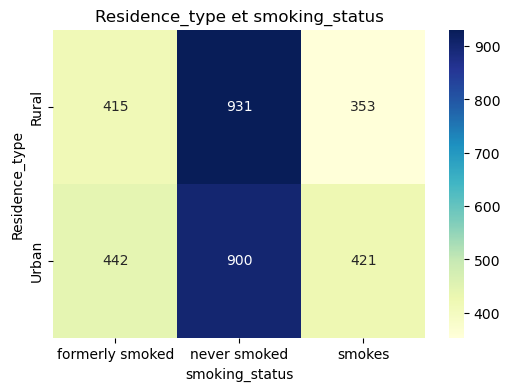


Variable catégorielle: smoking_status
Statistique du test du khi-deux d'indépendance : 6924.0
************** p-valeur : 0.0



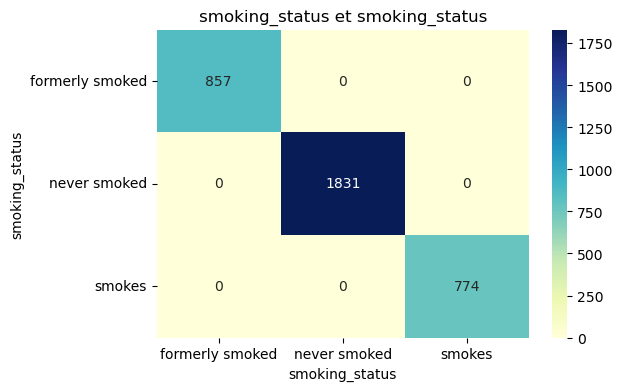


Variable catégorielle: stroke
Statistique du test du khi-deux d'indépendance : 11.93855422603554
************** p-valeur : 0.002556088514404439



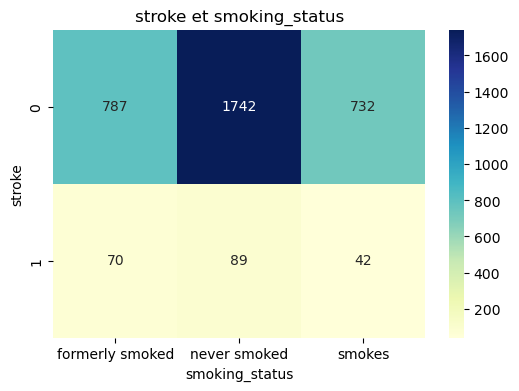


Variable catégorielle: age_cat
Statistique du test du khi-deux d'indépendance : 197.7765438890342
************** p-valeur : 9.38003321270563e-36



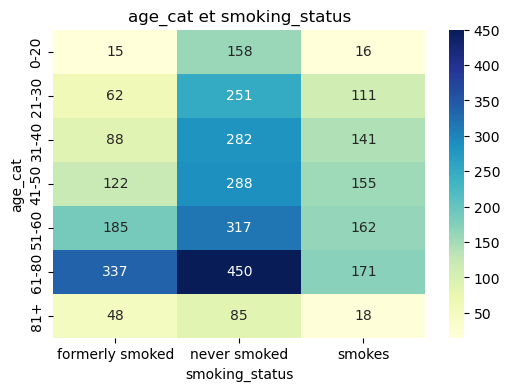

In [34]:
numeric_columns = df_sans_child.select_dtypes(include='float').columns

plt.figure(figsize=(16, 5))
plt.suptitle("Analyses df-sans-child", fontsize=20)
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(1, 3, i)
    sns.boxplot(x='smoking_status', y=column, data=df_sans_child)
    plt.title(f'Boxplot de {column} par smoking_status')

plt.show()

for column in numeric_columns:
    groups = [group_data[column].dropna() for group, group_data in df_sans_child.groupby('smoking_status')]
    f_statistic, p_value = f_oneway(*groups)

    print(f"Variable: {column}")
    print(f"Statistique F : {f_statistic}")
    print(f"p-valeur : {p_value}")
    print("")


categorical_columns = df_sans_child.select_dtypes(include=['object','int']).columns  
for column in categorical_columns:
    contingency_table = pd.crosstab(df_sans_child[column], df_sans_child['smoking_status'])
    print("")
    chi2_stat, p_val, _, _ = chi2_contingency(contingency_table)
    print(f"Variable catégorielle: {column}")
    print(f"Statistique du test du khi-deux d'indépendance : {chi2_stat}")
    print(f"************** p-valeur : {p_val}")
    print("")
    plt.figure(figsize=(6, 4))
    sns.heatmap(contingency_table, annot=True, cmap="YlGnBu", fmt="d")
    plt.title(f'{column} et smoking_status')
    plt.xlabel('smoking_status')
    plt.ylabel(column)
    plt.show()
    

Les différents tests effectués indiquent que malgré le retrait de la classe 'children', la majorité des individus de ce jeu de données sont de type **non fumeur**.  

La méthode d'imputation par le mode (la classe la plus fréquente) indique que c'est cette classe qui sera imputée aux valeurs manquantes de la colonne smoking_status.  
Toutefois, le test khi2 entre la variable age_cat et smoking_status révèle une part importante de fumeur entre 61 et 80 ans.  

Je décide d'imputer cette catégorie en tant que fumeurs et le reste sera imputé par non fumeur.


In [35]:
df_copy.loc[(df_copy['age_cat']=='61-80')&(df_copy['smoking_status'].isna()),'smoking_status']='smokes'
df_copy_1 = df_copy.loc[df_copy['ever_married']=='Yes',:]
df_copy_0 = df_copy.loc[df_copy['ever_married']=='No',:]

column_with_missing_values = 'smoking_status'

mode_value_0 = df_copy_0[column_with_missing_values].mode()[0]
mode_value_1 = df_copy_1[column_with_missing_values].mode()[0]

df_copy_0[column_with_missing_values].fillna(mode_value_0, inplace=True)
df_copy_1[column_with_missing_values].fillna(mode_value_1, inplace=True)

print(mode_value_0)
print(mode_value_1)


never smoked
never smoked


In [36]:
df_cleaned = pd.concat([df_copy_0,df_copy_1],axis=0)

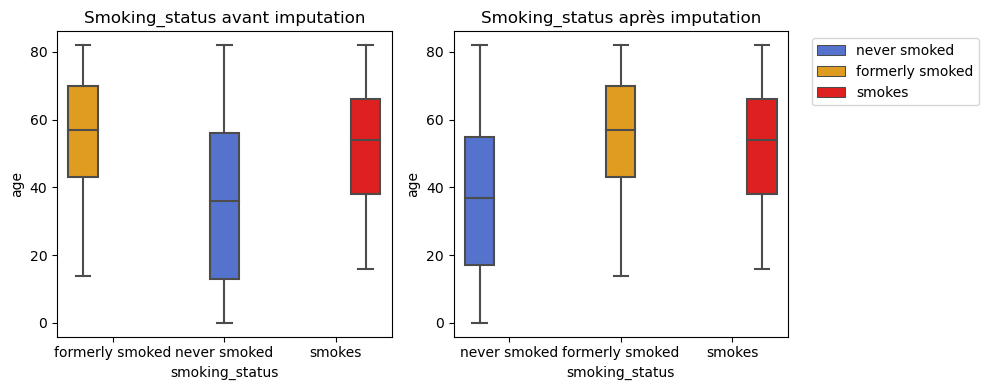

In [37]:
palette = {'smokes': 'red', 'never smoked': 'royalblue', 'formerly smoked': 'orange'}
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

sns.boxplot(data=df_copy, x='smoking_status', y='age', hue='smoking_status', palette=palette, ax=axes[0])
axes[0].legend().set_visible(False)  
axes[0].set_title('Smoking_status avant imputation')

sns.boxplot(data=df_cleaned, x='smoking_status', y='age', hue='smoking_status', palette=palette, ax=axes[1])
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left') 
axes[1].set_title('Smoking_status après imputation')

plt.tight_layout()
plt.show()

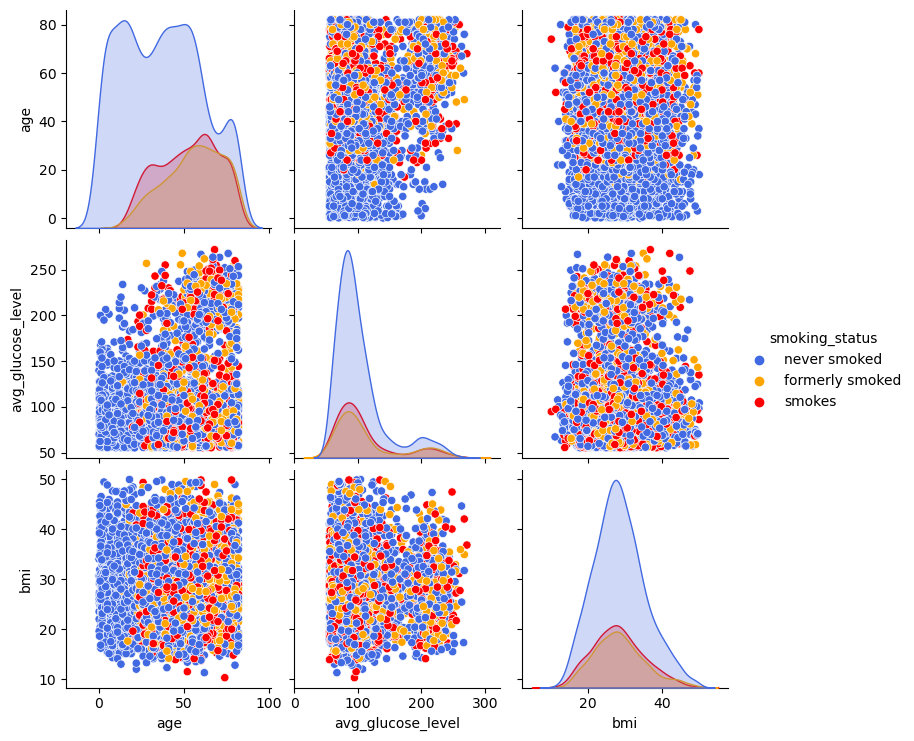

In [38]:
sns.pairplot(data=df_cleaned.select_dtypes(exclude='int'),hue='smoking_status',palette=palette)

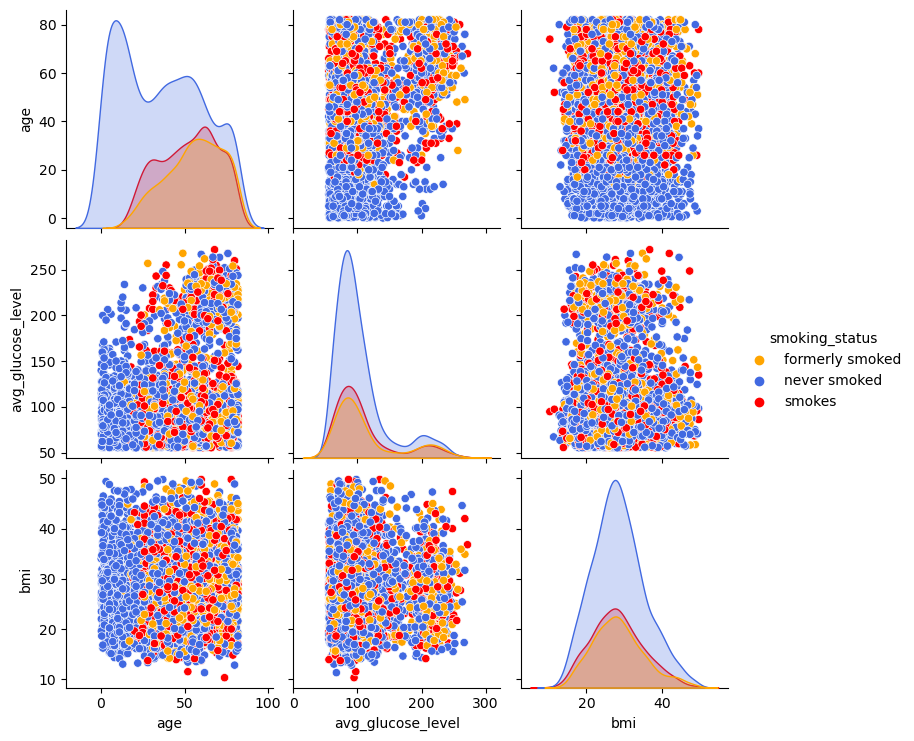

In [39]:
sns.pairplot(data=df_copy.select_dtypes(exclude='int'),hue='smoking_status',palette=palette)

L'imputation semble correcte car nous retrouvons le même type de distribution entre les catégories de smoking_status avant et après imputation par rapport aux autres variables même si il faut noter une modification de la distribution de la colonne âge.

In [40]:
df_cleaned.to_csv('df_cleaned.csv')

In [41]:
df_cleaned = df_cleaned.drop('age_cat',axis=1)

## Test et évaluation des modèles avec un Df sans enfant

In [42]:
df_cleaned = df_cleaned.loc[df_cleaned['work_type']!="children",:]

## Sélection d'une feature pour le modèle

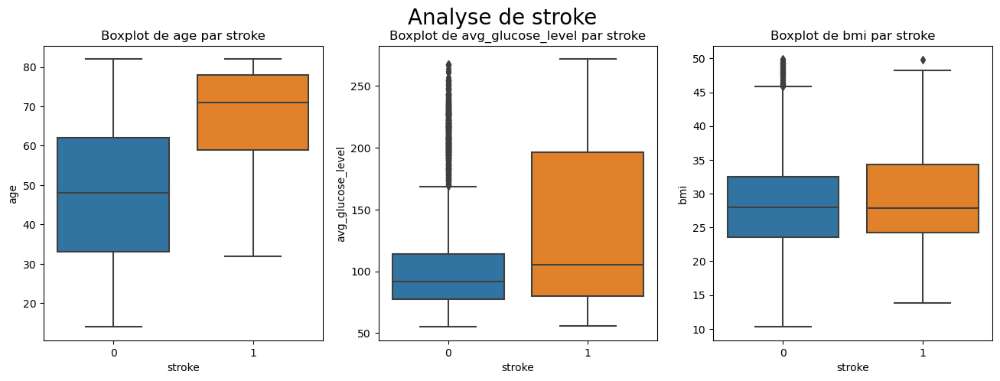

Variable: age
Statistique F : 294.99035461958255
p-valeur : 5.164984885503293e-64

Variable: avg_glucose_level
Statistique F : 74.79419972404119
p-valeur : 7.25323817193612e-18

Variable: bmi
Statistique F : 1.467110664084049
p-valeur : 0.22586828151253507


Variable catégorielle: gender
Statistique du test du khi-deux d'indépendance : 1.5869061907869355
************** p-valeur : 0.2077687103079113



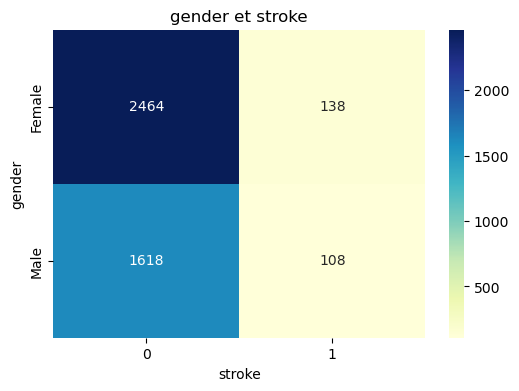


Variable catégorielle: hypertension
Statistique du test du khi-deux d'indépendance : 63.53471880257872
************** p-valeur : 1.5756516595614807e-15



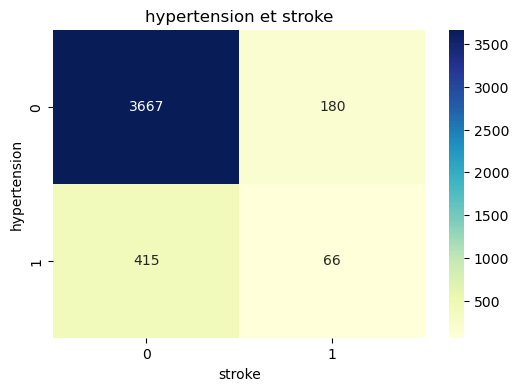


Variable catégorielle: heart_disease
Statistique du test du khi-deux d'indépendance : 69.51341262069045
************** p-valeur : 7.589664169176393e-17



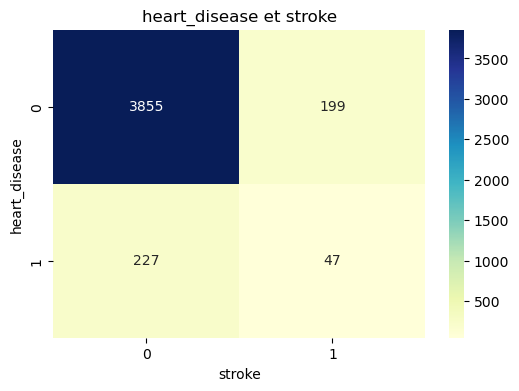


Variable catégorielle: ever_married
Statistique du test du khi-deux d'indépendance : 23.525333139181477
************** p-valeur : 1.2327981008875188e-06



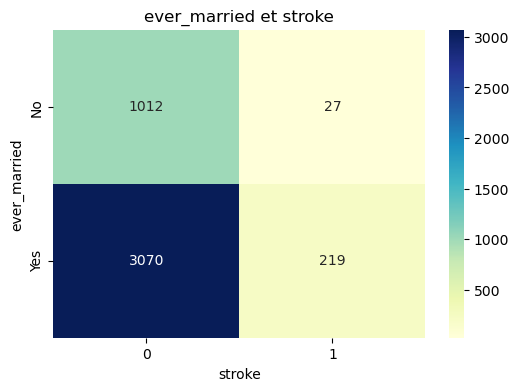


Variable catégorielle: work_type
Statistique du test du khi-deux d'indépendance : 11.345707286317246
************** p-valeur : 0.009996115932380447



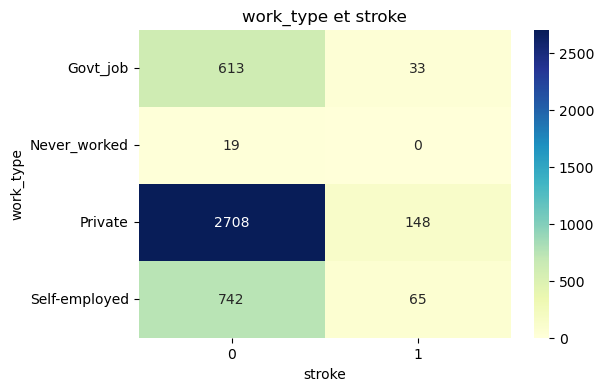


Variable catégorielle: Residence_type
Statistique du test du khi-deux d'indépendance : 1.151054639303865
************** p-valeur : 0.28332848548868184



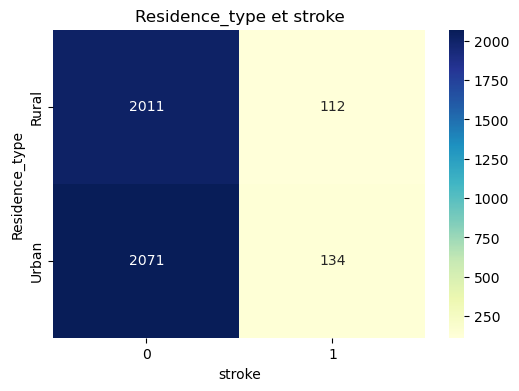

In [43]:
numeric_columns = df_cleaned.select_dtypes(include='float').columns

plt.figure(figsize=(16, 5))
plt.suptitle("Analyse de stroke", fontsize=20)
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(1, 3, i)
    sns.boxplot(x='stroke', y=column, data=df_cleaned)
    plt.title(f'Boxplot de {column} par stroke')

plt.show()

for column in numeric_columns:
    groups = [group_data[column].dropna() for group, group_data in df_cleaned.groupby('stroke')]
    f_statistic, p_value = f_oneway(*groups)

    print(f"Variable: {column}")
    print(f"Statistique F : {f_statistic}")
    print(f"p-valeur : {p_value}")
    print("")


categorical_columns = df_cleaned.select_dtypes(include=['object','int']).columns[:-1]  
for column in categorical_columns[:-1]:
    contingency_table = pd.crosstab(df_cleaned[column], df_cleaned['stroke'])
    print("")
    chi2_stat, p_val, _, _ = chi2_contingency(contingency_table)
    print(f"Variable catégorielle: {column}")
    print(f"Statistique du test du khi-deux d'indépendance : {chi2_stat}")
    print(f"************** p-valeur : {p_val}")
    print("")
    plt.figure(figsize=(6, 4))
    sns.heatmap(contingency_table, annot=True, cmap="YlGnBu", fmt="d")
    plt.title(f'{column} et stroke')
    plt.xlabel('stroke')
    plt.ylabel(column)
    plt.show()
    

Les tests de corrélation montre que les features **age, avg_glucose, hypertension, heart_disease, ever_married, et work_type** indiquent une forte corrélation et peuvent être utilisées pour notre modèle.

## Comparaison de 3 modèles de classification

* regression logistique
* random forest
* SVM

Pour pouvoir comparer mes modèles, je vais créer un fonction qui contiendra :  
* Création du modèle  
* Optimisation du seuil de classification pour maximiser l'AUC *(La ROC curve, aussi appelée courbe de sensitivité/spécificité, est une courbe de probabilité qui permet de visualiser la performance des modèles de classification. Il s’agit ici simplement du taux des True Positive (TPR) tracé en fonction du taux des False Negative (FPR). L’AUC, comprise entre 0 et 1, va elle représenter une mesure du degré de séparabilité des prédictions du modèle : un modèle avec une AUC proche de 1 prédira le plus souvent correctement les 0 comme des 0 et les 1 comme des 1.*)
* Affichage des features importances avant et après optimisation
* Affichage de la courbe ROC avant et après
* Affichage du rapport de classification avant et après optimisation
* Affichage de la matrice de confusion avant et après optimisation
* Utilisation de GridSearch CV *(GridSearchCV est un processus de réglage des hyperparamètres qui permet de déterminer les valeurs optimales pour un modèle.)* 
    

******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': 1, 'n_estimators': 20}
******* Best accuracy: 0.87
******* Best recall: 0.87
******* Best cost: 64.60
******* Best precision score: 0.69
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.67         0.84        365                  0.15   

   True Po

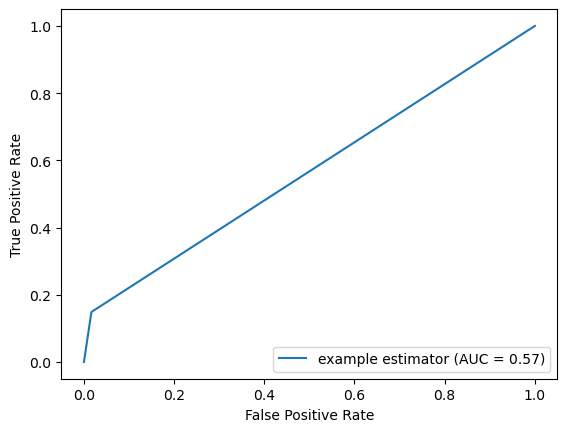

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.98    0.66      0.79   809.00
1                  0.15    0.84      0.25    57.00
accuracy           0.67    0.67      0.67     0.67
macro avg          0.57    0.75      0.52   866.00
weighted avg       0.93    0.67      0.75   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


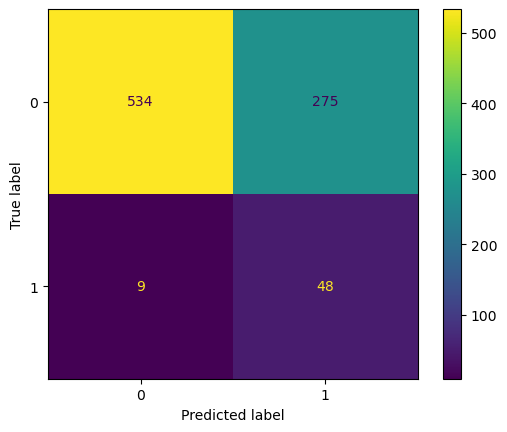

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': {0: 2.0, 1: 2.0}, 'penalty': 'l2'}
Best accuracy:  0.7832147937411096
Best recall:  0.7832147937411096
Best cost:  93.4
Best precision score:  0.7215960633290542
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.83          0.7        303   

   Best precision Score  True Positives  True Negatives       sampling  \
0                  0.23              40             676  undersampling   

    standardisation                                         Best p

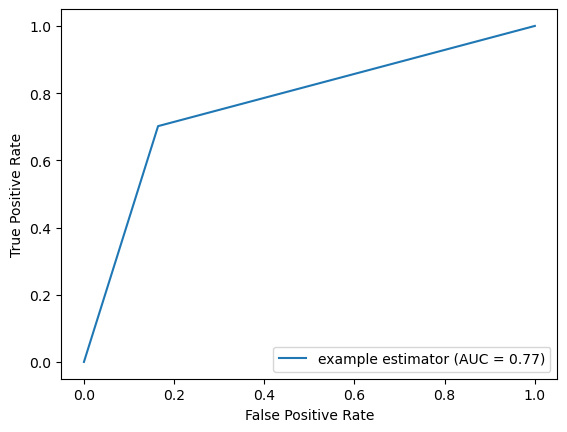

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.98    0.84      0.90   809.00
1                  0.23    0.70      0.35    57.00
accuracy           0.83    0.83      0.83     0.83
macro avg          0.60    0.77      0.62   866.00
weighted avg       0.93    0.83      0.86   866.00
None
Affichage de la matrice de confusion après optimisation


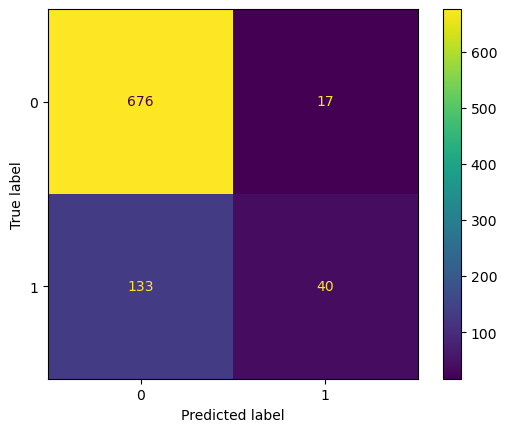

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 1, 'kernel': 'poly'}
******* Best accuracy: 1.00
******* Best recall: 1.00
******* Best cost: 30.60
******* Best precision score: 0.55
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.28          1.0        624                  0.08   

   True Positives  True Negatives       sampling   standardisation  \
0              57             185  undersampling  StandardScaler()   

                                   Best param featur

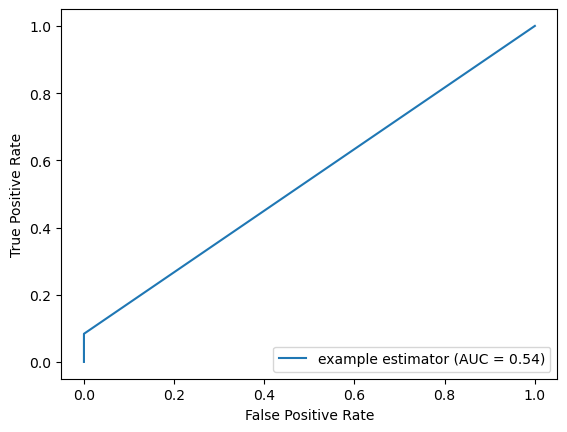

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  1.00    0.23      0.37   809.00
1                  0.08    1.00      0.15    57.00
accuracy           0.28    0.28      0.28     0.28
macro avg          0.54    0.61      0.26   866.00
weighted avg       0.94    0.28      0.36   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


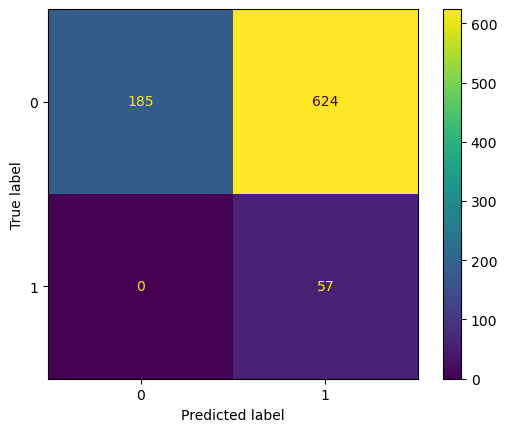

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': 5, 'n_estimators': 10}
******* Best accuracy: 0.88
******* Best recall: 0.88
******* Best cost: 1043.20
******* Best precision score: 0.71
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.73         0.79        343                  0.17   

   

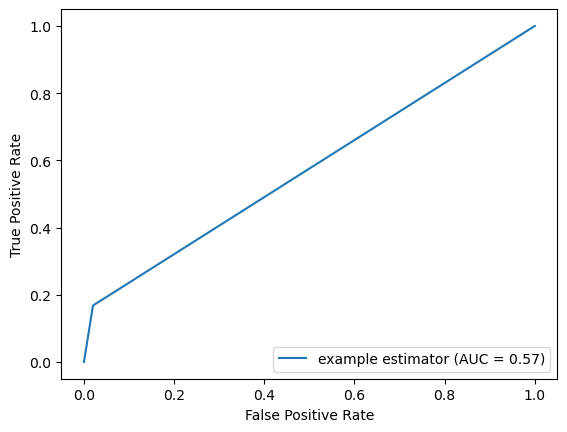

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.98    0.72      0.83   809.00
1                  0.17    0.79      0.28    57.00
accuracy           0.73    0.73      0.73     0.73
macro avg          0.57    0.76      0.55   866.00
weighted avg       0.93    0.73      0.80   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


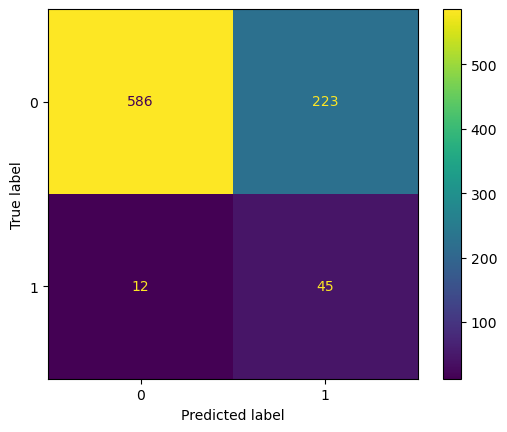

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.7537474613068141
Best recall:  0.7537474613068141
Best cost:  1815.0
Best precision score:  0.7085040442169983
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.83          0.7        303   

   Best precision Score  True Positives  True Negatives      sampling  \
0                  0.23              40             676  oversampling   

    standardisation                                         Best param f

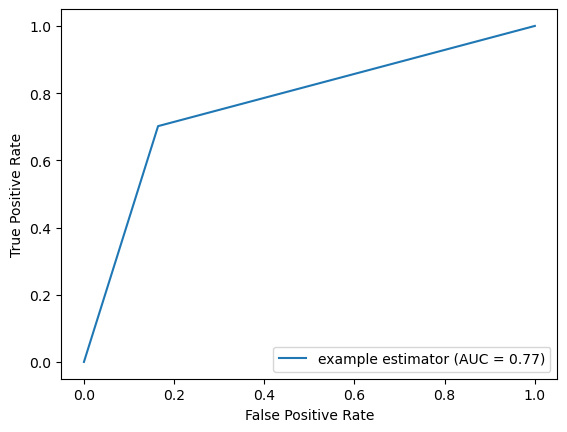

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.98    0.84      0.90   809.00
1                  0.23    0.70      0.35    57.00
accuracy           0.83    0.83      0.83     0.83
macro avg          0.60    0.77      0.62   866.00
weighted avg       0.93    0.83      0.86   866.00
None
Affichage de la matrice de confusion après optimisation


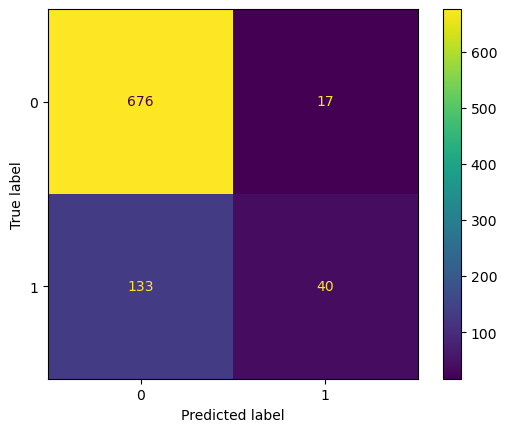

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.1, 'gamma': 0.1, 'kernel': 'poly'}
******* Best accuracy: 0.99
******* Best recall: 0.99
******* Best cost: 531.60
******* Best precision score: 0.57
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.34          1.0        569                  0.09   

   True Positives  True Negatives      sampling   standardisation  \
0              57             240  oversampling  StandardScaler()   

                                   Best param feature

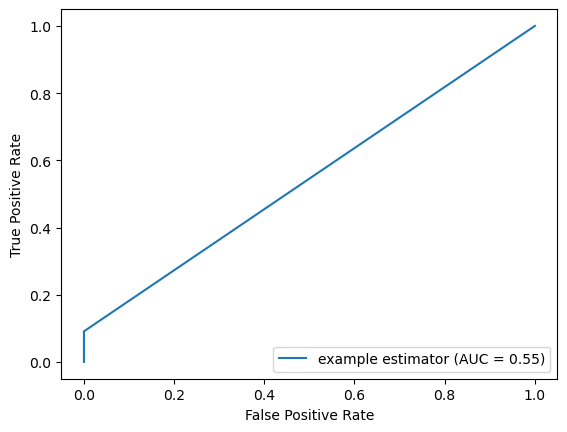

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  1.00    0.30      0.46   809.00
1                  0.09    1.00      0.17    57.00
accuracy           0.34    0.34      0.34     0.34
macro avg          0.55    0.65      0.31   866.00
weighted avg       0.94    0.34      0.44   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


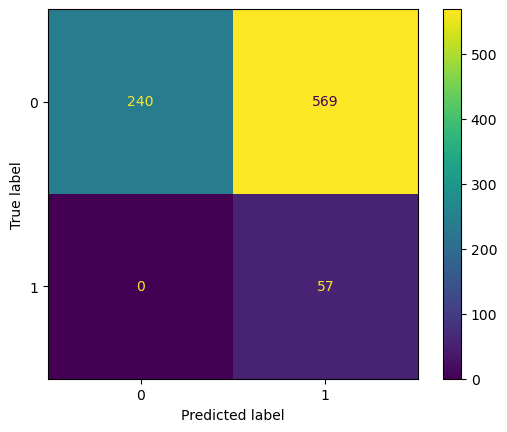

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': 1, 'n_estimators': 10}
******* Best accuracy: 0.86
******* Best recall: 0.86
******* Best cost: 297.60
******* Best precision score: 0.12
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.63         0.88        380                  0.14   

   T

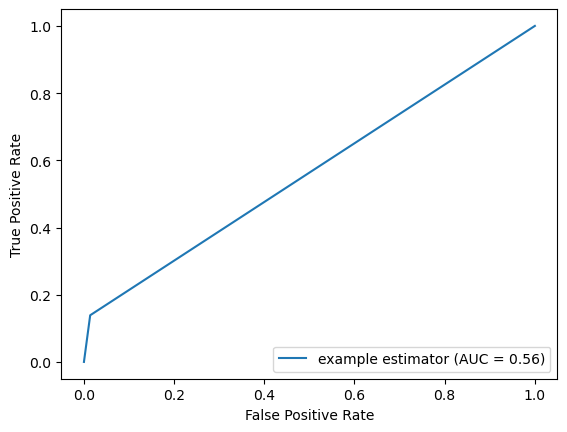

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.99    0.62      0.76   809.00
1                  0.14    0.88      0.24    57.00
accuracy           0.63    0.63      0.63     0.63
macro avg          0.56    0.75      0.50   866.00
weighted avg       0.93    0.63      0.72   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


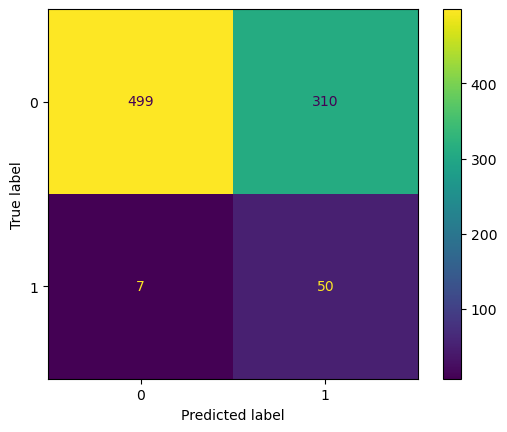

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.7564722617354197
Best recall:  0.7564722617354197
Best cost:  299.2
Best precision score:  0.12114424784865689
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.83          0.7        303   

   Best precision Score  True Positives  True Negatives sampling  \
0                  0.23              40             676     None   

    standardisation                                         Best param feature  
0

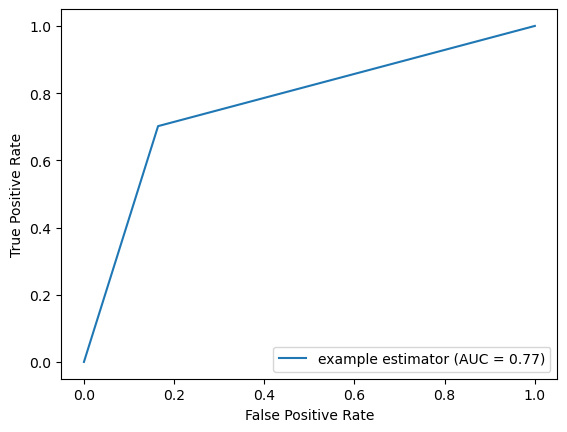

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.98    0.84      0.90   809.00
1                  0.23    0.70      0.35    57.00
accuracy           0.83    0.83      0.83     0.83
macro avg          0.60    0.77      0.62   866.00
weighted avg       0.93    0.83      0.86   866.00
None
Affichage de la matrice de confusion après optimisation


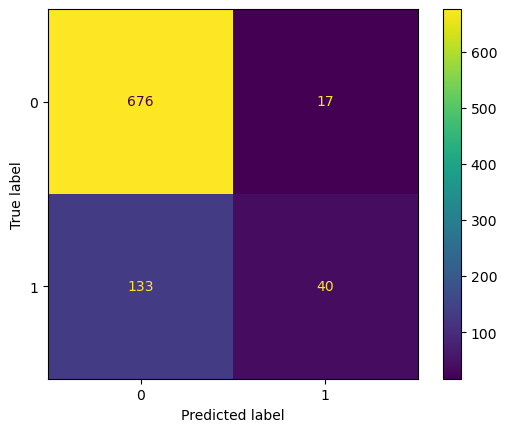

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.00
******* Best recall: 0.00
******* Best cost: 378.00
******* Best precision score: 0.00
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.93          0.0        570                   0.0   

   True Positives  True Negatives sampling   standardisation  \
0               0             809     None  StandardScaler()   

                                       Best param feature  

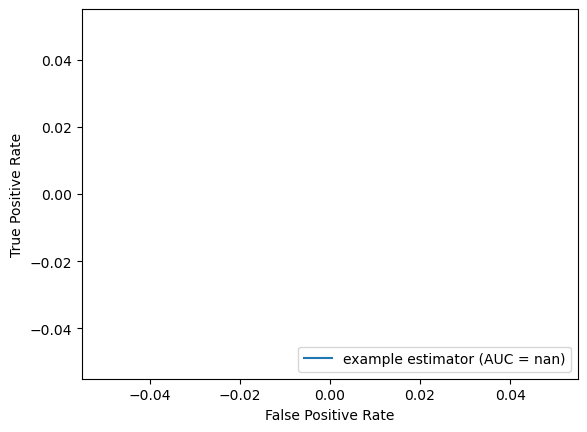

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.93    1.00      0.97   809.00
1                  0.00    0.00      0.00    57.00
accuracy           0.93    0.93      0.93     0.93
macro avg          0.47    0.50      0.48   866.00
weighted avg       0.87    0.93      0.90   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


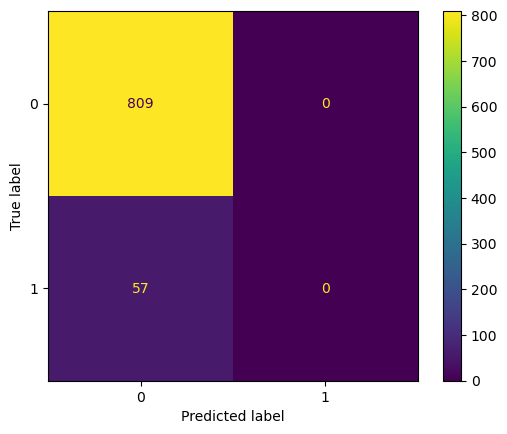

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': 1, 'n_estimators': 50}
******* Best accuracy: 0.86
******* Best recall: 0.86
******* Best cost: 67.20
******* Best precision score: 0.71
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.78         0.75        320                  0.19   

   Tr

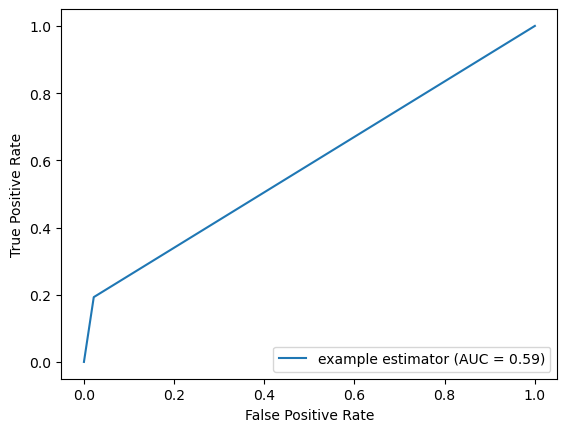

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.98    0.78      0.87   809.00
1                  0.19    0.75      0.31    57.00
accuracy           0.78    0.78      0.78     0.78
macro avg          0.59    0.77      0.59   866.00
weighted avg       0.93    0.78      0.83   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


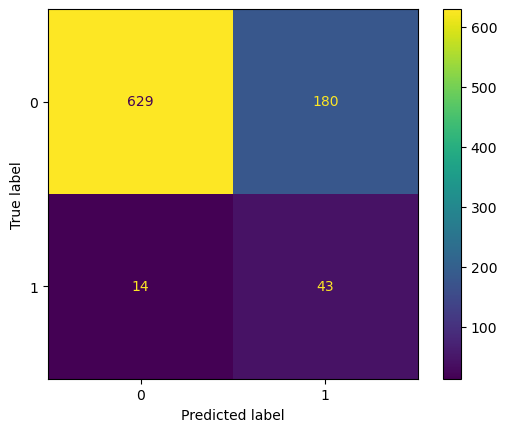

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': {0: 2.0, 1: 2.0}, 'penalty': 'l2'}
Best accuracy:  0.7783783783783783
Best recall:  0.7783783783783783
Best cost:  95.4
Best precision score:  0.7253630100688924
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.83          0.7        303   

   Best precision Score  True Positives  True Negatives       sampling  \
0                  0.23              40             676  undersampling   

  standardisation                                         Best par

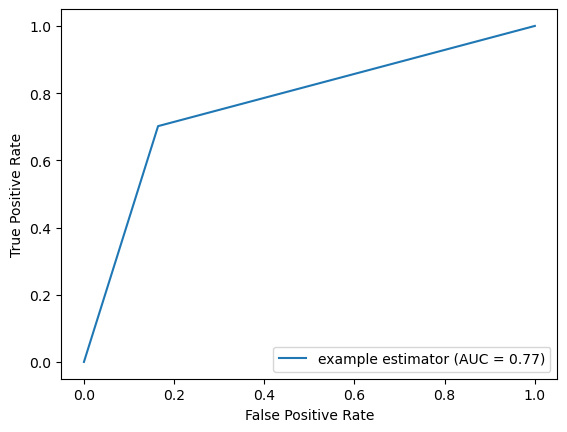

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.98    0.84      0.90   809.00
1                  0.23    0.70      0.35    57.00
accuracy           0.83    0.83      0.83     0.83
macro avg          0.60    0.77      0.62   866.00
weighted avg       0.93    0.83      0.86   866.00
None
Affichage de la matrice de confusion après optimisation


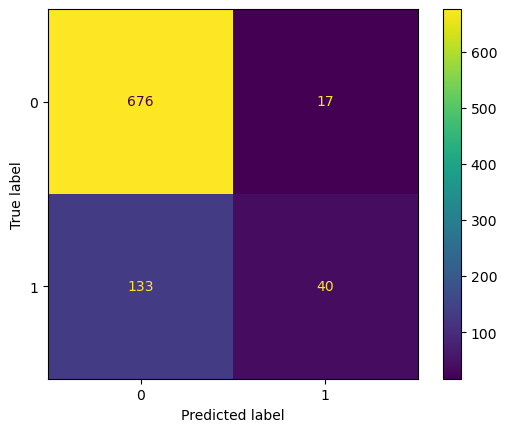

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.01, 'gamma': 1, 'kernel': 'poly'}
******* Best accuracy: 1.00
******* Best recall: 1.00
******* Best cost: 30.40
******* Best precision score: 0.56
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.28          1.0        624                  0.08   

   True Positives  True Negatives       sampling standardisation  \
0              57             185  undersampling  RobustScaler()   

                                  Best param feature  
0 

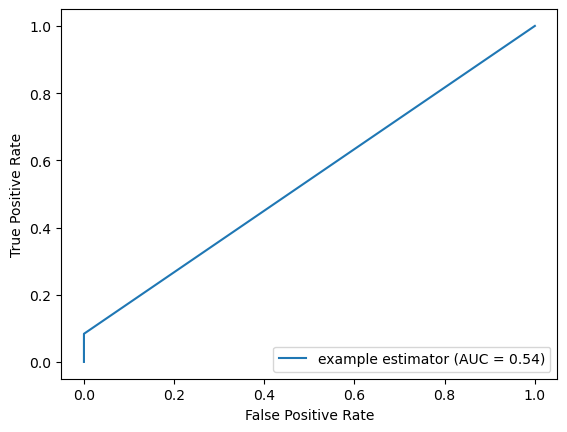

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  1.00    0.23      0.37   809.00
1                  0.08    1.00      0.15    57.00
accuracy           0.28    0.28      0.28     0.28
macro avg          0.54    0.61      0.26   866.00
weighted avg       0.94    0.28      0.36   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


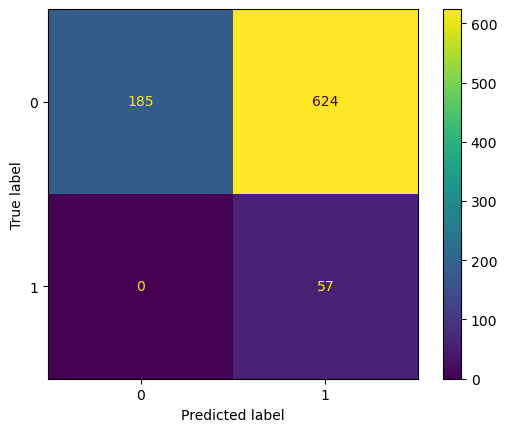

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': 1, 'n_estimators': 50}
******* Best accuracy: 0.88
******* Best recall: 0.88
******* Best cost: 1065.20
******* Best precision score: 0.70
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.67         0.84        365                  0.15   

   

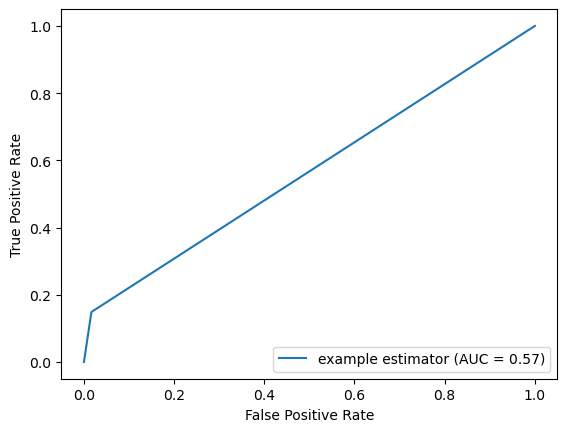

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.98    0.66      0.79   809.00
1                  0.15    0.84      0.25    57.00
accuracy           0.67    0.67      0.67     0.67
macro avg          0.57    0.75      0.52   866.00
weighted avg       0.93    0.67      0.75   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


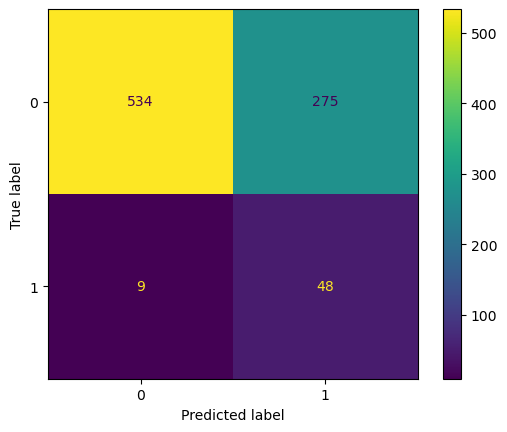

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.7684128206923921
Best recall:  0.7684128206923921
Best cost:  1723.8
Best precision score:  0.7077849260628997
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.83          0.7        303   

   Best precision Score  True Positives  True Negatives      sampling  \
0                  0.23              40             676  oversampling   

  standardisation                                         Best param fea

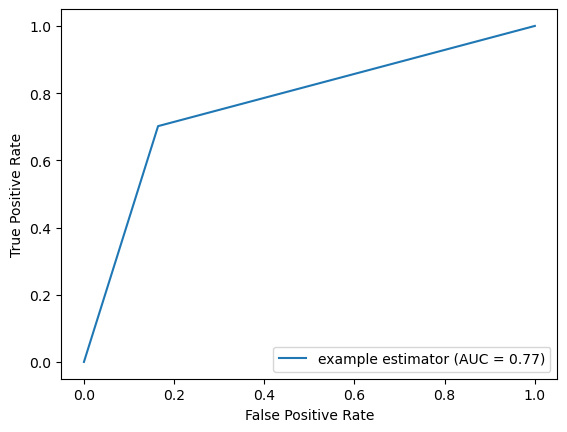

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.98    0.84      0.90   809.00
1                  0.23    0.70      0.35    57.00
accuracy           0.83    0.83      0.83     0.83
macro avg          0.60    0.77      0.62   866.00
weighted avg       0.93    0.83      0.86   866.00
None
Affichage de la matrice de confusion après optimisation


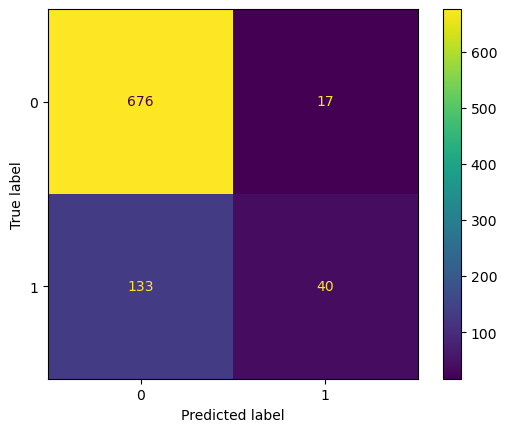

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 1, 'kernel': 'poly'}
******* Best accuracy: 0.99
******* Best recall: 0.99
******* Best cost: 529.60
******* Best precision score: 0.57
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.33          1.0        584                  0.09   

   True Positives  True Negatives      sampling standardisation  \
0              57             225  oversampling  RobustScaler()   

                                   Best param feature  
0

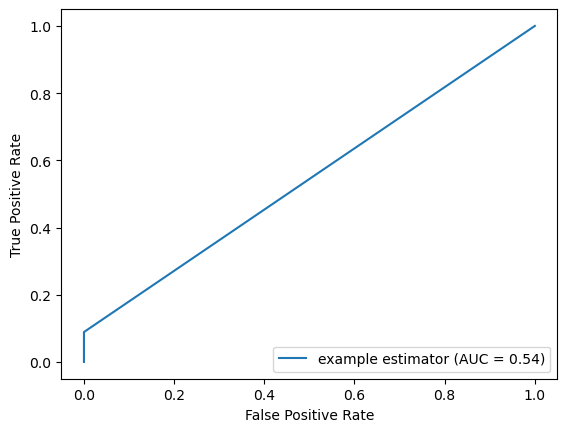

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  1.00    0.28      0.44   809.00
1                  0.09    1.00      0.16    57.00
accuracy           0.33    0.33      0.33     0.33
macro avg          0.54    0.64      0.30   866.00
weighted avg       0.94    0.33      0.42   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


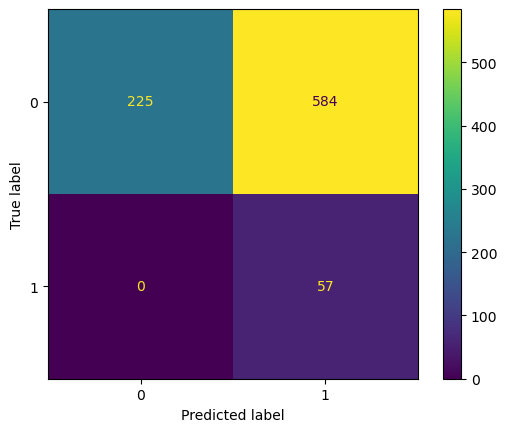

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': 1, 'n_estimators': 10}
******* Best accuracy: 0.86
******* Best recall: 0.86
******* Best cost: 297.60
******* Best precision score: 0.12
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.63         0.88        380                  0.14   

   T

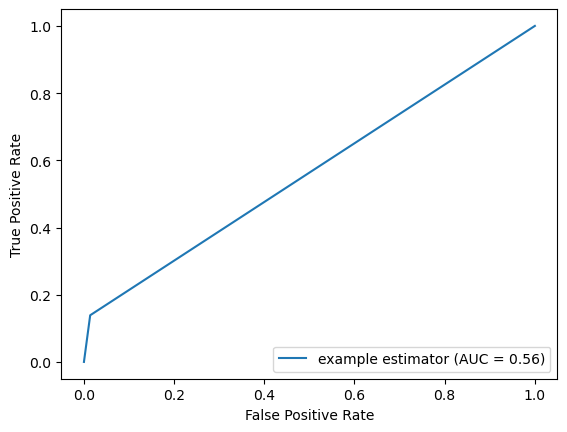

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.99    0.62      0.76   809.00
1                  0.14    0.88      0.24    57.00
accuracy           0.63    0.63      0.63     0.63
macro avg          0.56    0.75      0.50   866.00
weighted avg       0.93    0.63      0.72   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


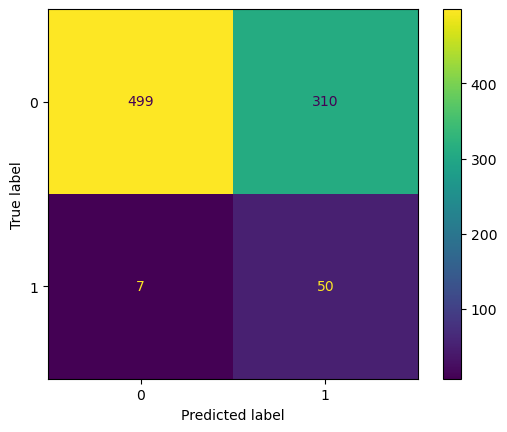

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.7564722617354197
Best recall:  0.7564722617354197
Best cost:  299.2
Best precision score:  0.12114424784865689
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.83          0.7        303   

   Best precision Score  True Positives  True Negatives sampling  \
0                  0.23              40             676     None   

  standardisation                                         Best param feature  
0  

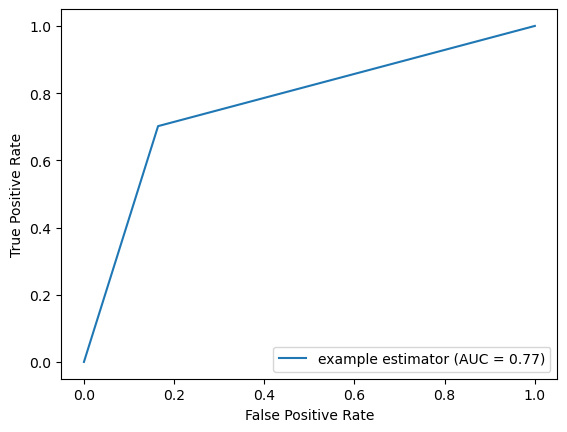

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.98    0.84      0.90   809.00
1                  0.23    0.70      0.35    57.00
accuracy           0.83    0.83      0.83     0.83
macro avg          0.60    0.77      0.62   866.00
weighted avg       0.93    0.83      0.86   866.00
None
Affichage de la matrice de confusion après optimisation


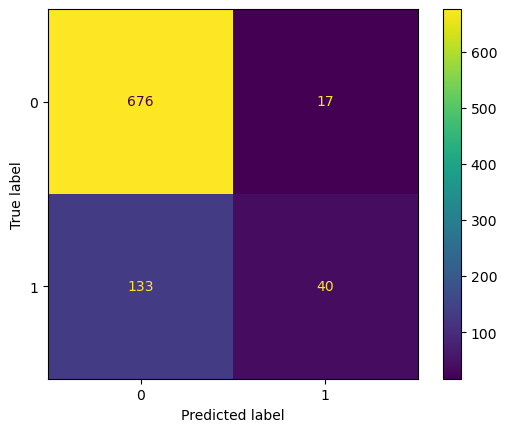

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.00
******* Best recall: 0.00
******* Best cost: 378.00
******* Best precision score: 0.00
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.93          0.0        570                   0.0   

   True Positives  True Negatives sampling standardisation  \
0               0             809     None  RobustScaler()   

                                       Best param feature  
0  

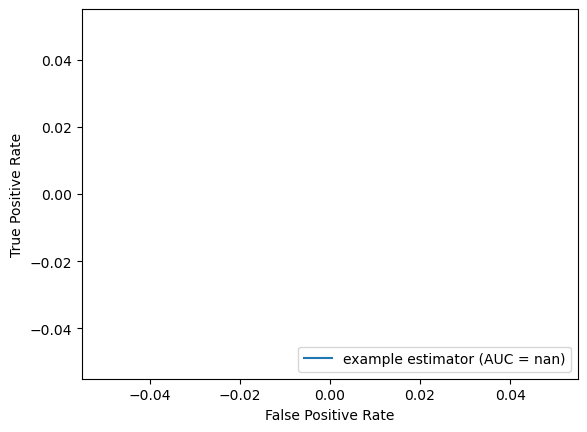

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.93    1.00      0.97   809.00
1                  0.00    0.00      0.00    57.00
accuracy           0.93    0.93      0.93     0.93
macro avg          0.47    0.50      0.48   866.00
weighted avg       0.87    0.93      0.90   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


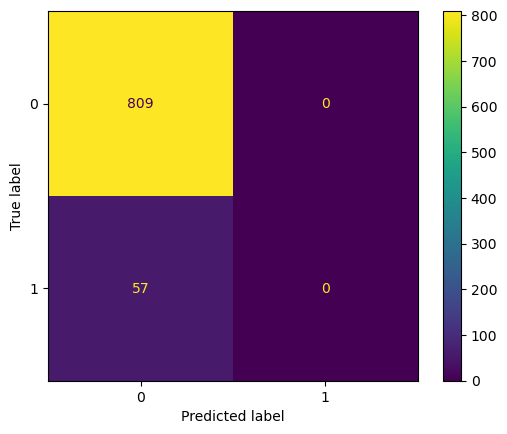

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': 1, 'n_estimators': 50}
******* Best accuracy: 0.64
******* Best recall: 0.64
******* Best cost: 156.40
******* Best precision score: 0.51
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.69         0.49        531                   0.1   

   T

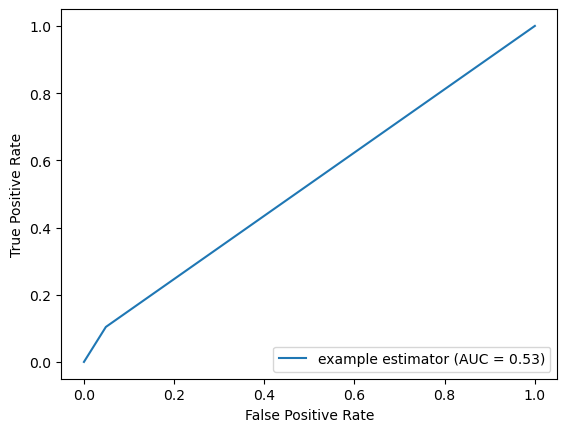

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.70      0.81   809.00
1                  0.10    0.49      0.17    57.00
accuracy           0.69    0.69      0.69     0.69
macro avg          0.53    0.60      0.49   866.00
weighted avg       0.90    0.69      0.77   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


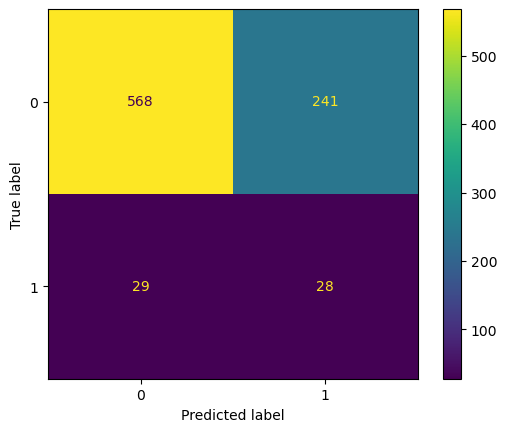

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': {0: 2.0, 1: 2.0}, 'penalty': 'l2'}
Best accuracy:  0.48364153627311524
Best recall:  0.48364153627311524
Best cost:  214.4
Best precision score:  0.3987563867733539
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.65         0.39        614   

   Best precision Score  True Positives  True Negatives       sampling  \
0                  0.08              22             545  undersampling   

    standardisation                                         Bes

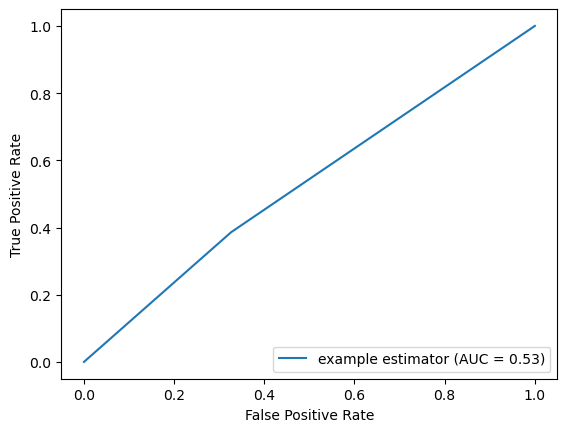

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.94    0.67      0.78   809.00
1                  0.08    0.39      0.13    57.00
accuracy           0.65    0.65      0.65     0.65
macro avg          0.51    0.53      0.46   866.00
weighted avg       0.88    0.65      0.74   866.00
None
Affichage de la matrice de confusion après optimisation


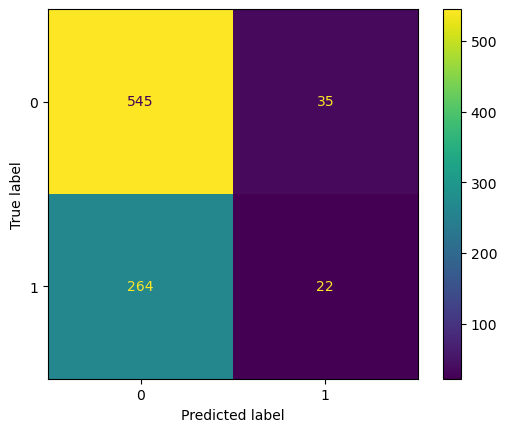

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 1, 'kernel': 'rbf'}
******* Best accuracy: 0.57
******* Best recall: 0.57
******* Best cost: 182.00
******* Best precision score: 0.42
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.43         0.65        674                  0.07   

   True Positives  True Negatives       sampling   standardisation  \
0              37             335  undersampling  StandardScaler()   

                                  Best param feature

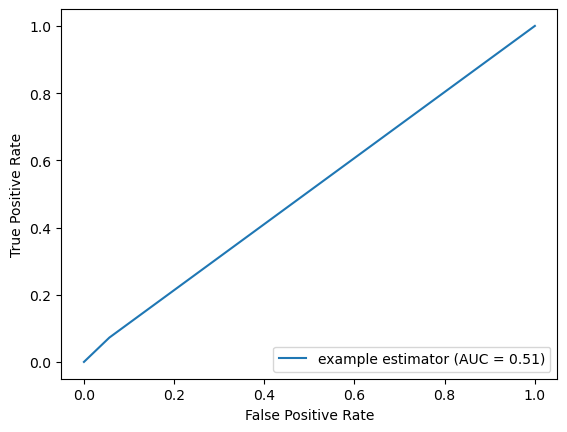

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.41      0.58   809.00
1                  0.07    0.65      0.13    57.00
accuracy           0.43    0.43      0.43     0.43
macro avg          0.51    0.53      0.35   866.00
weighted avg       0.89    0.43      0.55   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


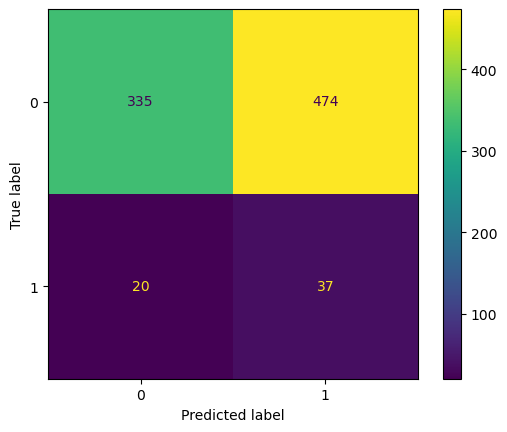

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 75}
******* Best accuracy: 0.89
******* Best recall: 0.89
******* Best cost: 957.80
******* Best precision score: 0.68
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.83         0.21        548                  0.11   

 

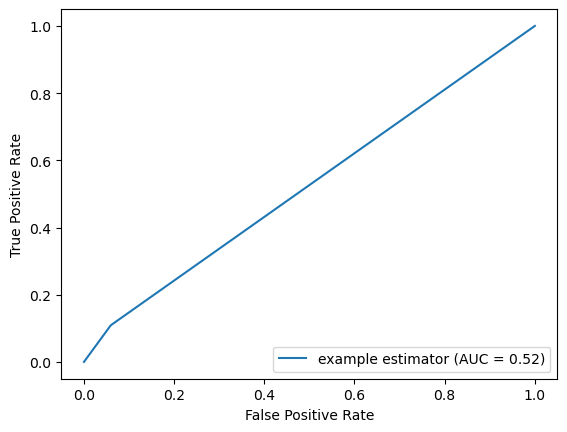

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.88      0.91   809.00
1                  0.11    0.21      0.14    57.00
accuracy           0.83    0.83      0.83     0.83
macro avg          0.52    0.54      0.53   866.00
weighted avg       0.89    0.83      0.86   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


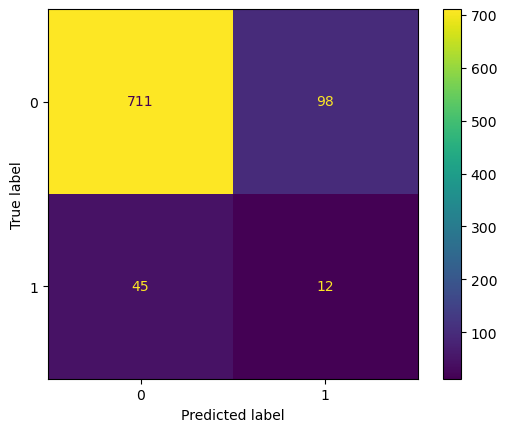

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.4576758409785932
Best recall:  0.4576758409785932
Best cost:  3840.6
Best precision score:  0.507610158719382
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.66         0.44        579   

   Best precision Score  True Positives  True Negatives      sampling  \
0                  0.09              25             550  oversampling   

    standardisation                                         Best param fe

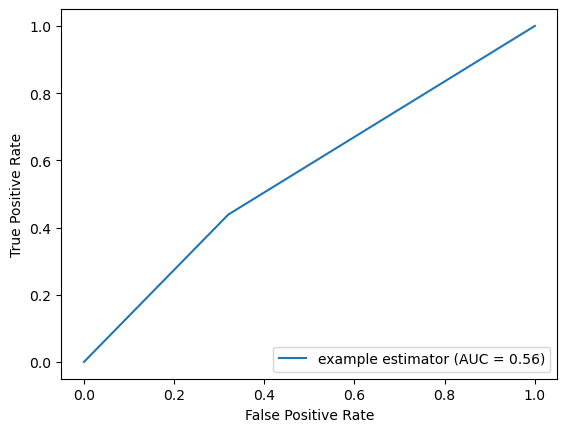

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.95    0.68      0.79   809.00
1                  0.09    0.44      0.15    57.00
accuracy           0.66    0.66      0.66     0.66
macro avg          0.52    0.56      0.47   866.00
weighted avg       0.89    0.66      0.75   866.00
None
Affichage de la matrice de confusion après optimisation


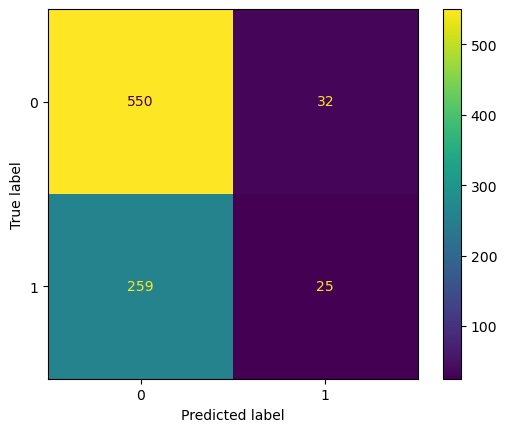

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.1, 'gamma': 1, 'kernel': 'rbf'}
******* Best accuracy: 0.59
******* Best recall: 0.59
******* Best cost: 3039.20
******* Best precision score: 0.53
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.49         0.51        695                  0.07   

   True Positives  True Negatives      sampling   standardisation  \
0              29             394  oversampling  StandardScaler()   

                                Best param feature  
0 

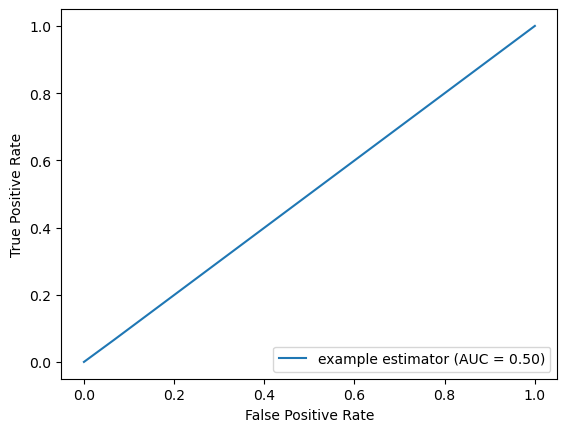

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.93    0.49      0.64   809.00
1                  0.07    0.51      0.12    57.00
accuracy           0.49    0.49      0.49     0.49
macro avg          0.50    0.50      0.38   866.00
weighted avg       0.88    0.49      0.61   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


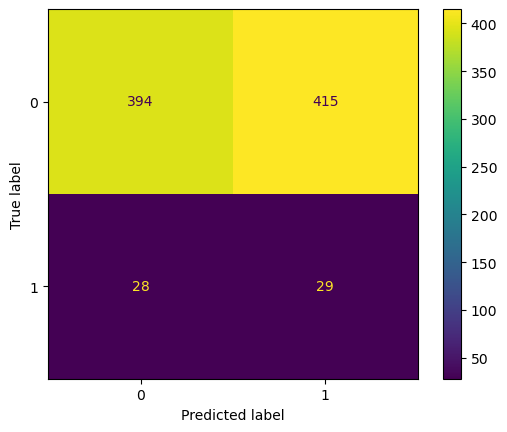

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': 1, 'n_estimators': 10}
******* Best accuracy: 0.52
******* Best recall: 0.52
******* Best cost: 553.00
******* Best precision score: 0.05
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.77         0.26        580                  0.09   

   T

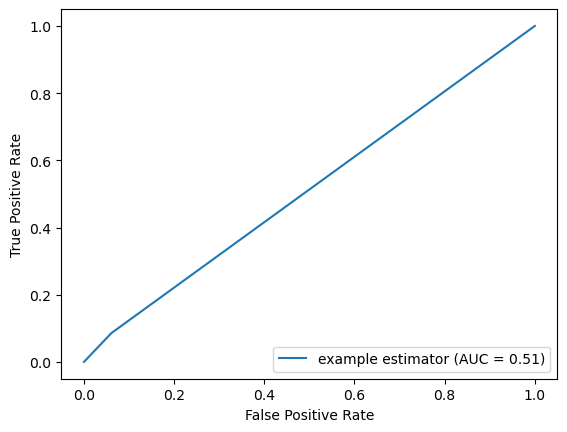

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.80      0.87   809.00
1                  0.09    0.26      0.13    57.00
accuracy           0.77    0.77      0.77     0.77
macro avg          0.51    0.53      0.50   866.00
weighted avg       0.88    0.77      0.82   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


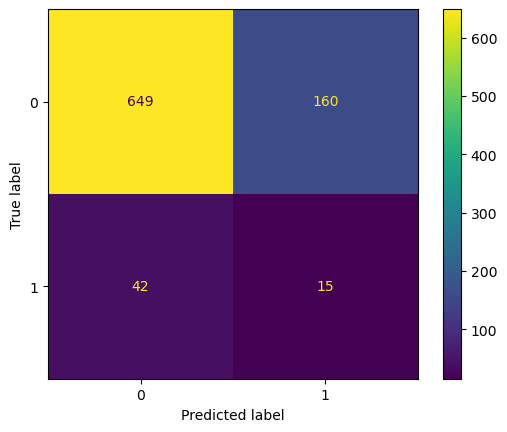

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.01, 'class_weight': {0: 1.0577451879010082, 1: 18.317460317460316}, 'penalty': 'l2'}
Best accuracy:  0.4605974395448079
Best recall:  0.4605974395448079
Best cost:  501.6
Best precision score:  0.05501799818305566
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.66         0.44        579   

   Best precision Score  True Positives  True Negatives sampling  \
0                  0.09              25             550     None   

    standardisation                            

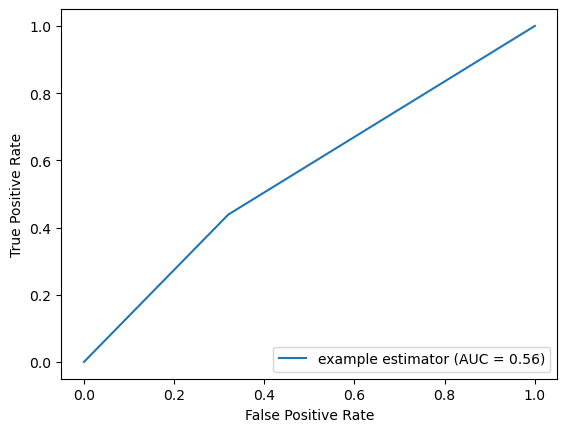

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.95    0.68      0.79   809.00
1                  0.09    0.44      0.15    57.00
accuracy           0.66    0.66      0.66     0.66
macro avg          0.52    0.56      0.47   866.00
weighted avg       0.89    0.66      0.75   866.00
None
Affichage de la matrice de confusion après optimisation


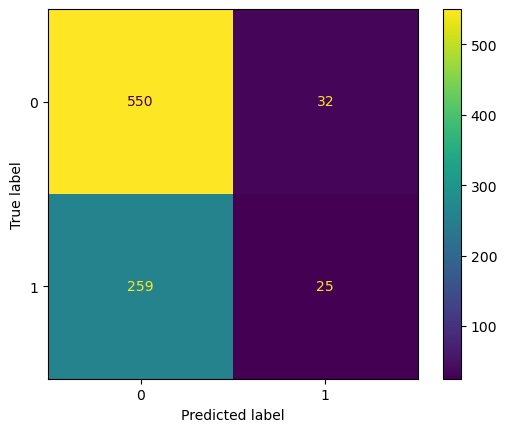

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.00
******* Best recall: 0.00
******* Best cost: 378.00
******* Best precision score: 0.00
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.93          0.0        570                   0.0   

   True Positives  True Negatives sampling   standardisation  \
0               0             809     None  StandardScaler()   

                                       Best param feature  

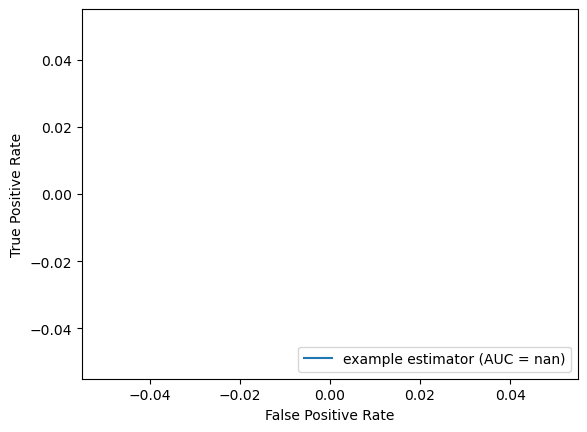

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.93    1.00      0.97   809.00
1                  0.00    0.00      0.00    57.00
accuracy           0.93    0.93      0.93     0.93
macro avg          0.47    0.50      0.48   866.00
weighted avg       0.87    0.93      0.90   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


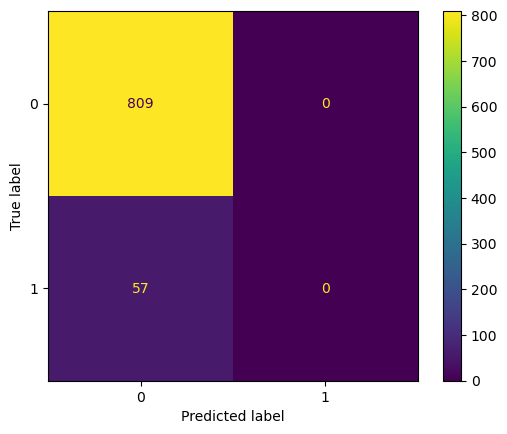

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': 1, 'n_estimators': 10}
******* Best accuracy: 0.54
******* Best recall: 0.54
******* Best cost: 195.00
******* Best precision score: 0.49
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.24         0.84        741                  0.07   

   T

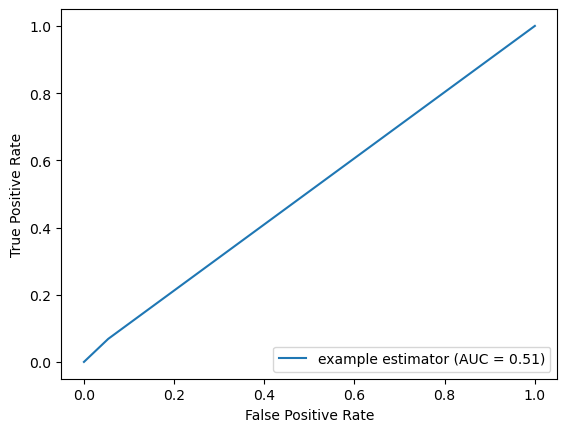

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.20      0.32   809.00
1                  0.07    0.84      0.13    57.00
accuracy           0.24    0.24      0.24     0.24
macro avg          0.51    0.52      0.23   866.00
weighted avg       0.89    0.24      0.31   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


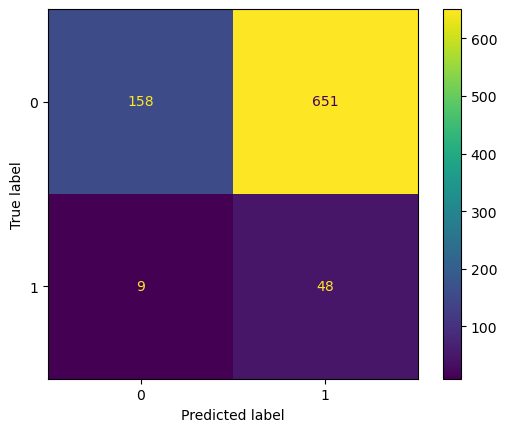

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': {0: 2.0, 1: 2.0}, 'penalty': 'l2'}
Best accuracy:  0.4834992887624467
Best recall:  0.4834992887624467
Best cost:  214.8
Best precision score:  0.48779809690625625
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.66         0.44        579   

   Best precision Score  True Positives  True Negatives       sampling  \
0                  0.09              25             550  undersampling   

  standardisation                                         Best p

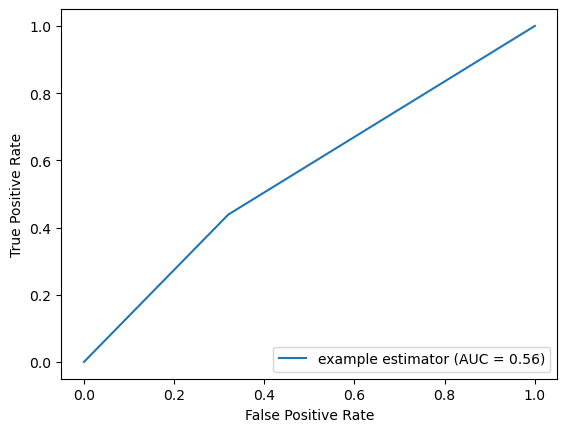

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.95    0.68      0.79   809.00
1                  0.09    0.44      0.15    57.00
accuracy           0.66    0.66      0.66     0.66
macro avg          0.52    0.56      0.47   866.00
weighted avg       0.89    0.66      0.75   866.00
None
Affichage de la matrice de confusion après optimisation


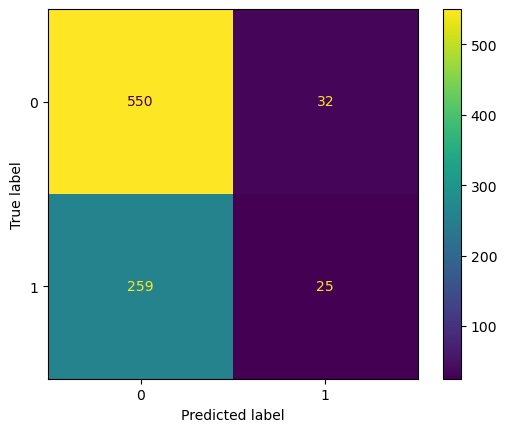

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'rbf'}
******* Best accuracy: 0.41
******* Best recall: 0.41
******* Best cost: 238.80
******* Best precision score: 0.44
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.67         0.39        600                  0.08   

   True Positives  True Negatives       sampling standardisation  \
0              22             559  undersampling  RobustScaler()   

                                    Best param feature

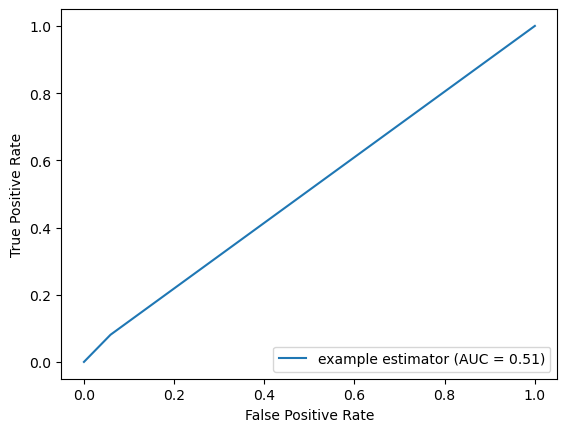

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.69      0.80   809.00
1                  0.08    0.39      0.13    57.00
accuracy           0.67    0.67      0.67     0.67
macro avg          0.51    0.54      0.47   866.00
weighted avg       0.88    0.67      0.75   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


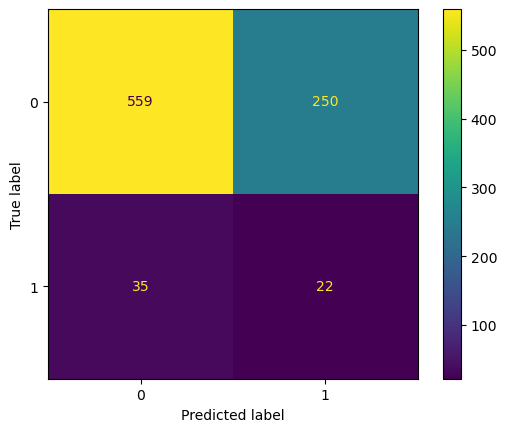

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 50}
******* Best accuracy: 0.92
******* Best recall: 0.92
******* Best cost: 813.40
******* Best precision score: 0.68
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.85         0.18        557                   0.1   

 

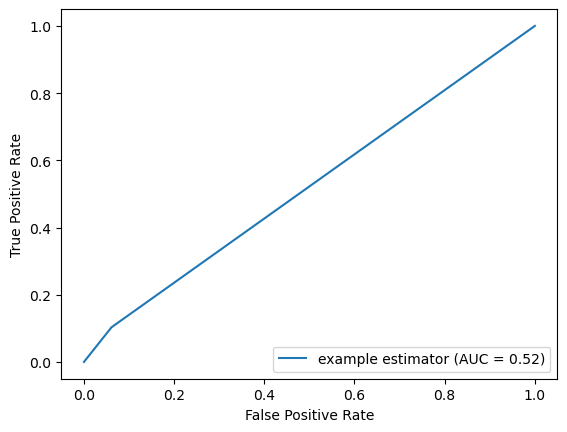

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.89      0.92   809.00
1                  0.10    0.18      0.13    57.00
accuracy           0.85    0.85      0.85     0.85
macro avg          0.52    0.53      0.52   866.00
weighted avg       0.88    0.85      0.86   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


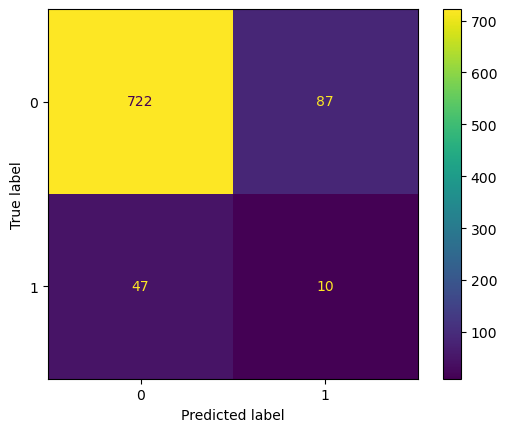

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.4500385181035086
Best recall:  0.4500385181035086
Best cost:  3894.8
Best precision score:  0.49978268722975594
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.66         0.44        579   

   Best precision Score  True Positives  True Negatives      sampling  \
0                  0.09              25             550  oversampling   

  standardisation                                         Best param fe

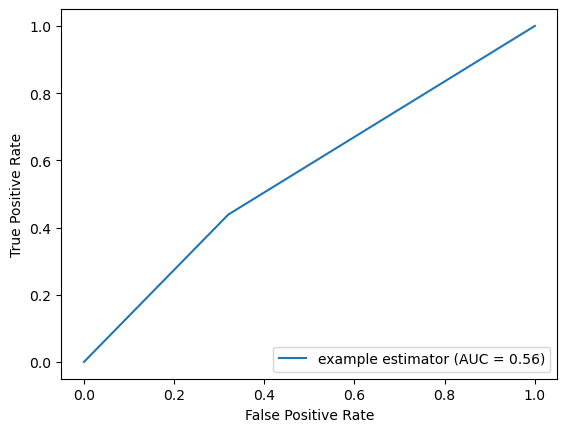

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.95    0.68      0.79   809.00
1                  0.09    0.44      0.15    57.00
accuracy           0.66    0.66      0.66     0.66
macro avg          0.52    0.56      0.47   866.00
weighted avg       0.89    0.66      0.75   866.00
None
Affichage de la matrice de confusion après optimisation


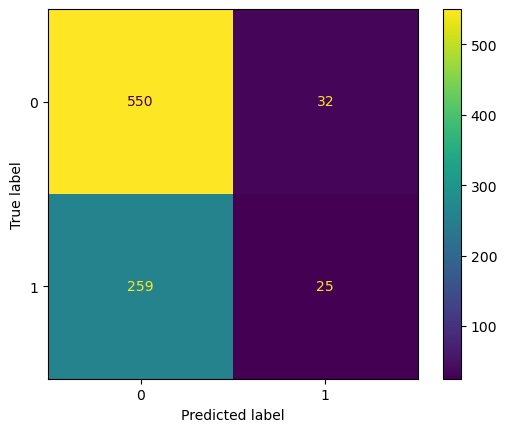

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.48
******* Best recall: 0.48
******* Best cost: 3731.00
******* Best precision score: 0.30
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM            0.6         0.44        632                  0.07   

   True Positives  True Negatives      sampling standardisation  \
0              25             497  oversampling  RobustScaler()   

                                       Best param fe

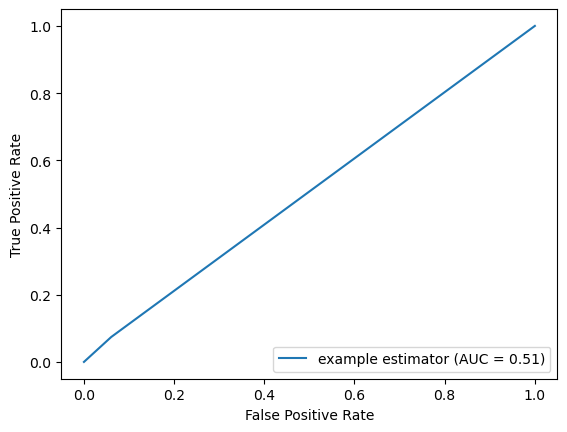

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.61      0.74    809.0
1                  0.07    0.44      0.13     57.0
accuracy           0.60    0.60      0.60      0.6
macro avg          0.51    0.53      0.43    866.0
weighted avg       0.88    0.60      0.70    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


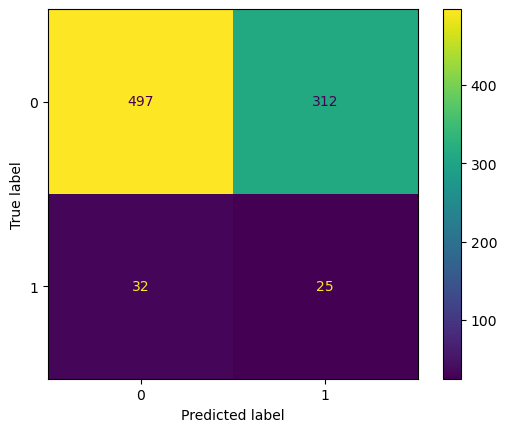

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': 1, 'n_estimators': 10}
******* Best accuracy: 0.52
******* Best recall: 0.52
******* Best cost: 553.00
******* Best precision score: 0.05
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.77         0.26        580                  0.09   

   T

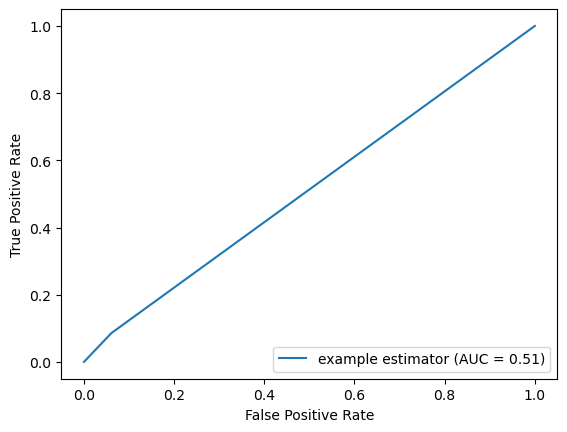

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.80      0.87   809.00
1                  0.09    0.26      0.13    57.00
accuracy           0.77    0.77      0.77     0.77
macro avg          0.51    0.53      0.50   866.00
weighted avg       0.88    0.77      0.82   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


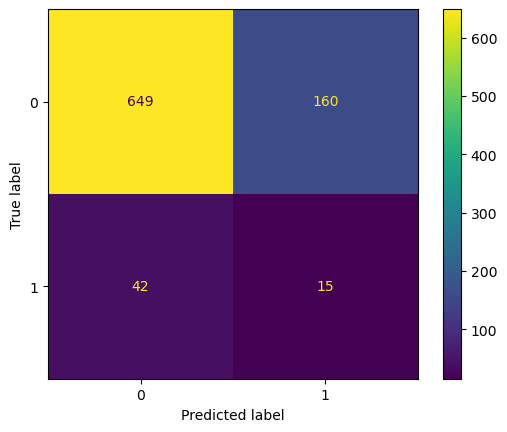

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.01, 'class_weight': {0: 1.0577451879010082, 1: 18.317460317460316}, 'penalty': 'l2'}
Best accuracy:  0.4605974395448079
Best recall:  0.4605974395448079
Best cost:  501.6
Best precision score:  0.05501799818305566
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.66         0.44        579   

   Best precision Score  True Positives  True Negatives sampling  \
0                  0.09              25             550     None   

  standardisation                              

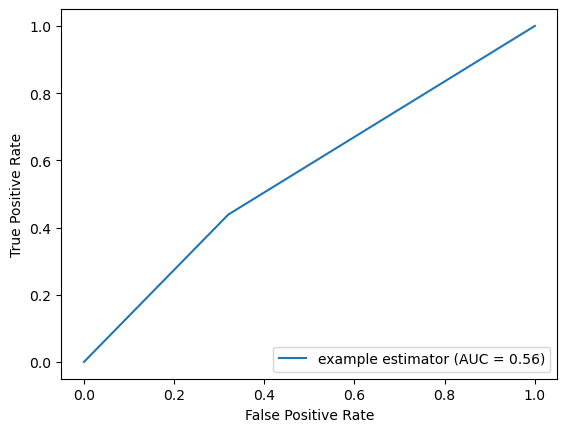

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.95    0.68      0.79   809.00
1                  0.09    0.44      0.15    57.00
accuracy           0.66    0.66      0.66     0.66
macro avg          0.52    0.56      0.47   866.00
weighted avg       0.89    0.66      0.75   866.00
None
Affichage de la matrice de confusion après optimisation


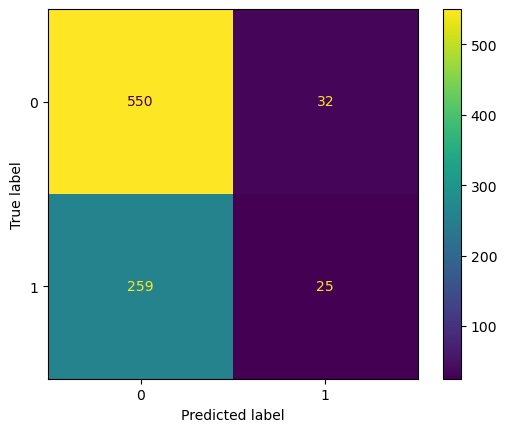

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.00
******* Best recall: 0.00
******* Best cost: 378.00
******* Best precision score: 0.00
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.93          0.0        570                   0.0   

   True Positives  True Negatives sampling standardisation  \
0               0             809     None  RobustScaler()   

                                       Best param feature  
0  

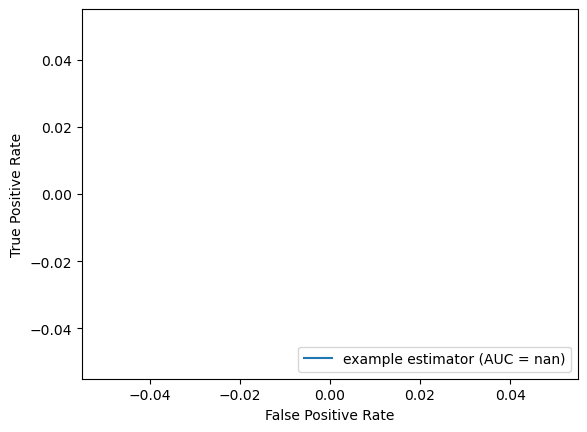

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.93    1.00      0.97   809.00
1                  0.00    0.00      0.00    57.00
accuracy           0.93    0.93      0.93     0.93
macro avg          0.47    0.50      0.48   866.00
weighted avg       0.87    0.93      0.90   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


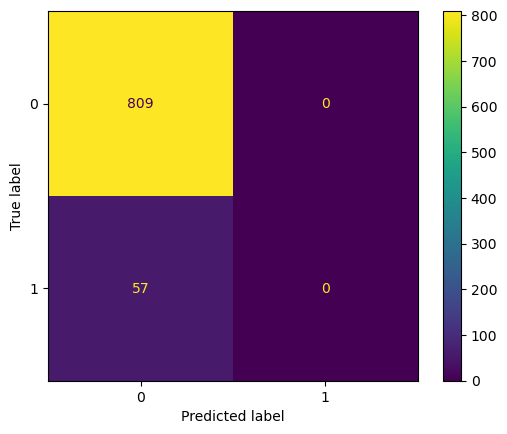

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.54
******* Best recall: 0.54
******* Best cost: 187.40
******* Best precision score: 0.60
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest            0.6         0.61        543                   0.1   

 

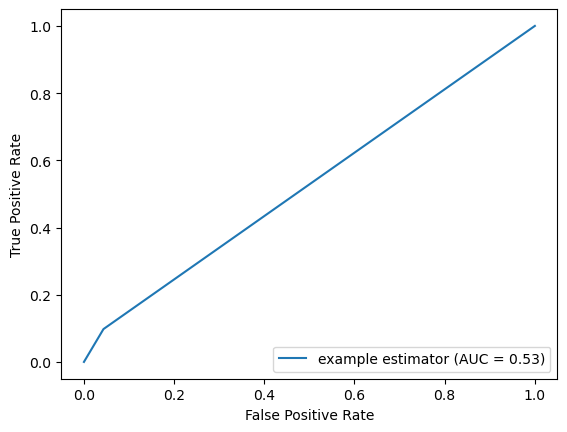

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.96    0.60      0.74    809.0
1                  0.10    0.61      0.17     57.0
accuracy           0.60    0.60      0.60      0.6
macro avg          0.53    0.61      0.45    866.0
weighted avg       0.90    0.60      0.70    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


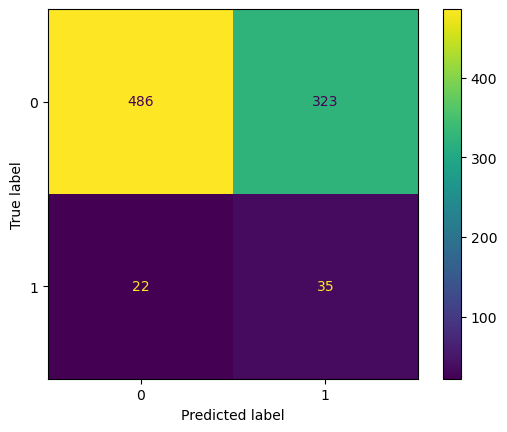

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.5388335704125178
Best recall:  0.5388335704125178
Best cost:  187.4
Best precision score:  0.6005834901115037
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression            0.6         0.61        543   

   Best precision Score  True Positives  True Negatives       sampling  \
0                   0.1              35             486  undersampling   

    standardisation                                         Best param 

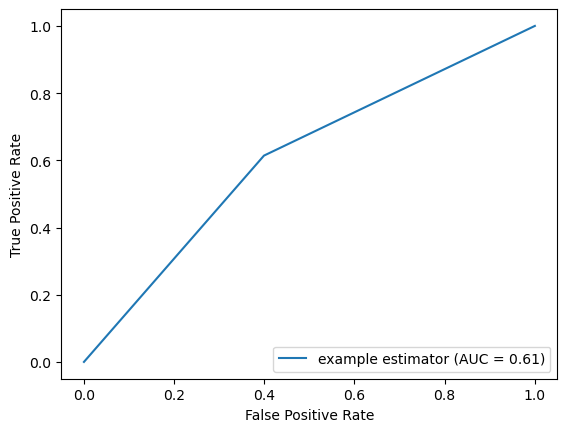

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.96    0.60      0.74    809.0
1                  0.10    0.61      0.17     57.0
accuracy           0.60    0.60      0.60      0.6
macro avg          0.53    0.61      0.45    866.0
weighted avg       0.90    0.60      0.70    866.0
None
Affichage de la matrice de confusion après optimisation


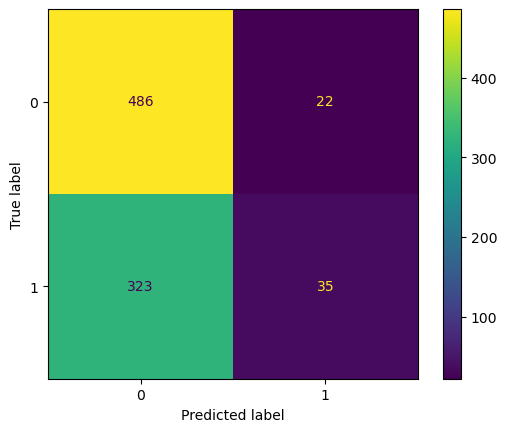

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.54
******* Best recall: 0.54
******* Best cost: 189.80
******* Best precision score: 0.47
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM            0.6         0.61        543                   0.1   

   True Positives  True Negatives       sampling   standardisation  \
0              35             486  undersampling  StandardScaler()   

                                       Best par

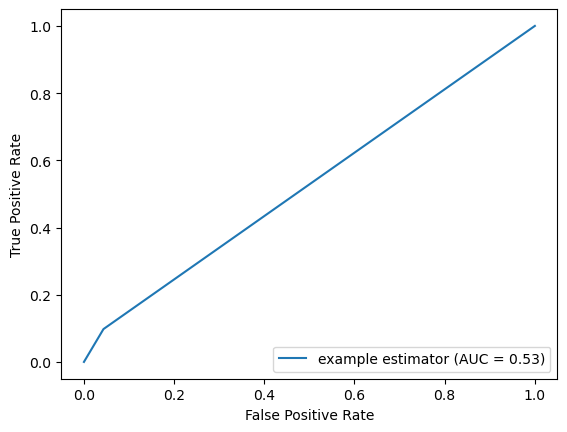

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.96    0.60      0.74    809.0
1                  0.10    0.61      0.17     57.0
accuracy           0.60    0.60      0.60      0.6
macro avg          0.53    0.61      0.45    866.0
weighted avg       0.90    0.60      0.70    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


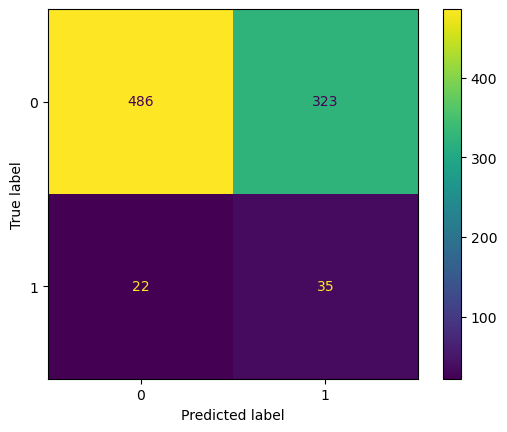

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.54
******* Best recall: 0.54
******* Best cost: 3266.80
******* Best precision score: 0.56
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest            0.6         0.61        543                   0.1   



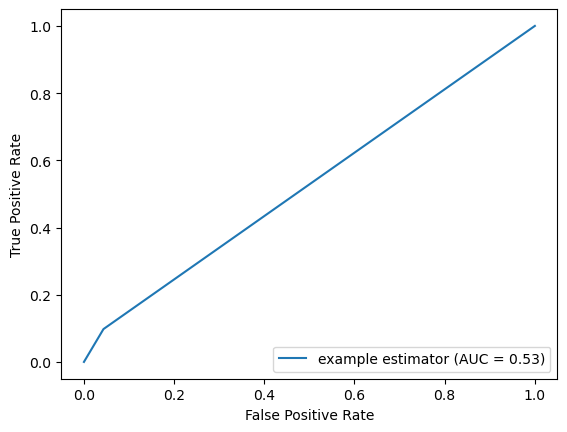

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.96    0.60      0.74    809.0
1                  0.10    0.61      0.17     57.0
accuracy           0.60    0.60      0.60      0.6
macro avg          0.53    0.61      0.45    866.0
weighted avg       0.90    0.60      0.70    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


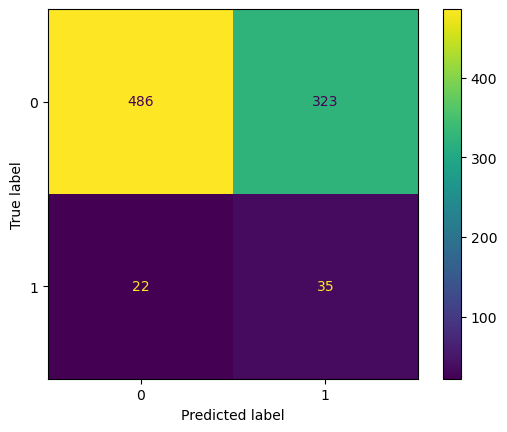

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.543544599295002
Best recall:  0.543544599295002
Best cost:  3266.8
Best precision score:  0.5606489558180445
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression            0.6         0.61        543   

   Best precision Score  True Positives  True Negatives      sampling  \
0                   0.1              35             486  oversampling   

    standardisation                                         Best param  \


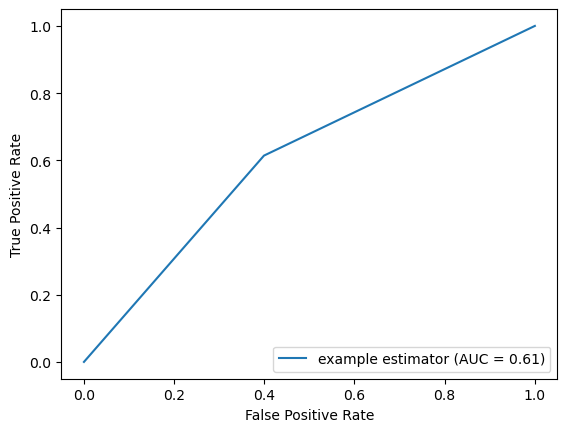

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.96    0.60      0.74    809.0
1                  0.10    0.61      0.17     57.0
accuracy           0.60    0.60      0.60      0.6
macro avg          0.53    0.61      0.45    866.0
weighted avg       0.90    0.60      0.70    866.0
None
Affichage de la matrice de confusion après optimisation


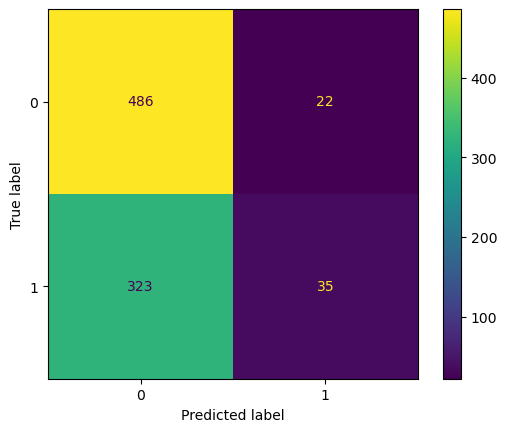

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.01, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.54
******* Best recall: 0.54
******* Best cost: 3266.80
******* Best precision score: 0.56
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM            0.6         0.61        543                   0.1   

   True Positives  True Negatives      sampling   standardisation  \
0              35             486  oversampling  StandardScaler()   

                                      Best param 

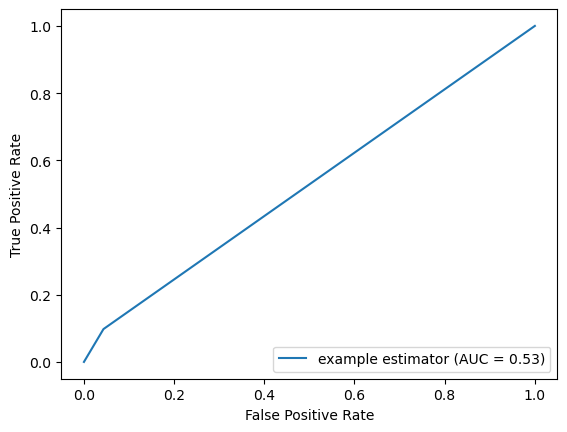

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.96    0.60      0.74    809.0
1                  0.10    0.61      0.17     57.0
accuracy           0.60    0.60      0.60      0.6
macro avg          0.53    0.61      0.45    866.0
weighted avg       0.90    0.60      0.70    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


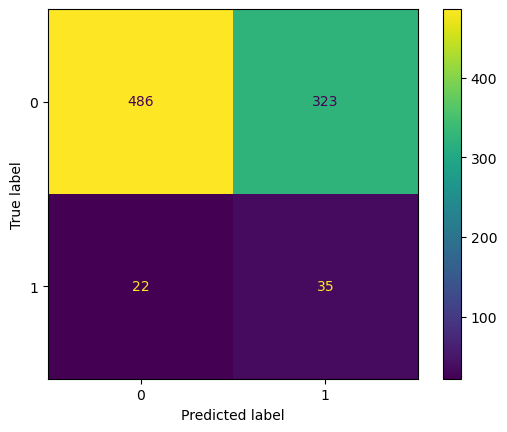

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.54
******* Best recall: 0.54
******* Best cost: 452.80
******* Best precision score: 0.07
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest            0.6         0.61        543                   0.1   

 

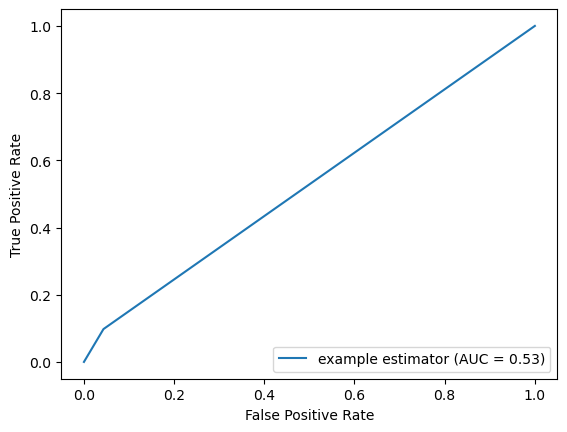

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.96    0.60      0.74    809.0
1                  0.10    0.61      0.17     57.0
accuracy           0.60    0.60      0.60      0.6
macro avg          0.53    0.61      0.45    866.0
weighted avg       0.90    0.60      0.70    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


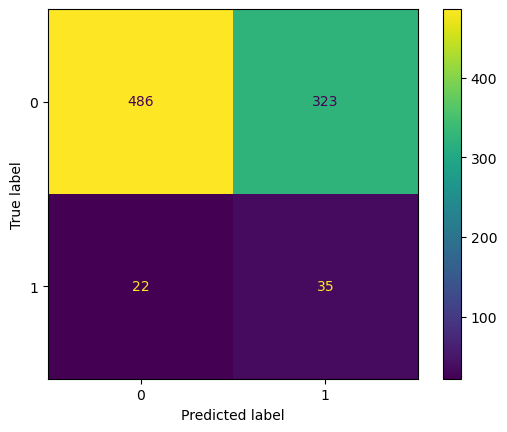

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.5395448079658606
Best recall:  0.5395448079658606
Best cost:  452.8
Best precision score:  0.06799629460361092
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression            0.6         0.61        543   

   Best precision Score  True Positives  True Negatives sampling  \
0                   0.1              35             486     None   

    standardisation                                         Best param  \
0  Stand

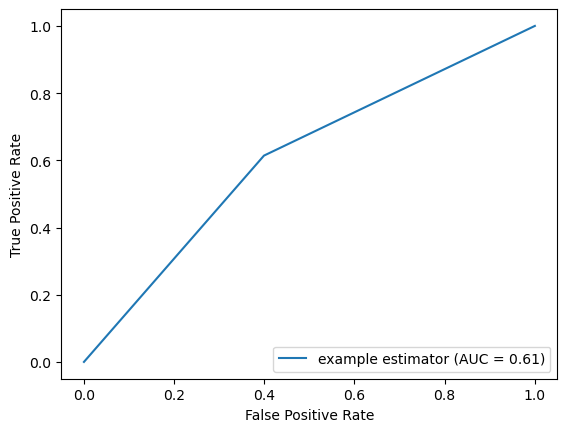

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.96    0.60      0.74    809.0
1                  0.10    0.61      0.17     57.0
accuracy           0.60    0.60      0.60      0.6
macro avg          0.53    0.61      0.45    866.0
weighted avg       0.90    0.60      0.70    866.0
None
Affichage de la matrice de confusion après optimisation


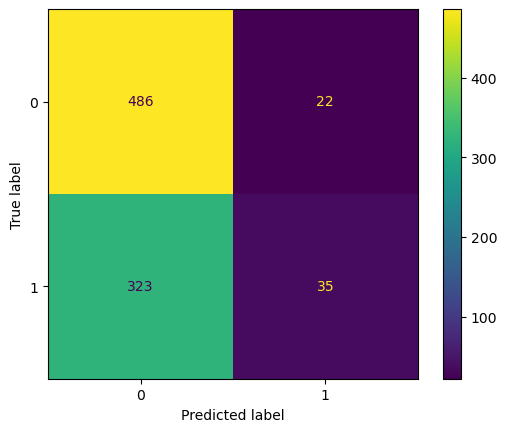

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.00
******* Best recall: 0.00
******* Best cost: 378.00
******* Best precision score: 0.00
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.93          0.0        570                   0.0   

   True Positives  True Negatives sampling   standardisation  \
0               0             809     None  StandardScaler()   

                                       Best param         f

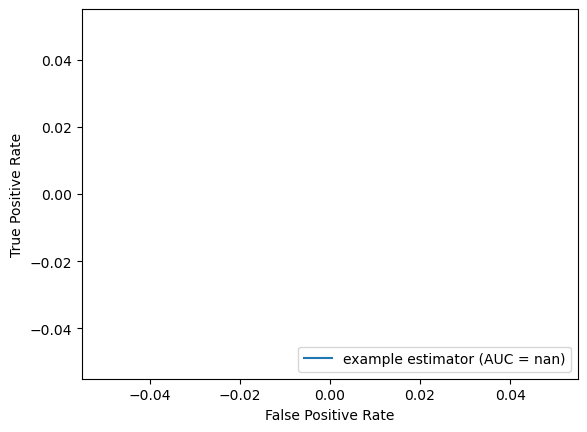

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.93    1.00      0.97   809.00
1                  0.00    0.00      0.00    57.00
accuracy           0.93    0.93      0.93     0.93
macro avg          0.47    0.50      0.48   866.00
weighted avg       0.87    0.93      0.90   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


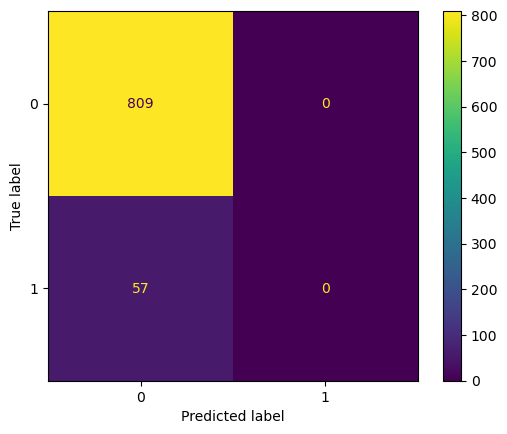

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.54
******* Best recall: 0.54
******* Best cost: 191.00
******* Best precision score: 0.54
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest            0.6         0.61        543                   0.1   

 

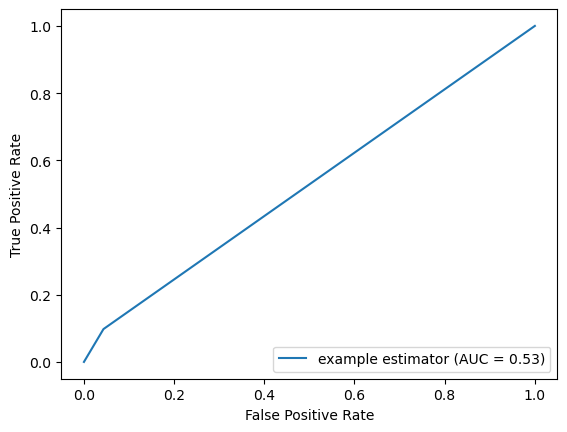

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.96    0.60      0.74    809.0
1                  0.10    0.61      0.17     57.0
accuracy           0.60    0.60      0.60      0.6
macro avg          0.53    0.61      0.45    866.0
weighted avg       0.90    0.60      0.70    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


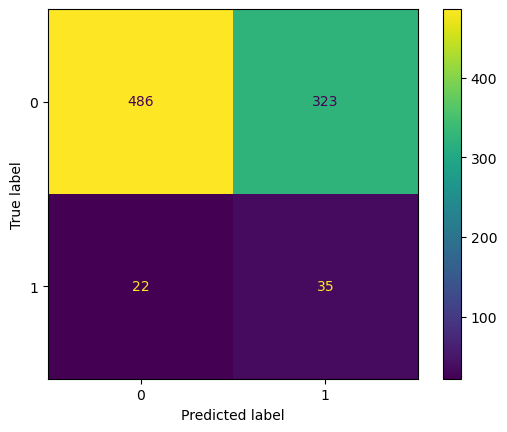

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.5388335704125178
Best recall:  0.5388335704125178
Best cost:  191.0
Best precision score:  0.5442117343785865
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression            0.6         0.61        543   

   Best precision Score  True Positives  True Negatives       sampling  \
0                   0.1              35             486  undersampling   

  standardisation                                         Best param  \

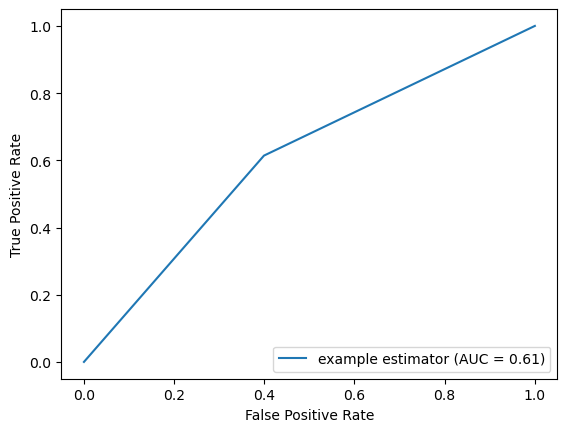

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.96    0.60      0.74    809.0
1                  0.10    0.61      0.17     57.0
accuracy           0.60    0.60      0.60      0.6
macro avg          0.53    0.61      0.45    866.0
weighted avg       0.90    0.60      0.70    866.0
None
Affichage de la matrice de confusion après optimisation


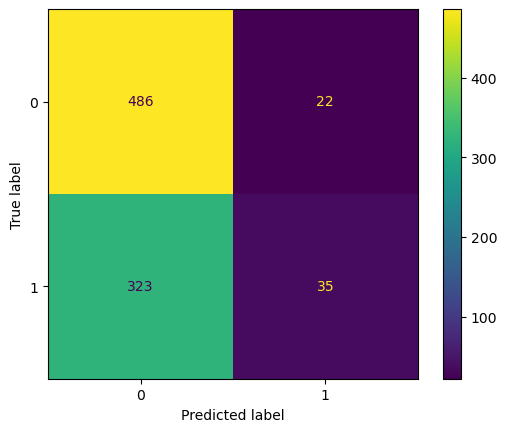

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.54
******* Best recall: 0.54
******* Best cost: 191.80
******* Best precision score: 0.44
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM            0.6         0.61        543                   0.1   

   True Positives  True Negatives       sampling standardisation  \
0              35             486  undersampling  RobustScaler()   

                                       Best param  

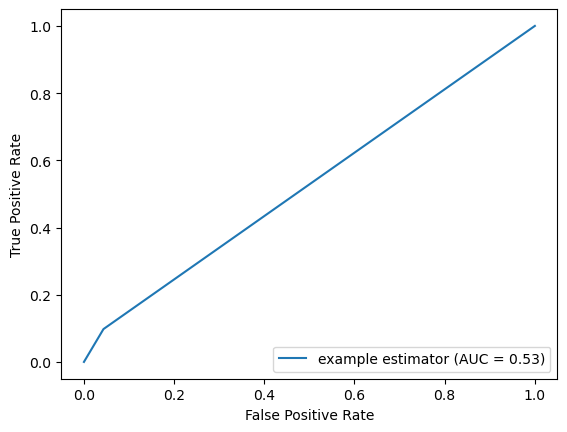

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.96    0.60      0.74    809.0
1                  0.10    0.61      0.17     57.0
accuracy           0.60    0.60      0.60      0.6
macro avg          0.53    0.61      0.45    866.0
weighted avg       0.90    0.60      0.70    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


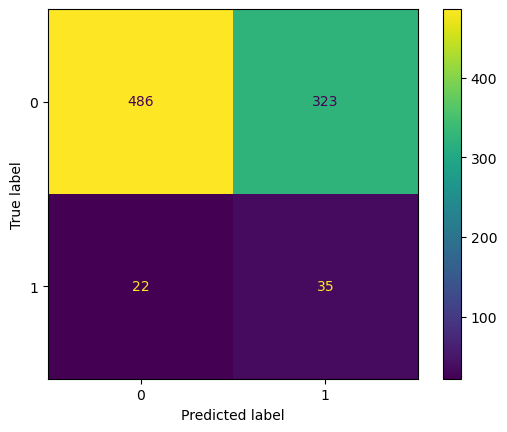

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.55
******* Best recall: 0.55
******* Best cost: 3256.80
******* Best precision score: 0.56
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest            0.6         0.61        543                   0.1   



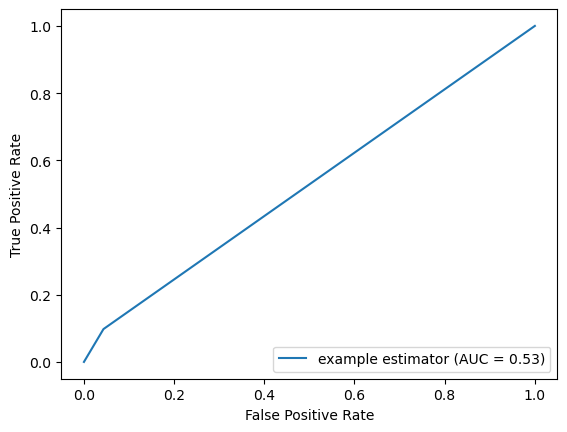

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.96    0.60      0.74    809.0
1                  0.10    0.61      0.17     57.0
accuracy           0.60    0.60      0.60      0.6
macro avg          0.53    0.61      0.45    866.0
weighted avg       0.90    0.60      0.70    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


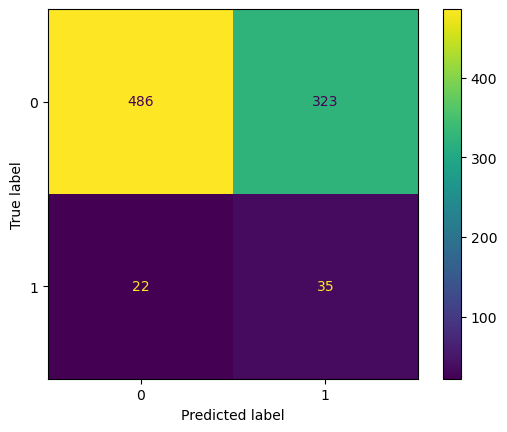

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.5450722506244602
Best recall:  0.5450722506244602
Best cost:  3256.8
Best precision score:  0.5611881783438728
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression            0.6         0.61        543   

   Best precision Score  True Positives  True Negatives      sampling  \
0                   0.1              35             486  oversampling   

  standardisation                                         Best param  \


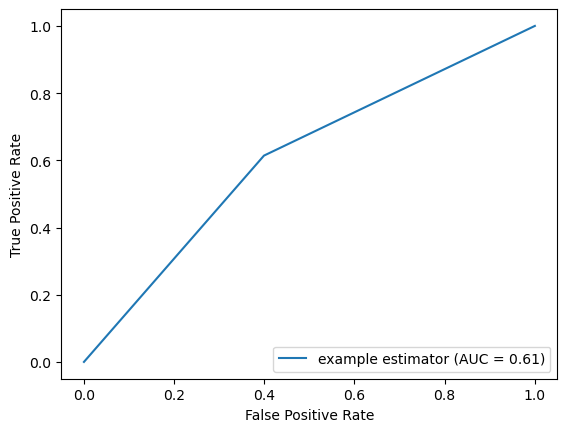

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.96    0.60      0.74    809.0
1                  0.10    0.61      0.17     57.0
accuracy           0.60    0.60      0.60      0.6
macro avg          0.53    0.61      0.45    866.0
weighted avg       0.90    0.60      0.70    866.0
None
Affichage de la matrice de confusion après optimisation


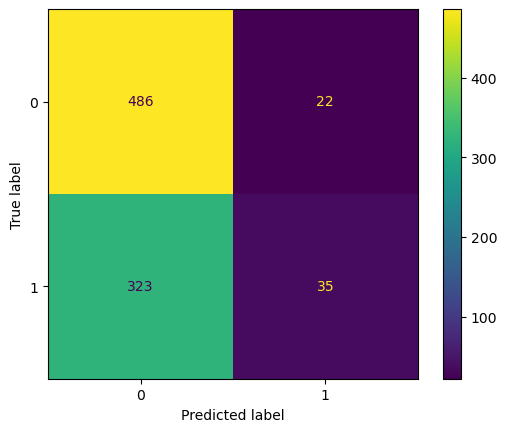

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.01, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.55
******* Best recall: 0.55
******* Best cost: 3256.80
******* Best precision score: 0.56
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM            0.6         0.61        543                   0.1   

   True Positives  True Negatives      sampling standardisation  \
0              35             486  oversampling  RobustScaler()   

                                      Best param     

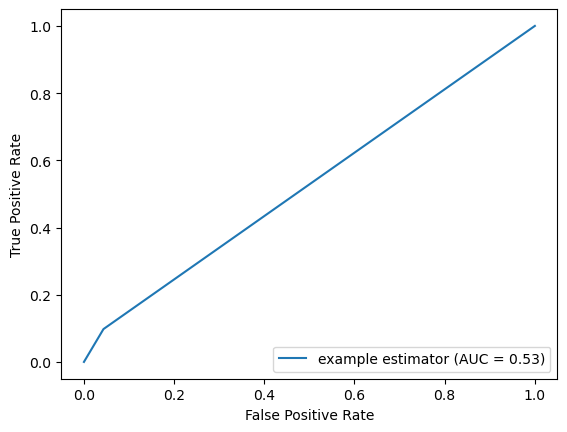

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.96    0.60      0.74    809.0
1                  0.10    0.61      0.17     57.0
accuracy           0.60    0.60      0.60      0.6
macro avg          0.53    0.61      0.45    866.0
weighted avg       0.90    0.60      0.70    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


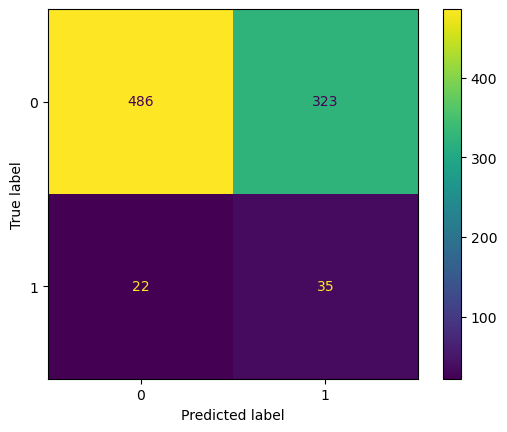

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.54
******* Best recall: 0.54
******* Best cost: 452.80
******* Best precision score: 0.07
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest            0.6         0.61        543                   0.1   

 

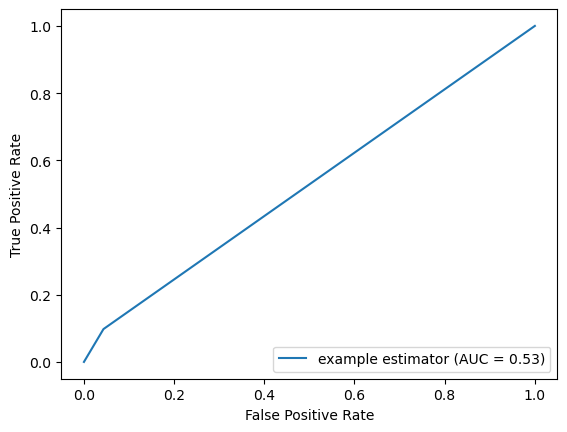

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.96    0.60      0.74    809.0
1                  0.10    0.61      0.17     57.0
accuracy           0.60    0.60      0.60      0.6
macro avg          0.53    0.61      0.45    866.0
weighted avg       0.90    0.60      0.70    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


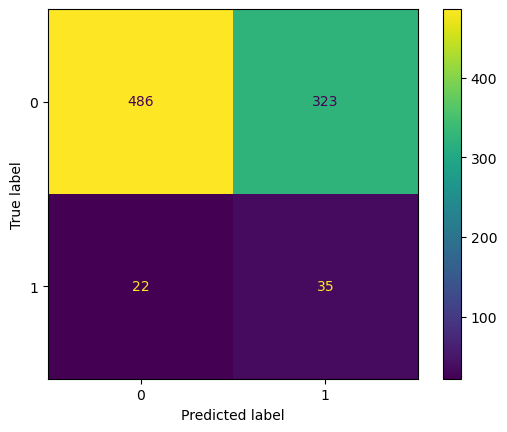

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.5395448079658606
Best recall:  0.5395448079658606
Best cost:  452.8
Best precision score:  0.06799629460361092
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression            0.6         0.61        543   

   Best precision Score  True Positives  True Negatives sampling  \
0                   0.1              35             486     None   

  standardisation                                         Best param  \
0  RobustS

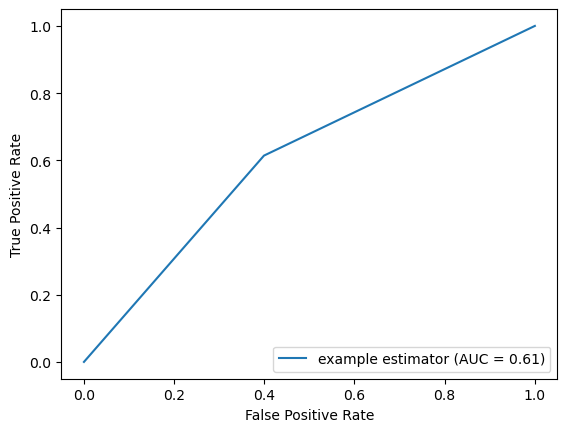

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.96    0.60      0.74    809.0
1                  0.10    0.61      0.17     57.0
accuracy           0.60    0.60      0.60      0.6
macro avg          0.53    0.61      0.45    866.0
weighted avg       0.90    0.60      0.70    866.0
None
Affichage de la matrice de confusion après optimisation


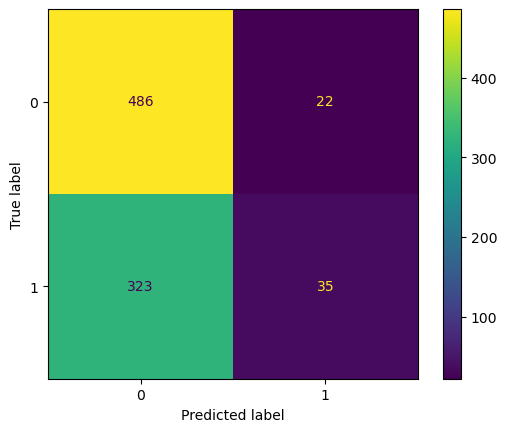

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.00
******* Best recall: 0.00
******* Best cost: 378.00
******* Best precision score: 0.00
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.93          0.0        570                   0.0   

   True Positives  True Negatives sampling standardisation  \
0               0             809     None  RobustScaler()   

                                       Best param         featu

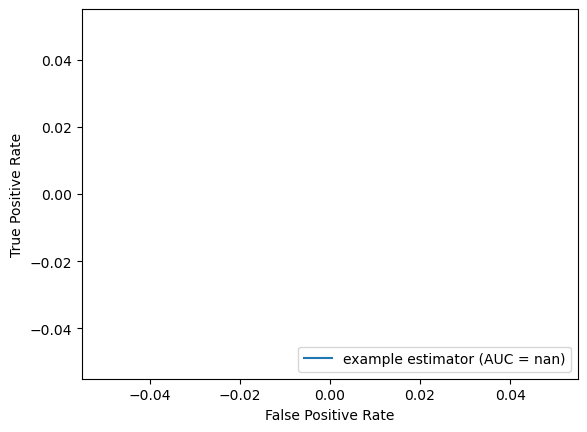

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.93    1.00      0.97   809.00
1                  0.00    0.00      0.00    57.00
accuracy           0.93    0.93      0.93     0.93
macro avg          0.47    0.50      0.48   866.00
weighted avg       0.87    0.93      0.90   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


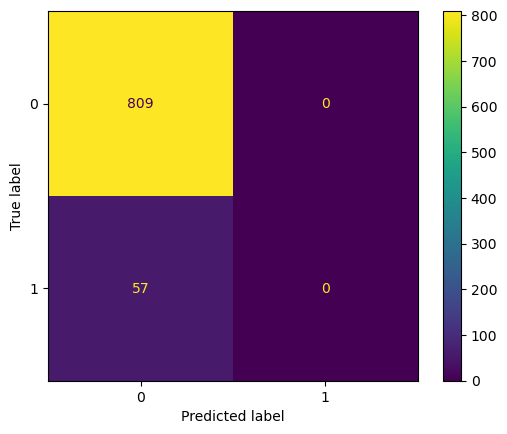

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': 15, 'n_estimators': 10}
******* Best accuracy: 0.57
******* Best recall: 0.57
******* Best cost: 178.40
******* Best precision score: 0.60
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest            0.7         0.35        589                  0.08   

   

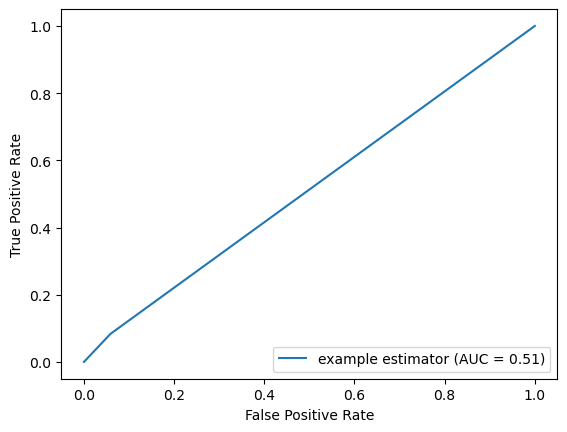

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.73      0.82    809.0
1                  0.08    0.35      0.14     57.0
accuracy           0.70    0.70      0.70      0.7
macro avg          0.51    0.54      0.48    866.0
weighted avg       0.88    0.70      0.78    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


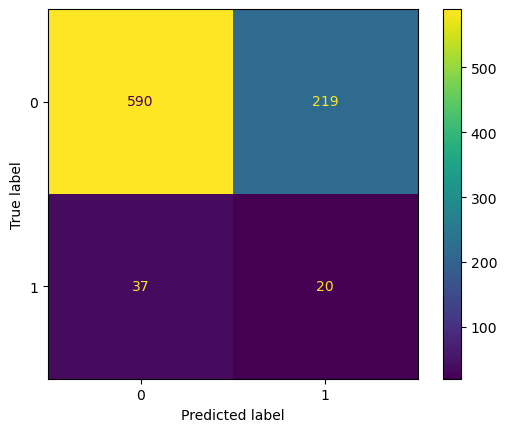

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.01, 'class_weight': {0: 2.0, 1: 2.0}, 'penalty': 'l2'}
Best accuracy:  0.3911806543385491
Best recall:  0.3911806543385491
Best cost:  237.8
Best precision score:  0.660130604288499
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.65         0.65        486   

   Best precision Score  True Positives  True Negatives       sampling  \
0                  0.11              37             523  undersampling   

    standardisation                                         Best pa

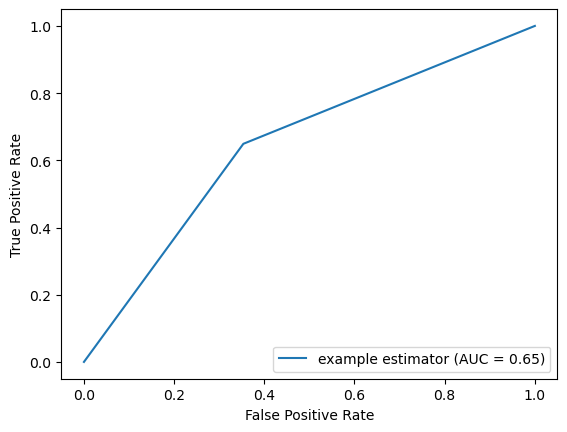

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.96    0.65      0.77   809.00
1                  0.11    0.65      0.19    57.00
accuracy           0.65    0.65      0.65     0.65
macro avg          0.54    0.65      0.48   866.00
weighted avg       0.91    0.65      0.74   866.00
None
Affichage de la matrice de confusion après optimisation


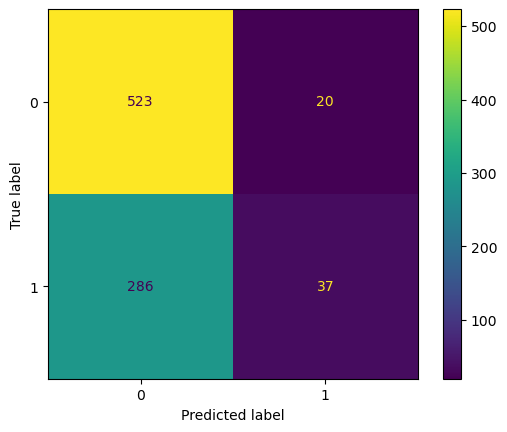

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.42
******* Best recall: 0.42
******* Best cost: 232.80
******* Best precision score: 0.53
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.83          0.4        450                  0.17   

   True Positives  True Negatives       sampling   standardisation  \
0              23             699  undersampling  StandardScaler()   

                                       Best par

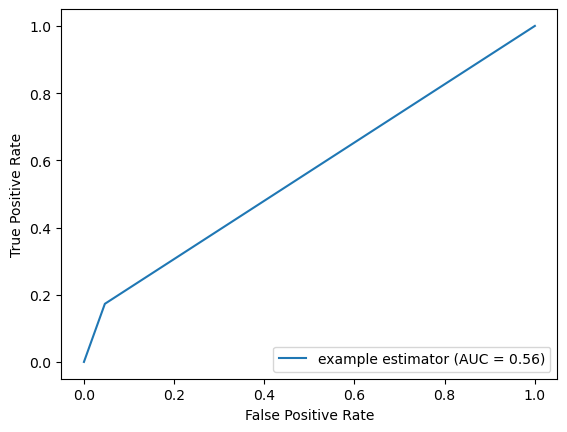

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.86      0.91   809.00
1                  0.17    0.40      0.24    57.00
accuracy           0.83    0.83      0.83     0.83
macro avg          0.56    0.63      0.57   866.00
weighted avg       0.90    0.83      0.86   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


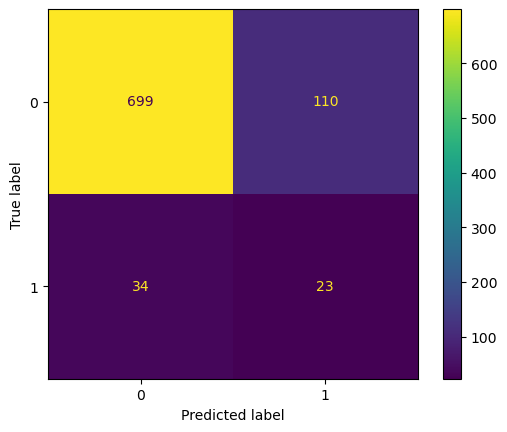

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 1.00
******* Best recall: 1.00
******* Best cost: 50.40
******* Best precision score: 0.93
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.79         0.21        591                  0.08   

  

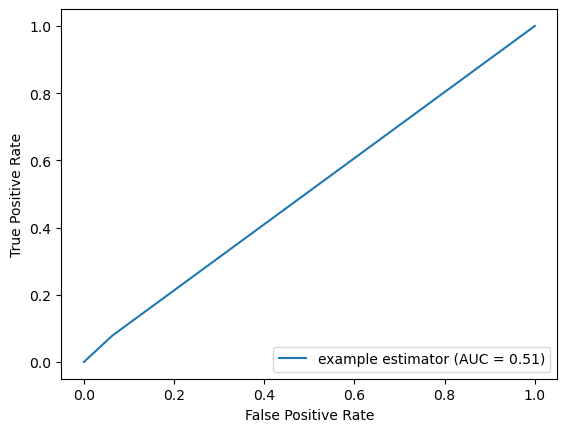

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.83      0.88   809.00
1                  0.08    0.21      0.11    57.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.51    0.52      0.50   866.00
weighted avg       0.88    0.79      0.83   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


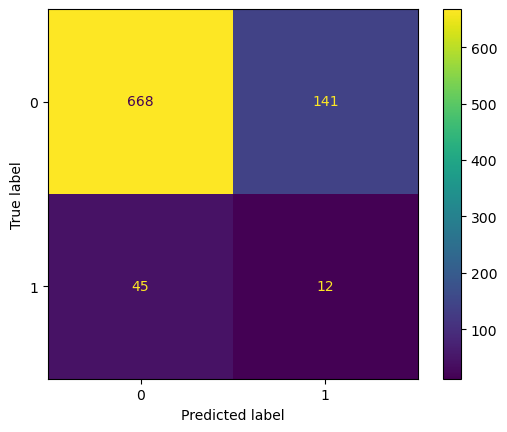

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.01, 'class_weight': {0: 2.0, 1: 2.0}, 'penalty': 'l2'}
Best accuracy:  0.3922968461843733
Best recall:  0.3922968461843733
Best cost:  4127.0
Best precision score:  0.6328816341005
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.65         0.65        486   

   Best precision Score  True Positives  True Negatives      sampling  \
0                  0.11              37             523  oversampling   

    standardisation                                         Best param

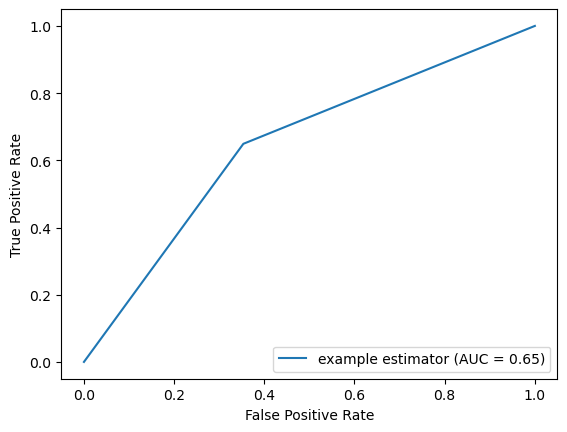

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.96    0.65      0.77   809.00
1                  0.11    0.65      0.19    57.00
accuracy           0.65    0.65      0.65     0.65
macro avg          0.54    0.65      0.48   866.00
weighted avg       0.91    0.65      0.74   866.00
None
Affichage de la matrice de confusion après optimisation


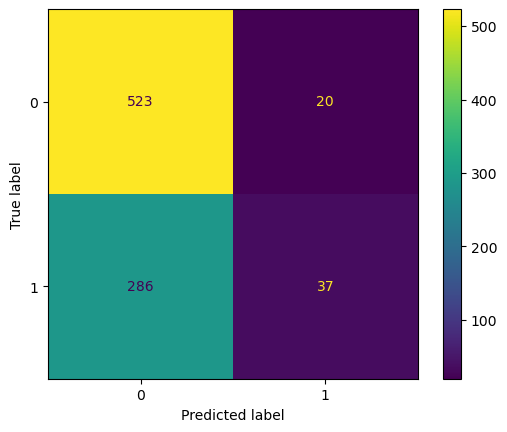

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'rbf'}
******* Best accuracy: 0.47
******* Best recall: 0.47
******* Best cost: 3731.60
******* Best precision score: 0.35
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.83          0.4        455                  0.17   

   True Positives  True Negatives      sampling   standardisation  \
0              23             694  oversampling  StandardScaler()   

                                    Best param     

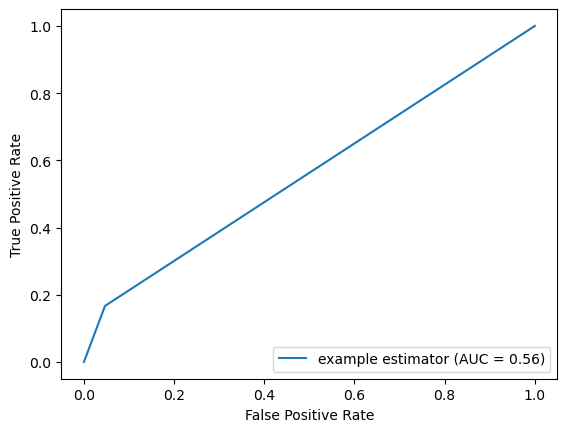

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.86      0.90   809.00
1                  0.17    0.40      0.24    57.00
accuracy           0.83    0.83      0.83     0.83
macro avg          0.56    0.63      0.57   866.00
weighted avg       0.90    0.83      0.86   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


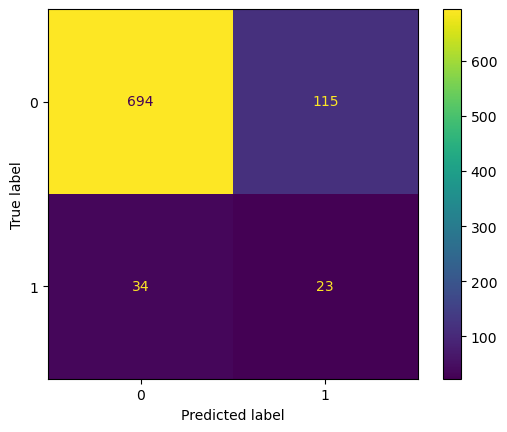

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': 1, 'n_estimators': 20}
******* Best accuracy: 0.34
******* Best recall: 0.34
******* Best cost: 346.60
******* Best precision score: 0.12
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.83          0.4        449                  0.17   

   T

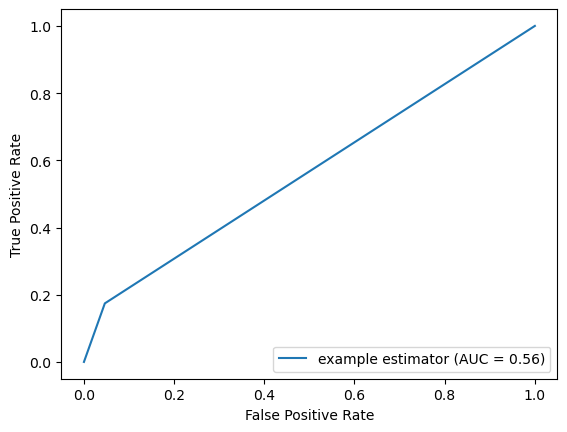

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.87      0.91   809.00
1                  0.17    0.40      0.24    57.00
accuracy           0.83    0.83      0.83     0.83
macro avg          0.56    0.63      0.58   866.00
weighted avg       0.90    0.83      0.86   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


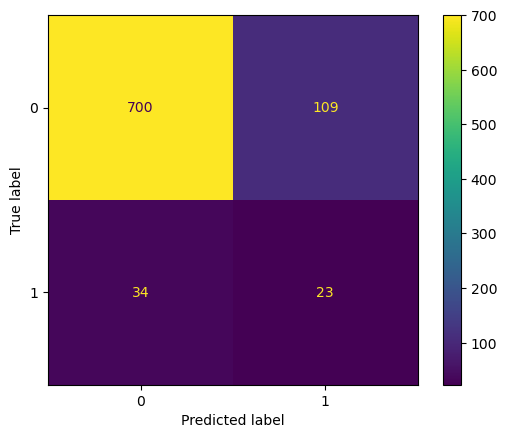

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.01, 'class_weight': {0: 1.0577451879010082, 1: 18.317460317460316}, 'penalty': 'l2'}
Best accuracy:  0.4025604551920341
Best recall:  0.4025604551920341
Best cost:  373.8
Best precision score:  0.09340815717601984
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.65         0.65        486   

   Best precision Score  True Positives  True Negatives sampling  \
0                  0.11              37             523     None   

    standardisation                            

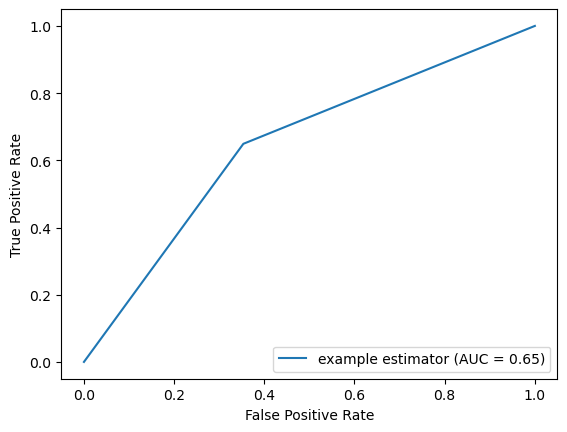

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.96    0.65      0.77   809.00
1                  0.11    0.65      0.19    57.00
accuracy           0.65    0.65      0.65     0.65
macro avg          0.54    0.65      0.48   866.00
weighted avg       0.91    0.65      0.74   866.00
None
Affichage de la matrice de confusion après optimisation


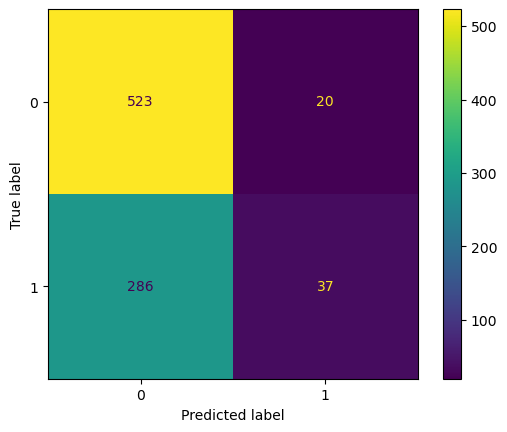

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.00
******* Best recall: 0.00
******* Best cost: 378.00
******* Best precision score: 0.00
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.93          0.0        570                   0.0   

   True Positives  True Negatives sampling   standardisation  \
0               0             809     None  StandardScaler()   

                                       Best param          

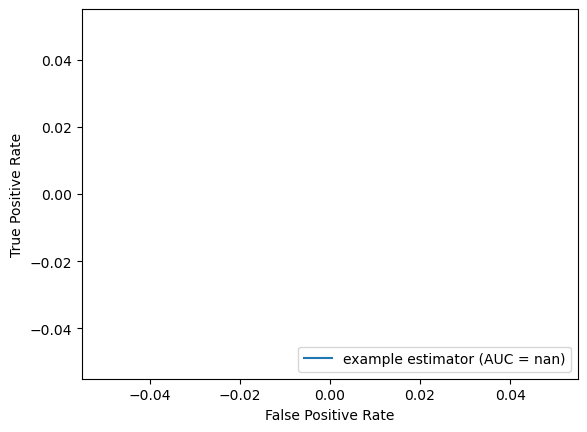

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.93    1.00      0.97   809.00
1                  0.00    0.00      0.00    57.00
accuracy           0.93    0.93      0.93     0.93
macro avg          0.47    0.50      0.48   866.00
weighted avg       0.87    0.93      0.90   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


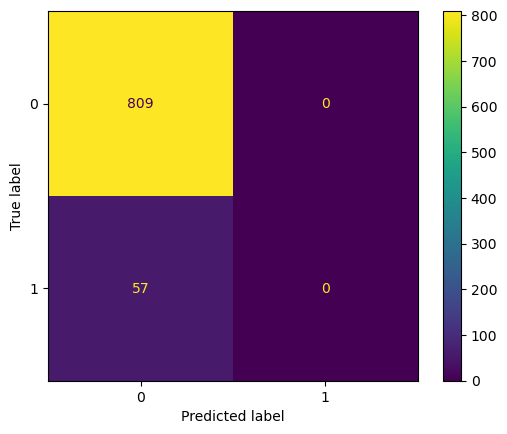

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 75}
******* Best accuracy: 0.53
******* Best recall: 0.53
******* Best cost: 197.20
******* Best precision score: 0.51
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.73         0.39        549                   0.1   

 

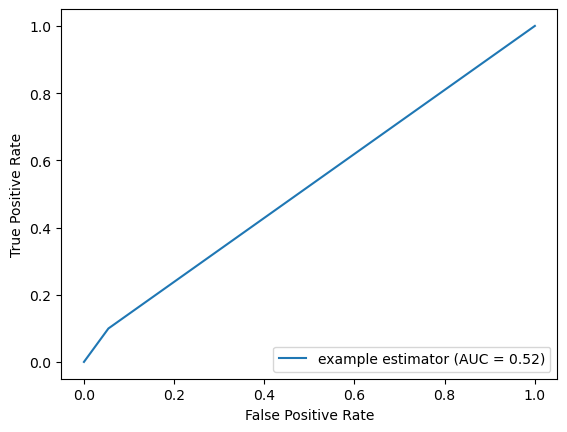

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.75      0.84   809.00
1                  0.10    0.39      0.16    57.00
accuracy           0.73    0.73      0.73     0.73
macro avg          0.52    0.57      0.50   866.00
weighted avg       0.89    0.73      0.79   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


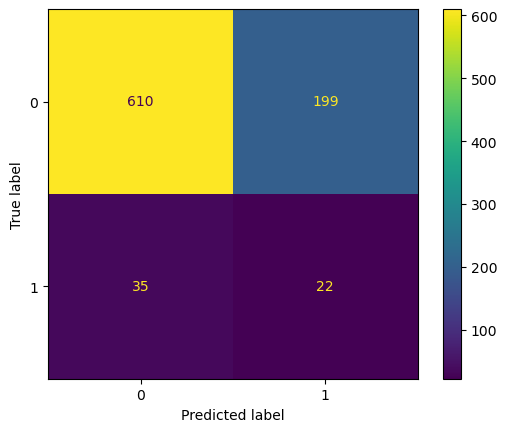

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': {0: 2.0, 1: 2.0}, 'penalty': 'l2'}
Best accuracy:  0.396728307254623
Best recall:  0.396728307254623
Best cost:  237.2
Best precision score:  0.6196969696969696
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.65         0.65        486   

   Best precision Score  True Positives  True Negatives       sampling  \
0                  0.11              37             523  undersampling   

  standardisation                                         Best para

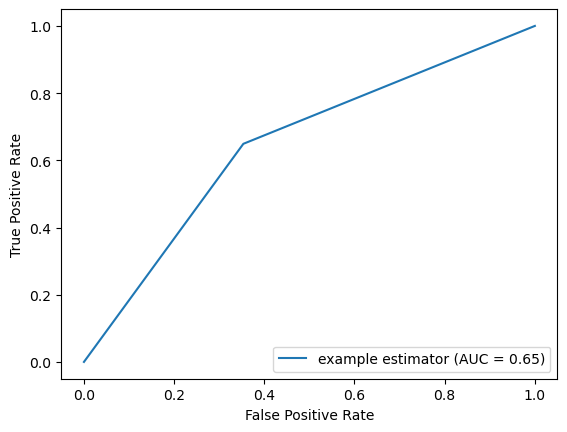

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.96    0.65      0.77   809.00
1                  0.11    0.65      0.19    57.00
accuracy           0.65    0.65      0.65     0.65
macro avg          0.54    0.65      0.48   866.00
weighted avg       0.91    0.65      0.74   866.00
None
Affichage de la matrice de confusion après optimisation


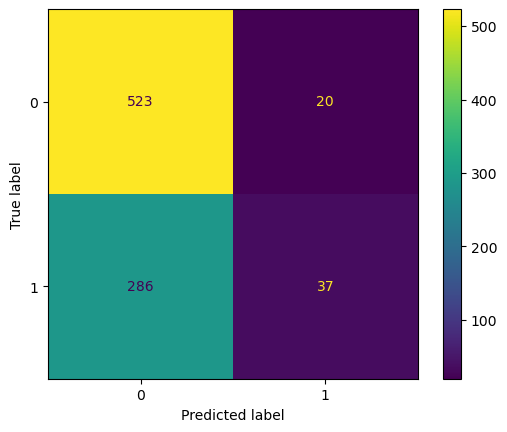

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.42
******* Best recall: 0.42
******* Best cost: 233.20
******* Best precision score: 0.52
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.83          0.4        450                  0.17   

   True Positives  True Negatives       sampling standardisation  \
0              23             699  undersampling  RobustScaler()   

                                       Best param  

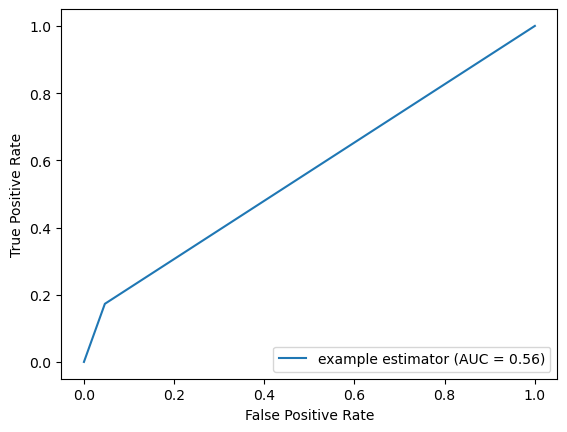

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.86      0.91   809.00
1                  0.17    0.40      0.24    57.00
accuracy           0.83    0.83      0.83     0.83
macro avg          0.56    0.63      0.57   866.00
weighted avg       0.90    0.83      0.86   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


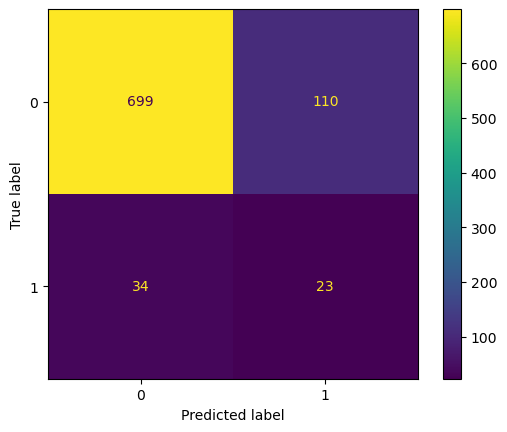

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 1.00
******* Best recall: 1.00
******* Best cost: 51.40
******* Best precision score: 0.93
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.78         0.21        594                  0.08   

  

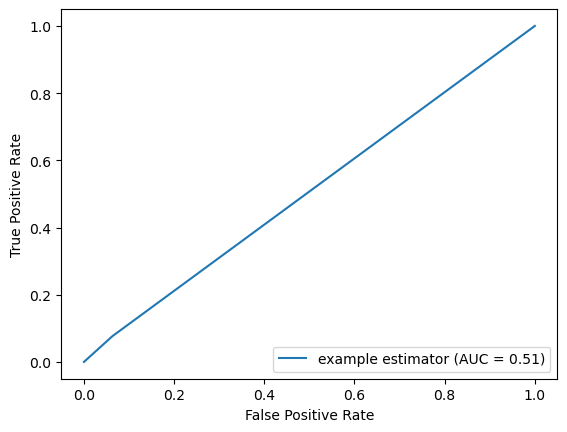

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.82      0.88   809.00
1                  0.08    0.21      0.11    57.00
accuracy           0.78    0.78      0.78     0.78
macro avg          0.51    0.52      0.49   866.00
weighted avg       0.88    0.78      0.83   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


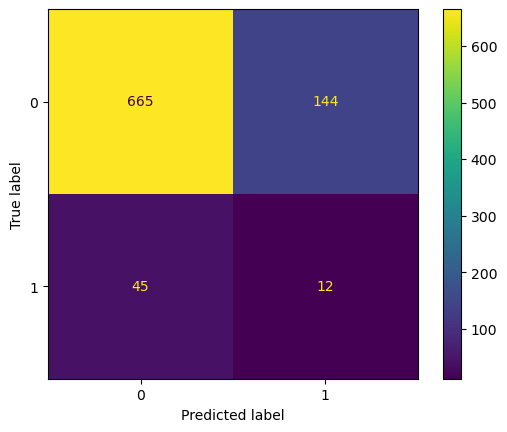

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.1, 'class_weight': {0: 2.0, 1: 2.0}, 'penalty': 'l2'}
Best accuracy:  0.39811471391554026
Best recall:  0.39811471391554026
Best cost:  4087.2
Best precision score:  0.6393737565180834
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.65         0.65        486   

   Best precision Score  True Positives  True Negatives      sampling  \
0                  0.11              37             523  oversampling   

  standardisation                                         Best par

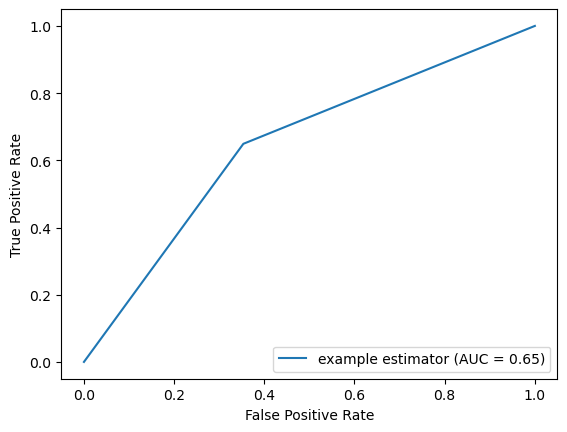

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.96    0.65      0.77   809.00
1                  0.11    0.65      0.19    57.00
accuracy           0.65    0.65      0.65     0.65
macro avg          0.54    0.65      0.48   866.00
weighted avg       0.91    0.65      0.74   866.00
None
Affichage de la matrice de confusion après optimisation


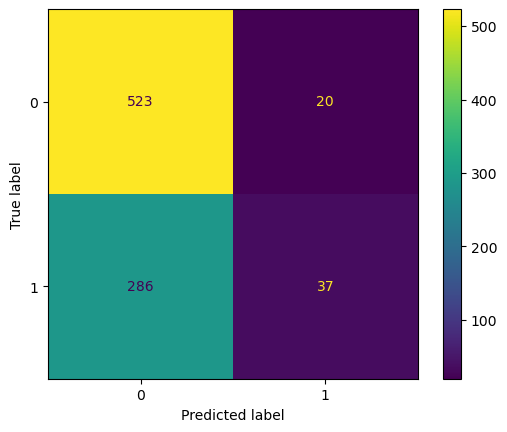

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'rbf'}
******* Best accuracy: 0.47
******* Best recall: 0.47
******* Best cost: 3749.60
******* Best precision score: 0.34
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.83          0.4        454                  0.17   

   True Positives  True Negatives      sampling standardisation  \
0              23             695  oversampling  RobustScaler()   

                                    Best param         

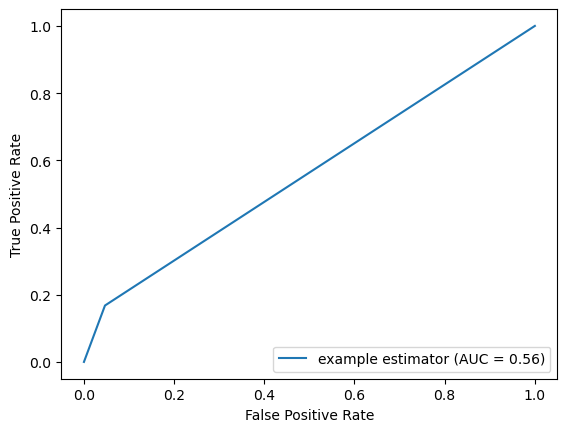

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.86      0.90   809.00
1                  0.17    0.40      0.24    57.00
accuracy           0.83    0.83      0.83     0.83
macro avg          0.56    0.63      0.57   866.00
weighted avg       0.90    0.83      0.86   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


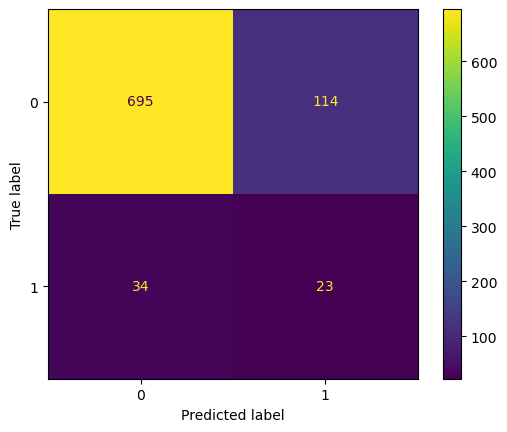

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': 1, 'n_estimators': 20}
******* Best accuracy: 0.34
******* Best recall: 0.34
******* Best cost: 346.60
******* Best precision score: 0.12
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.83          0.4        449                  0.17   

   T

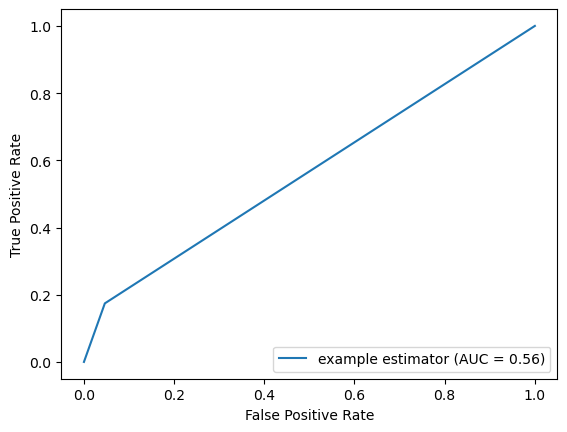

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.87      0.91   809.00
1                  0.17    0.40      0.24    57.00
accuracy           0.83    0.83      0.83     0.83
macro avg          0.56    0.63      0.58   866.00
weighted avg       0.90    0.83      0.86   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


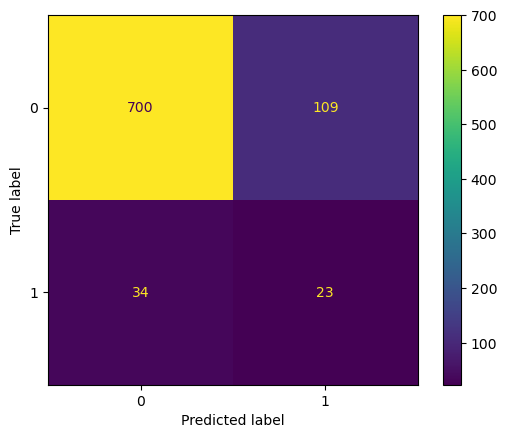

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.01, 'class_weight': {0: 1.0577451879010082, 1: 18.317460317460316}, 'penalty': 'l2'}
Best accuracy:  0.4025604551920341
Best recall:  0.4025604551920341
Best cost:  373.8
Best precision score:  0.09340815717601984
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.65         0.65        486   

   Best precision Score  True Positives  True Negatives sampling  \
0                  0.11              37             523     None   

  standardisation                              

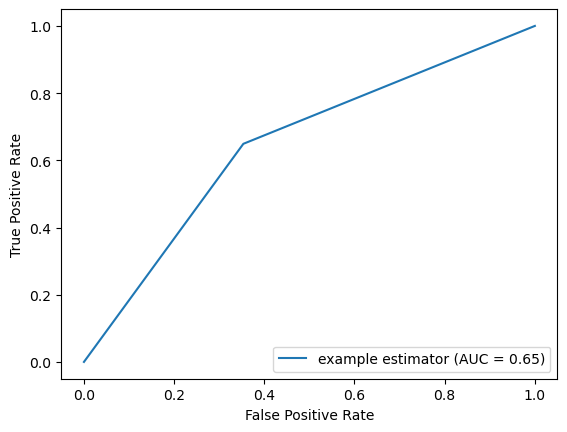

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.96    0.65      0.77   809.00
1                  0.11    0.65      0.19    57.00
accuracy           0.65    0.65      0.65     0.65
macro avg          0.54    0.65      0.48   866.00
weighted avg       0.91    0.65      0.74   866.00
None
Affichage de la matrice de confusion après optimisation


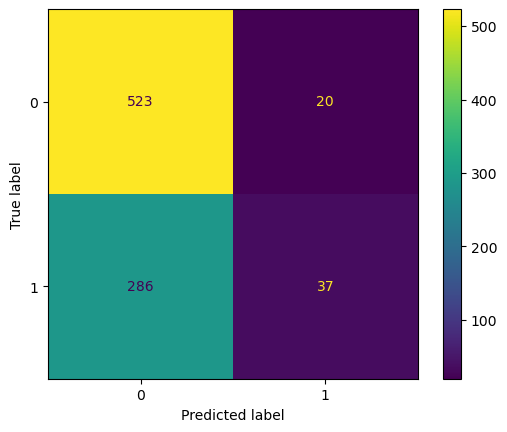

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.00
******* Best recall: 0.00
******* Best cost: 378.00
******* Best precision score: 0.00
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.93          0.0        570                   0.0   

   True Positives  True Negatives sampling standardisation  \
0               0             809     None  RobustScaler()   

                                       Best param            fe

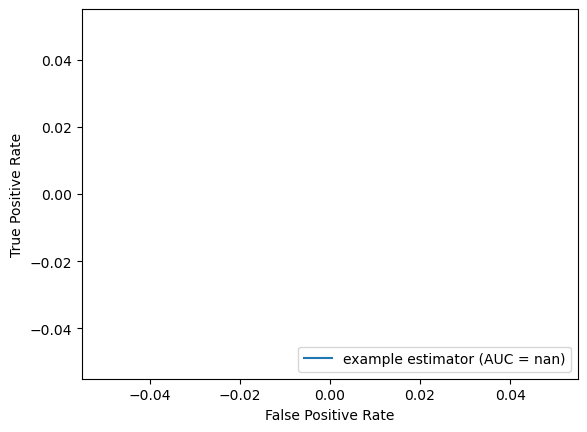

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.93    1.00      0.97   809.00
1                  0.00    0.00      0.00    57.00
accuracy           0.93    0.93      0.93     0.93
macro avg          0.47    0.50      0.48   866.00
weighted avg       0.87    0.93      0.90   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


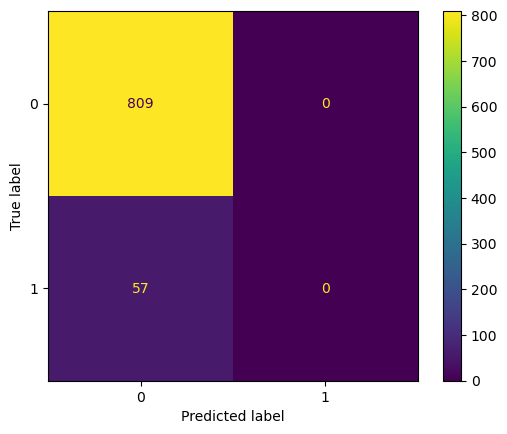

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.26
******* Best recall: 0.26
******* Best cost: 281.40
******* Best precision score: 0.76
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.85         0.28        500                  0.15   

 

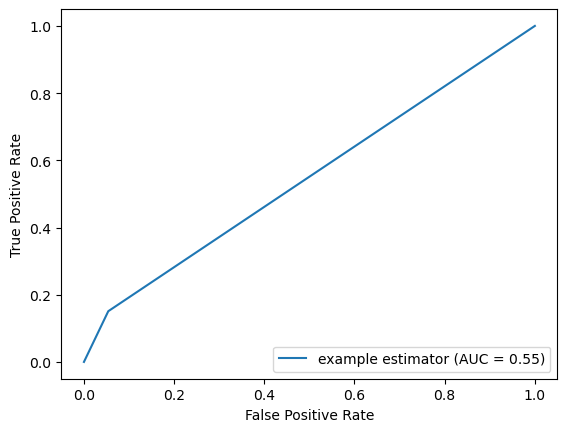

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.89      0.92   809.00
1                  0.15    0.28      0.20    57.00
accuracy           0.85    0.85      0.85     0.85
macro avg          0.55    0.58      0.56   866.00
weighted avg       0.89    0.85      0.87   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


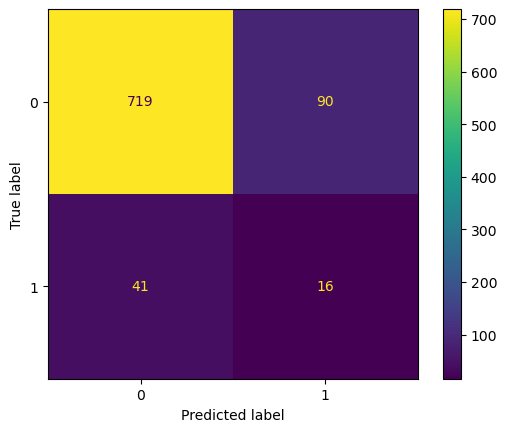

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': {0: 2.0, 1: 2.0}, 'penalty': 'l2'}
Best accuracy:  0.41052631578947363
Best recall:  0.41052631578947363
Best cost:  234.4
Best precision score:  0.7024761904761905
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.85         0.28        500   

   Best precision Score  True Positives  True Negatives       sampling  \
0                  0.15              16             719  undersampling   

    standardisation                                         Bes

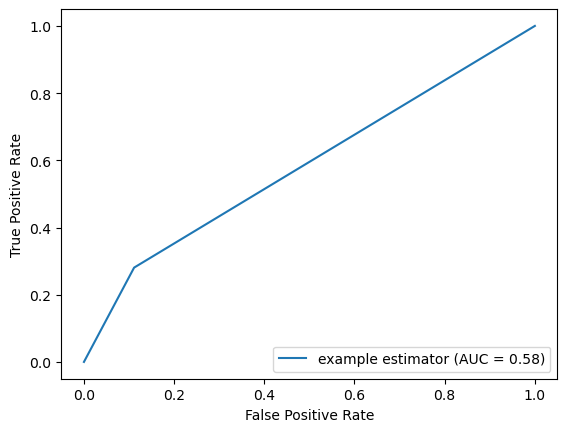

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.95    0.89      0.92   809.00
1                  0.15    0.28      0.20    57.00
accuracy           0.85    0.85      0.85     0.85
macro avg          0.55    0.58      0.56   866.00
weighted avg       0.89    0.85      0.87   866.00
None
Affichage de la matrice de confusion après optimisation


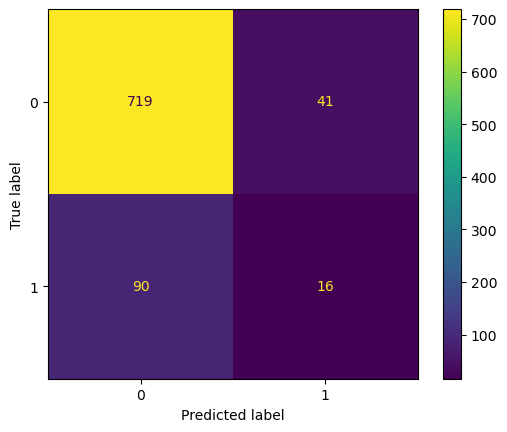

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.35
******* Best recall: 0.35
******* Best cost: 255.80
******* Best precision score: 0.55
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.85         0.28        500                  0.15   

   True Positives  True Negatives       sampling   standardisation  \
0              16             719  undersampling  StandardScaler()   

                                       Best par

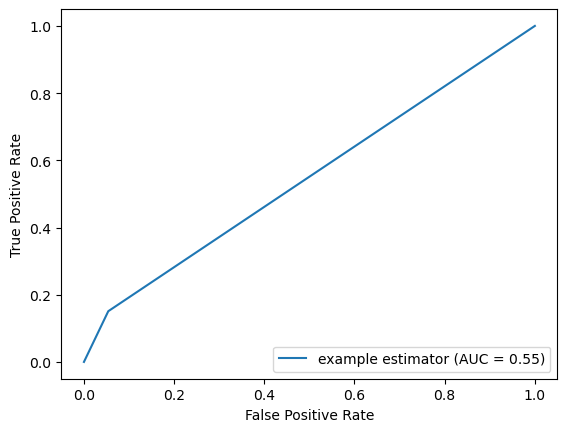

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.89      0.92   809.00
1                  0.15    0.28      0.20    57.00
accuracy           0.85    0.85      0.85     0.85
macro avg          0.55    0.58      0.56   866.00
weighted avg       0.89    0.85      0.87   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


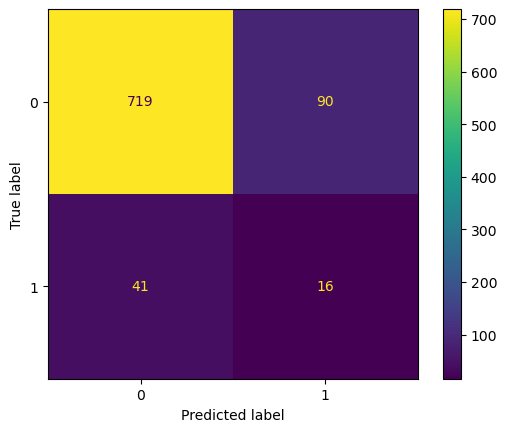

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.26
******* Best recall: 0.26
******* Best cost: 4925.00
******* Best precision score: 0.72
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.85         0.28        500                  0.15   



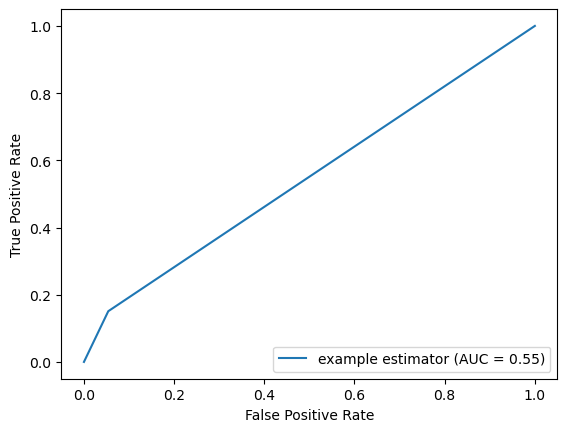

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.89      0.92   809.00
1                  0.15    0.28      0.20    57.00
accuracy           0.85    0.85      0.85     0.85
macro avg          0.55    0.58      0.56   866.00
weighted avg       0.89    0.85      0.87   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


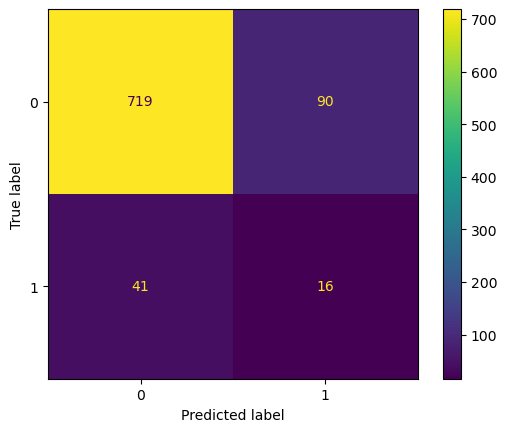

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.25755911945280946
Best recall:  0.25755911945280946
Best cost:  4925.0
Best precision score:  0.7219041615299056
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.85         0.28        500   

   Best precision Score  True Positives  True Negatives      sampling  \
0                  0.15              16             719  oversampling   

    standardisation                                         Best param

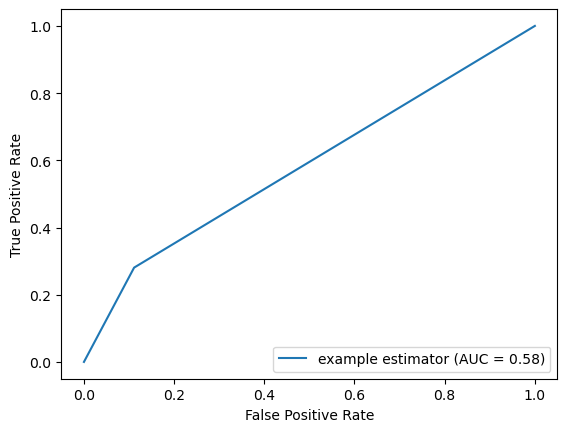

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.95    0.89      0.92   809.00
1                  0.15    0.28      0.20    57.00
accuracy           0.85    0.85      0.85     0.85
macro avg          0.55    0.58      0.56   866.00
weighted avg       0.89    0.85      0.87   866.00
None
Affichage de la matrice de confusion après optimisation


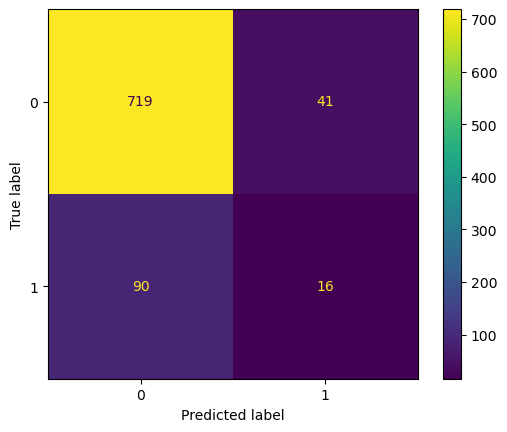

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.45
******* Best recall: 0.45
******* Best cost: 3873.00
******* Best precision score: 0.34
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.85         0.28        500                  0.15   

   True Positives  True Negatives      sampling   standardisation  \
0              16             719  oversampling  StandardScaler()   

                                       Best para

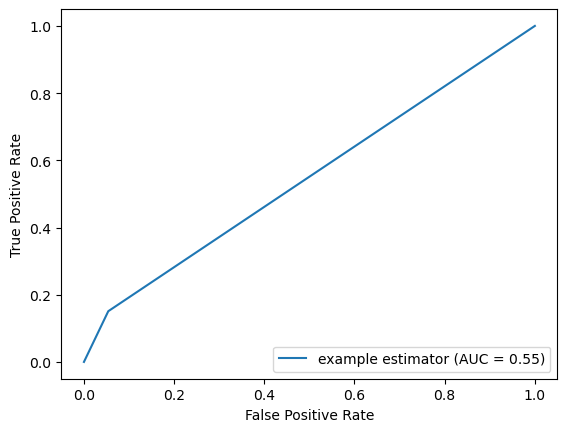

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.89      0.92   809.00
1                  0.15    0.28      0.20    57.00
accuracy           0.85    0.85      0.85     0.85
macro avg          0.55    0.58      0.56   866.00
weighted avg       0.89    0.85      0.87   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


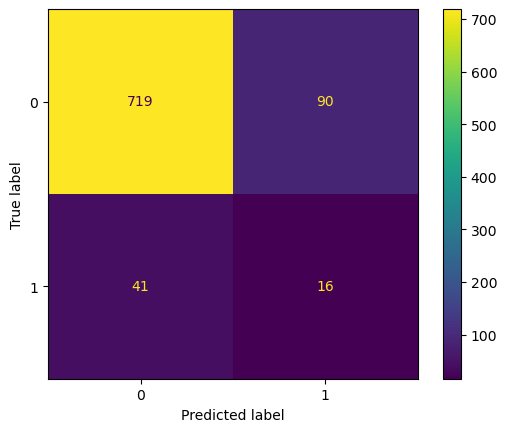

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.26
******* Best recall: 0.26
******* Best cost: 343.00
******* Best precision score: 0.13
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.85         0.28        500                  0.15   

 

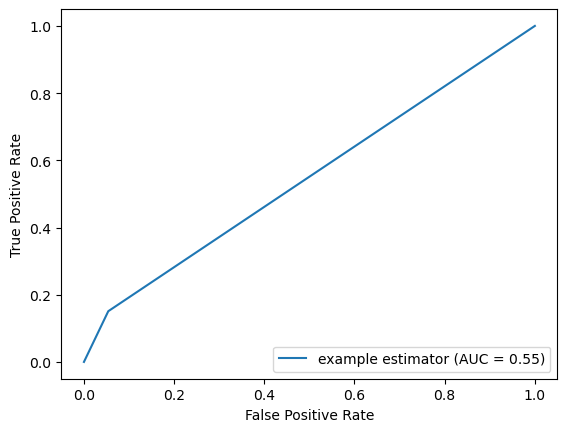

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.89      0.92   809.00
1                  0.15    0.28      0.20    57.00
accuracy           0.85    0.85      0.85     0.85
macro avg          0.55    0.58      0.56   866.00
weighted avg       0.89    0.85      0.87   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


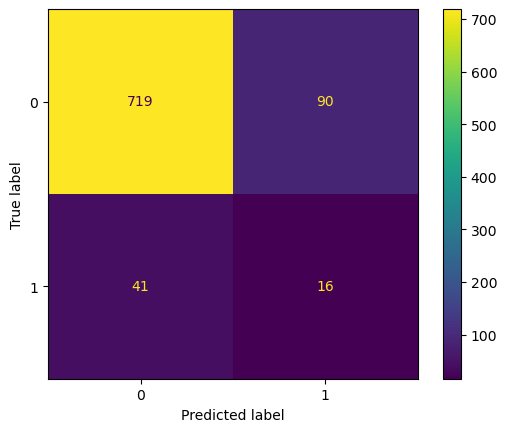

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.2644381223328592
Best recall:  0.2644381223328592
Best cost:  343.0
Best precision score:  0.132709993208845
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.85         0.28        500   

   Best precision Score  True Positives  True Negatives sampling  \
0                  0.15              16             719     None   

    standardisation                                         Best param  \
0  Standar

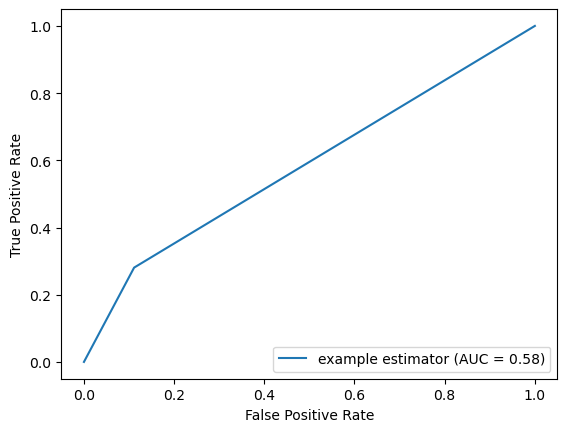

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.95    0.89      0.92   809.00
1                  0.15    0.28      0.20    57.00
accuracy           0.85    0.85      0.85     0.85
macro avg          0.55    0.58      0.56   866.00
weighted avg       0.89    0.85      0.87   866.00
None
Affichage de la matrice de confusion après optimisation


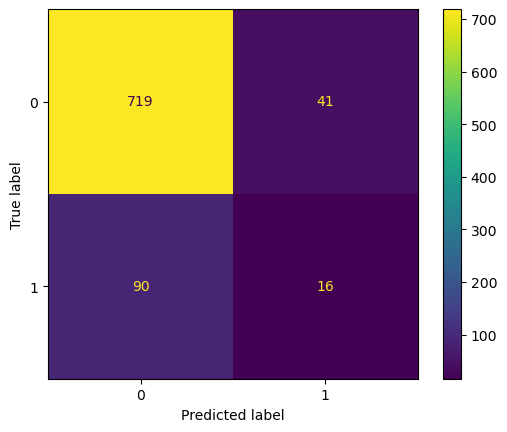

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.00
******* Best recall: 0.00
******* Best cost: 378.00
******* Best precision score: 0.00
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.93          0.0        570                   0.0   

   True Positives  True Negatives sampling   standardisation  \
0               0             809     None  StandardScaler()   

                                       Best param       fea

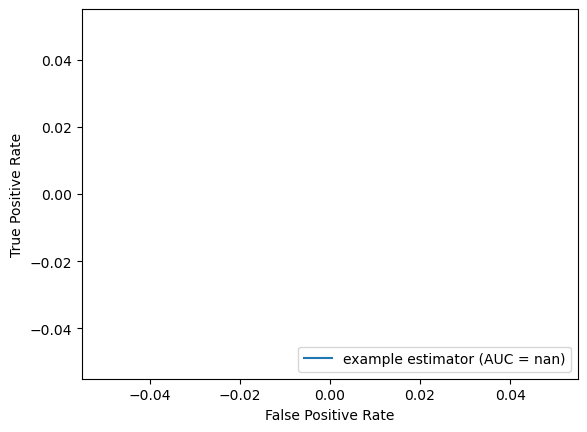

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.93    1.00      0.97   809.00
1                  0.00    0.00      0.00    57.00
accuracy           0.93    0.93      0.93     0.93
macro avg          0.47    0.50      0.48   866.00
weighted avg       0.87    0.93      0.90   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


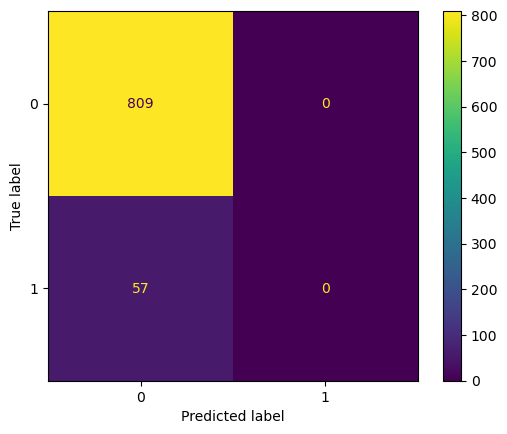

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.26
******* Best recall: 0.26
******* Best cost: 280.80
******* Best precision score: 0.79
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.85         0.28        500                  0.15   

 

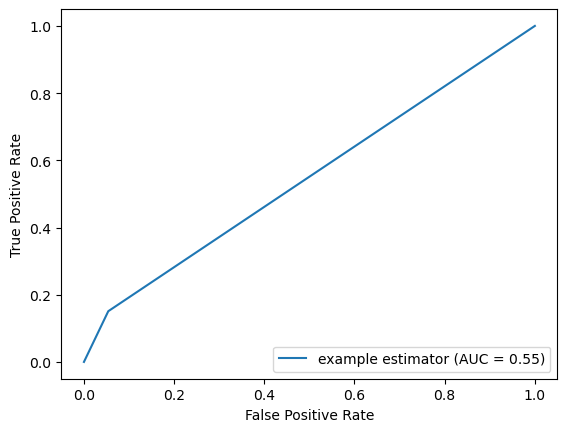

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.89      0.92   809.00
1                  0.15    0.28      0.20    57.00
accuracy           0.85    0.85      0.85     0.85
macro avg          0.55    0.58      0.56   866.00
weighted avg       0.89    0.85      0.87   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


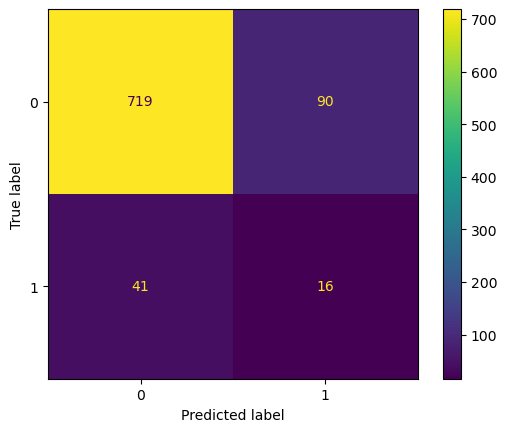

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': {0: 2.0, 1: 2.0}, 'penalty': 'l2'}
Best accuracy:  0.41052631578947363
Best recall:  0.41052631578947363
Best cost:  234.0
Best precision score:  0.7234285714285714
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.85         0.28        500   

   Best precision Score  True Positives  True Negatives       sampling  \
0                  0.15              16             719  undersampling   

  standardisation                                         Best 

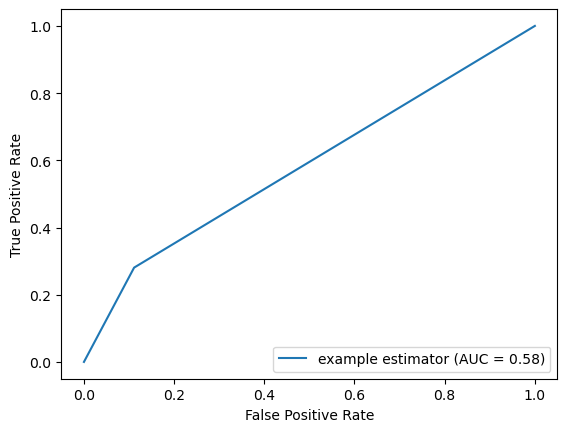

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.95    0.89      0.92   809.00
1                  0.15    0.28      0.20    57.00
accuracy           0.85    0.85      0.85     0.85
macro avg          0.55    0.58      0.56   866.00
weighted avg       0.89    0.85      0.87   866.00
None
Affichage de la matrice de confusion après optimisation


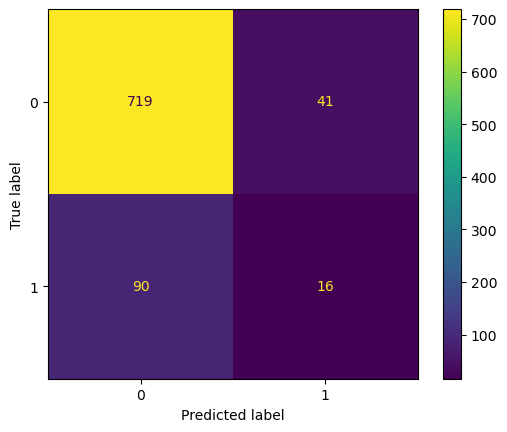

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.35
******* Best recall: 0.35
******* Best cost: 255.20
******* Best precision score: 0.58
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.85         0.28        500                  0.15   

   True Positives  True Negatives       sampling standardisation  \
0              16             719  undersampling  RobustScaler()   

                                       Best param  

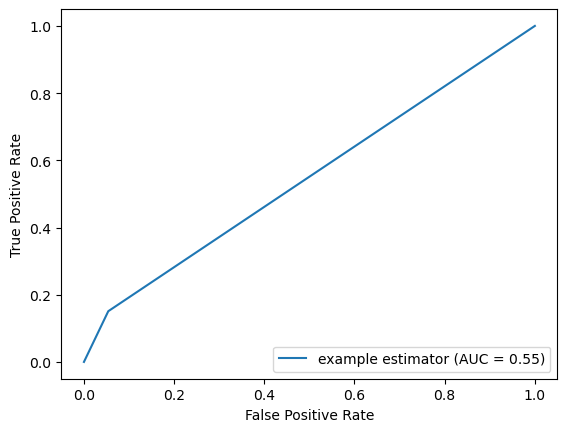

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.89      0.92   809.00
1                  0.15    0.28      0.20    57.00
accuracy           0.85    0.85      0.85     0.85
macro avg          0.55    0.58      0.56   866.00
weighted avg       0.89    0.85      0.87   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


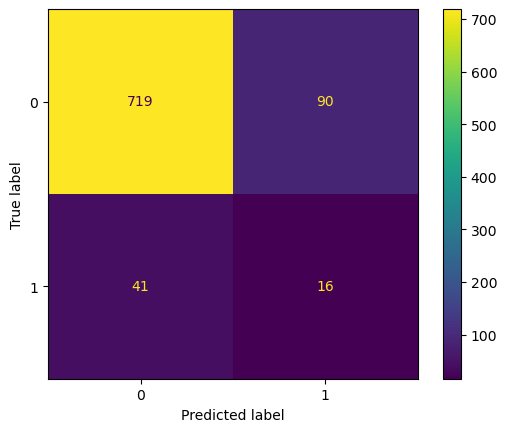

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.26
******* Best recall: 0.26
******* Best cost: 4927.00
******* Best precision score: 0.72
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.85         0.28        500                  0.15   



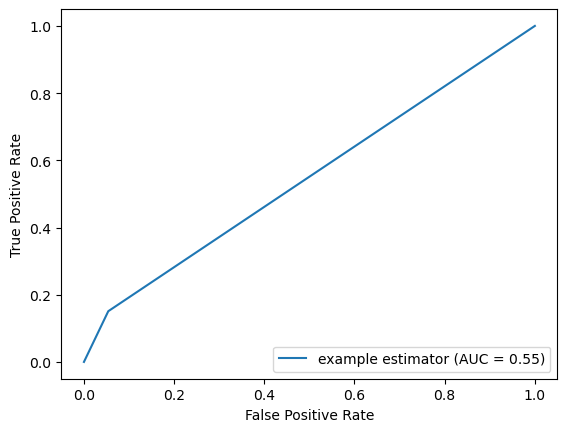

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.89      0.92   809.00
1                  0.15    0.28      0.20    57.00
accuracy           0.85    0.85      0.85     0.85
macro avg          0.55    0.58      0.56   866.00
weighted avg       0.89    0.85      0.87   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


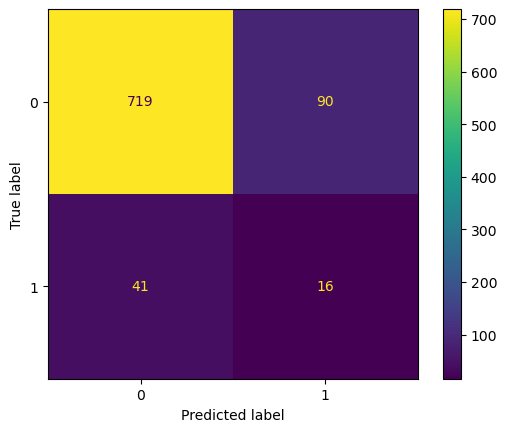

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.25725424282746223
Best recall:  0.25725424282746223
Best cost:  4927.0
Best precision score:  0.7212657663358462
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.85         0.28        500   

   Best precision Score  True Positives  True Negatives      sampling  \
0                  0.15              16             719  oversampling   

  standardisation                                         Best param  

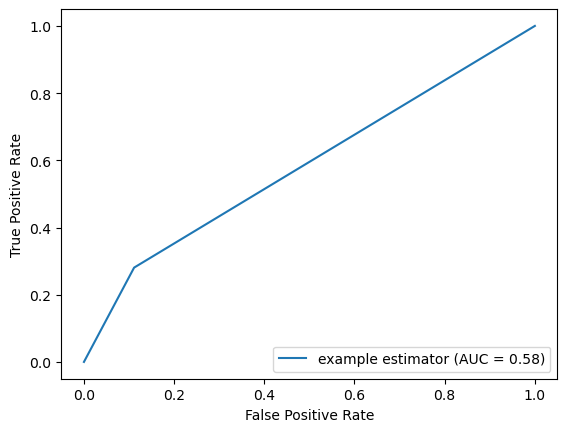

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.95    0.89      0.92   809.00
1                  0.15    0.28      0.20    57.00
accuracy           0.85    0.85      0.85     0.85
macro avg          0.55    0.58      0.56   866.00
weighted avg       0.89    0.85      0.87   866.00
None
Affichage de la matrice de confusion après optimisation


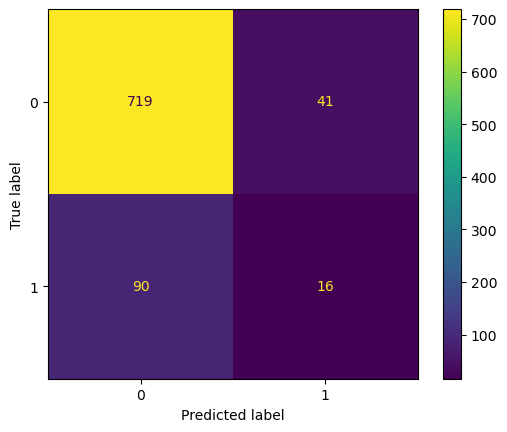

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.45
******* Best recall: 0.45
******* Best cost: 3873.00
******* Best precision score: 0.34
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.85         0.28        500                  0.15   

   True Positives  True Negatives      sampling standardisation  \
0              16             719  oversampling  RobustScaler()   

                                       Best param   

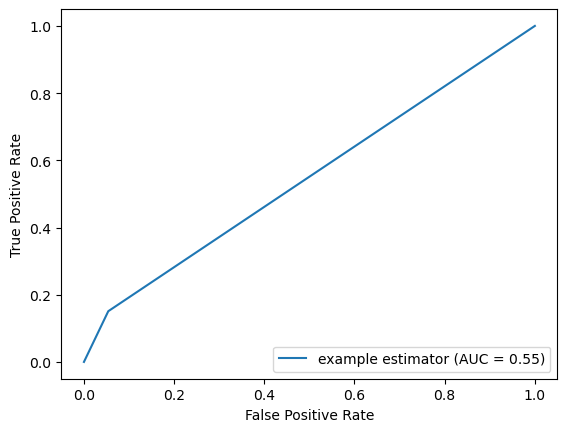

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.89      0.92   809.00
1                  0.15    0.28      0.20    57.00
accuracy           0.85    0.85      0.85     0.85
macro avg          0.55    0.58      0.56   866.00
weighted avg       0.89    0.85      0.87   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


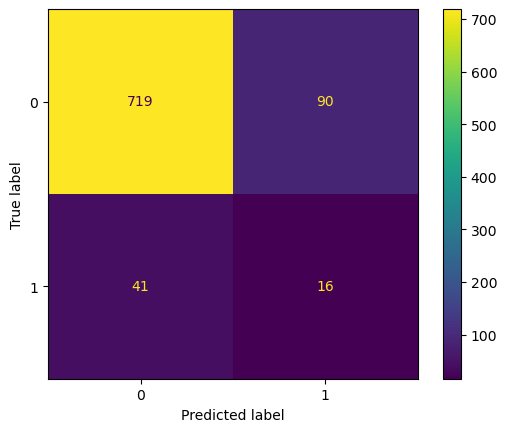

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.26
******* Best recall: 0.26
******* Best cost: 343.00
******* Best precision score: 0.13
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.85         0.28        500                  0.15   

 

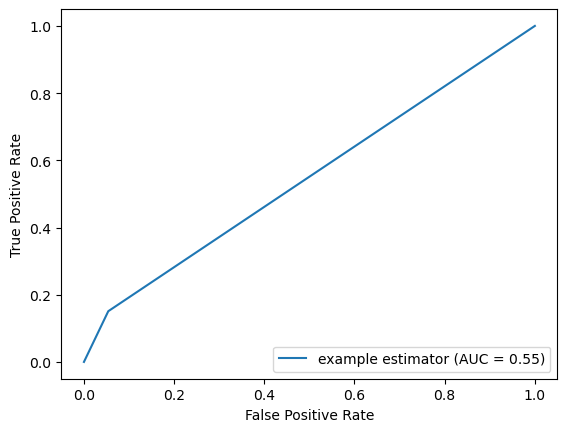

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.95    0.89      0.92   809.00
1                  0.15    0.28      0.20    57.00
accuracy           0.85    0.85      0.85     0.85
macro avg          0.55    0.58      0.56   866.00
weighted avg       0.89    0.85      0.87   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


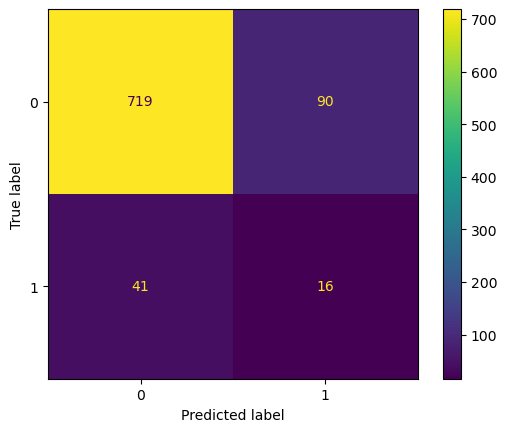

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.2644381223328592
Best recall:  0.2644381223328592
Best cost:  343.0
Best precision score:  0.132709993208845
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.85         0.28        500   

   Best precision Score  True Positives  True Negatives sampling  \
0                  0.15              16             719     None   

  standardisation                                         Best param  \
0  RobustSca

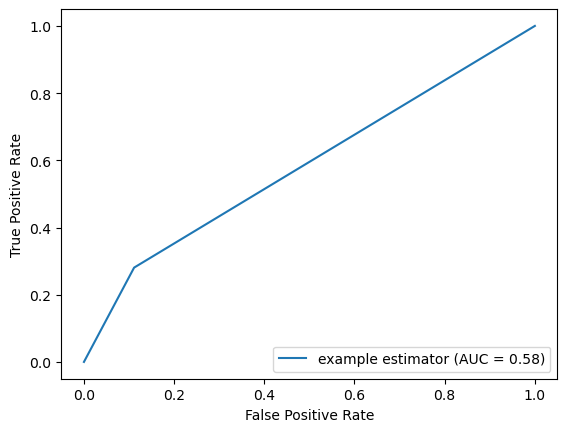

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.95    0.89      0.92   809.00
1                  0.15    0.28      0.20    57.00
accuracy           0.85    0.85      0.85     0.85
macro avg          0.55    0.58      0.56   866.00
weighted avg       0.89    0.85      0.87   866.00
None
Affichage de la matrice de confusion après optimisation


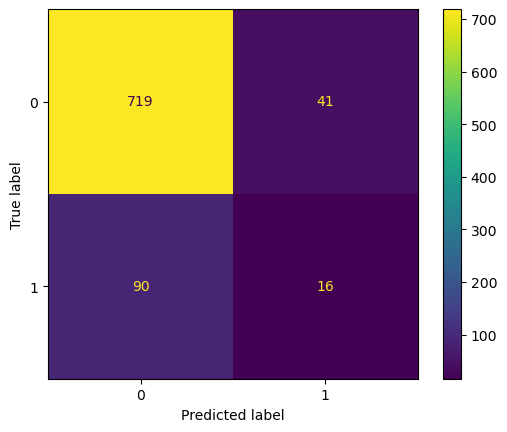

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.00
******* Best recall: 0.00
******* Best cost: 378.00
******* Best precision score: 0.00
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.93          0.0        570                   0.0   

   True Positives  True Negatives sampling standardisation  \
0               0             809     None  RobustScaler()   

                                       Best param       feature

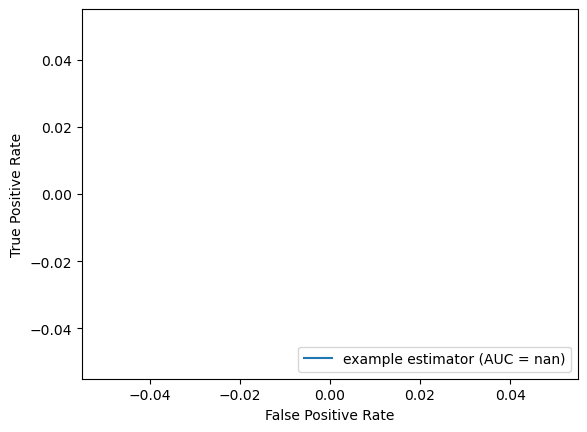

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.93    1.00      0.97   809.00
1                  0.00    0.00      0.00    57.00
accuracy           0.93    0.93      0.93     0.93
macro avg          0.47    0.50      0.48   866.00
weighted avg       0.87    0.93      0.90   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


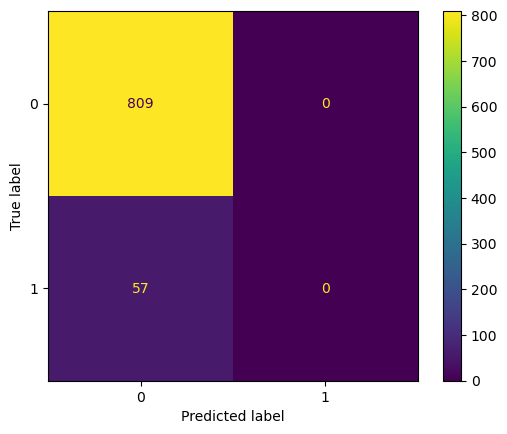

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.19
******* Best recall: 0.19
******* Best cost: 307.80
******* Best precision score: 0.77
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest            0.9         0.19        503                   0.2   

 

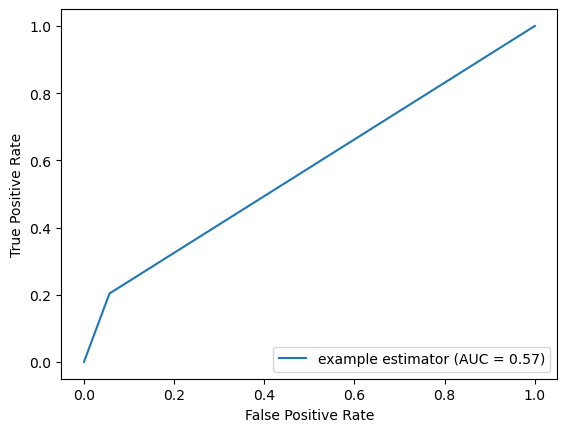

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.95      0.95    809.0
1                  0.20    0.19      0.20     57.0
accuracy           0.90    0.90      0.90      0.9
macro avg          0.57    0.57      0.57    866.0
weighted avg       0.89    0.90      0.90    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


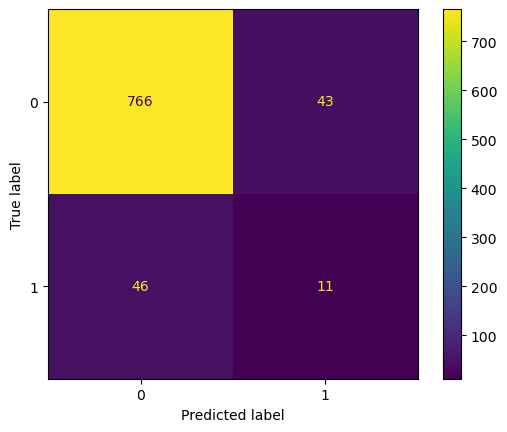

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': {0: 2.0, 1: 2.0}, 'penalty': 'l2'}
Best accuracy:  0.3684210526315789
Best recall:  0.3684210526315789
Best cost:  248.8
Best precision score:  0.7587316017316017
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression            0.9         0.19        503   

   Best precision Score  True Positives  True Negatives       sampling  \
0                   0.2              11             766  undersampling   

    standardisation                                         Best 

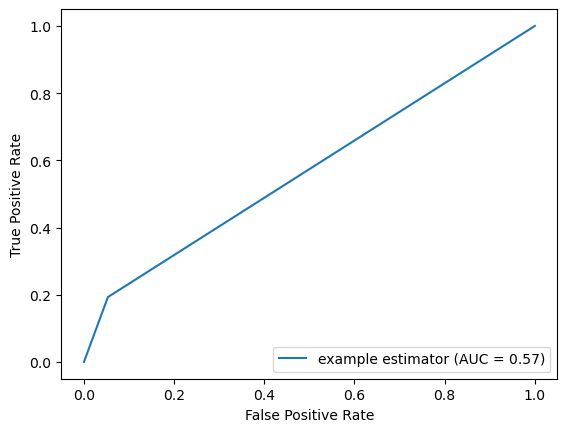

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.94    0.95      0.95    809.0
1                  0.20    0.19      0.20     57.0
accuracy           0.90    0.90      0.90      0.9
macro avg          0.57    0.57      0.57    866.0
weighted avg       0.89    0.90      0.90    866.0
None
Affichage de la matrice de confusion après optimisation


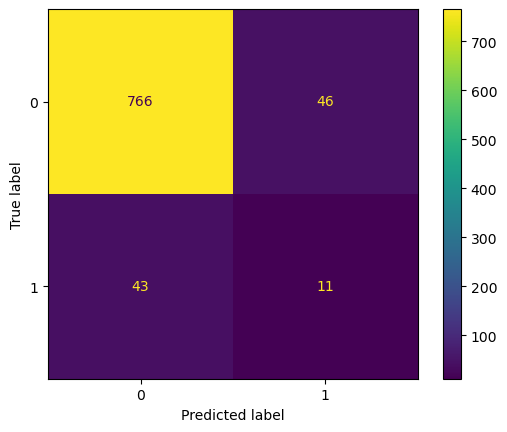

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.34
******* Best recall: 0.34
******* Best cost: 258.20
******* Best precision score: 0.63
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM            0.9         0.19        503                   0.2   

   True Positives  True Negatives       sampling   standardisation  \
0              11             766  undersampling  StandardScaler()   

                                       Best par

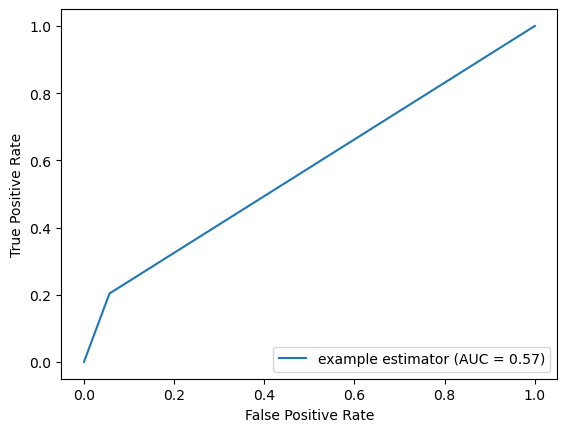

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.95      0.95    809.0
1                  0.20    0.19      0.20     57.0
accuracy           0.90    0.90      0.90      0.9
macro avg          0.57    0.57      0.57    866.0
weighted avg       0.89    0.90      0.90    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


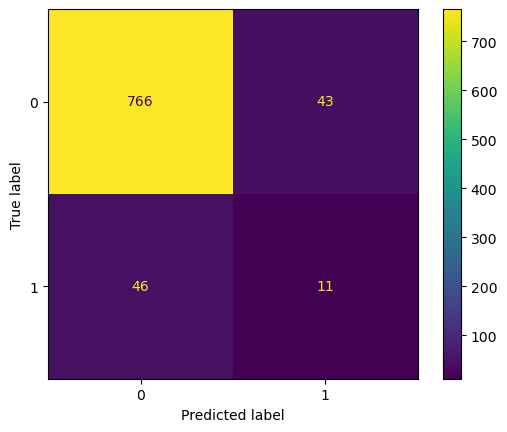

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.20
******* Best recall: 0.20
******* Best cost: 5268.80
******* Best precision score: 0.78
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest            0.9         0.19        503                   0.2   



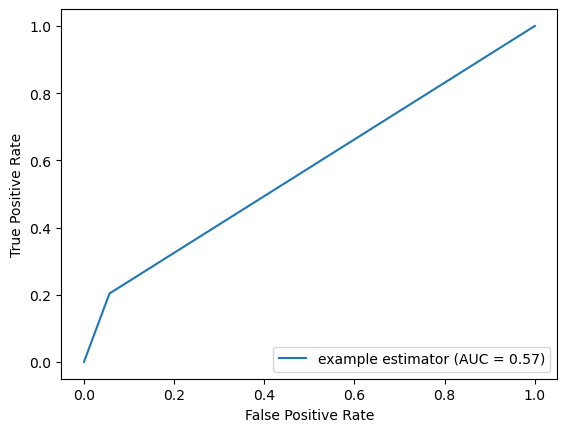

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.95      0.95    809.0
1                  0.20    0.19      0.20     57.0
accuracy           0.90    0.90      0.90      0.9
macro avg          0.57    0.57      0.57    866.0
weighted avg       0.89    0.90      0.90    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


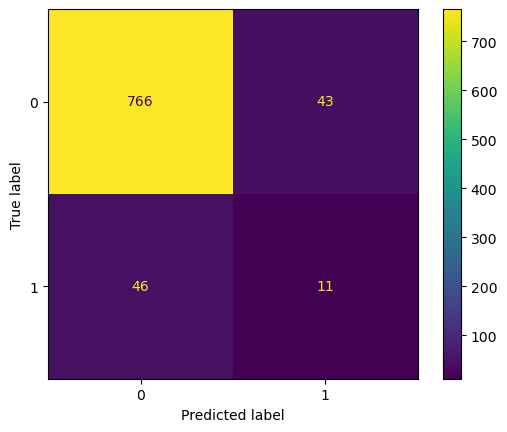

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.20073254429581905
Best recall:  0.20073254429581905
Best cost:  5268.8
Best precision score:  0.7809479164189028
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression            0.9         0.19        503   

   Best precision Score  True Positives  True Negatives      sampling  \
0                   0.2              11             766  oversampling   

    standardisation                                         Best param

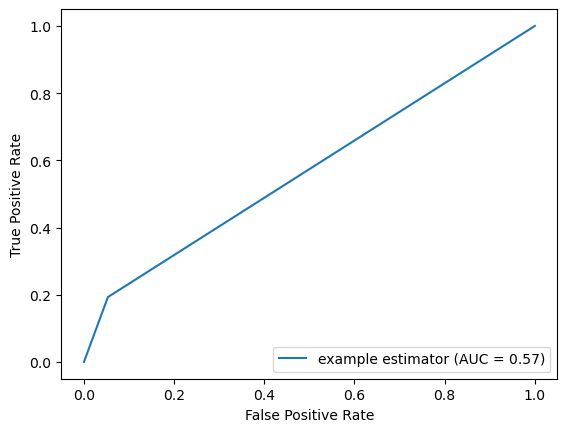

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.94    0.95      0.95    809.0
1                  0.20    0.19      0.20     57.0
accuracy           0.90    0.90      0.90      0.9
macro avg          0.57    0.57      0.57    866.0
weighted avg       0.89    0.90      0.90    866.0
None
Affichage de la matrice de confusion après optimisation


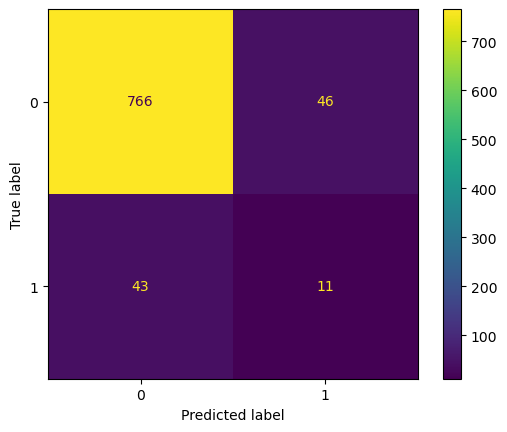

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.44
******* Best recall: 0.44
******* Best cost: 3925.20
******* Best precision score: 0.36
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM            0.9         0.19        503                   0.2   

   True Positives  True Negatives      sampling   standardisation  \
0              11             766  oversampling  StandardScaler()   

                                       Best para

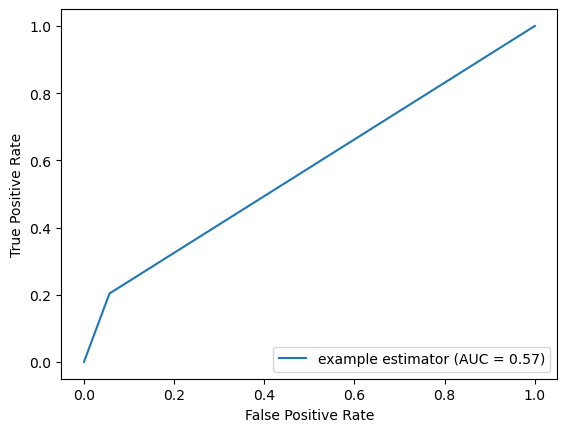

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.95      0.95    809.0
1                  0.20    0.19      0.20     57.0
accuracy           0.90    0.90      0.90      0.9
macro avg          0.57    0.57      0.57    866.0
weighted avg       0.89    0.90      0.90    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


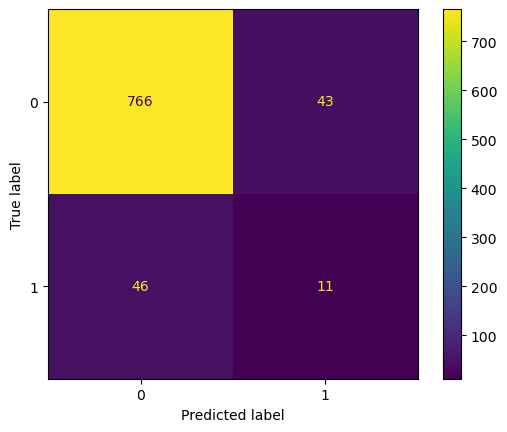

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.19
******* Best recall: 0.19
******* Best cost: 342.80
******* Best precision score: 0.16
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest            0.9         0.19        503                   0.2   

 

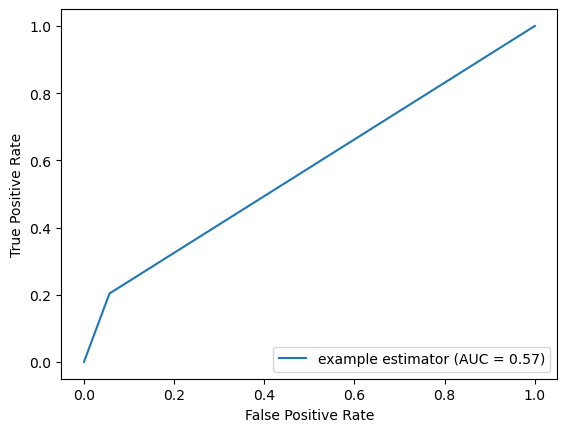

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.95      0.95    809.0
1                  0.20    0.19      0.20     57.0
accuracy           0.90    0.90      0.90      0.9
macro avg          0.57    0.57      0.57    866.0
weighted avg       0.89    0.90      0.90    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


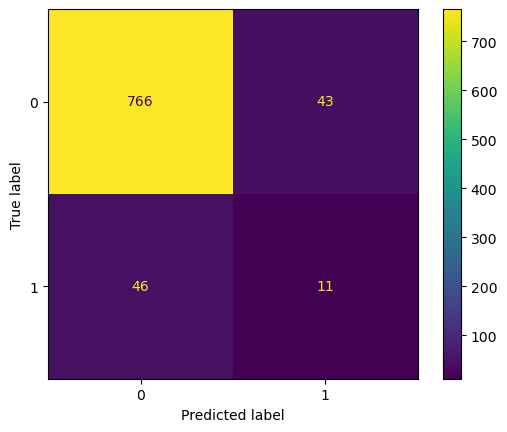

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.19103840682788048
Best recall:  0.19103840682788048
Best cost:  342.8
Best precision score:  0.16277895231383605
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression            0.9         0.19        503   

   Best precision Score  True Positives  True Negatives sampling  \
0                   0.2              11             766     None   

    standardisation                                         Best param  \
0  Sta

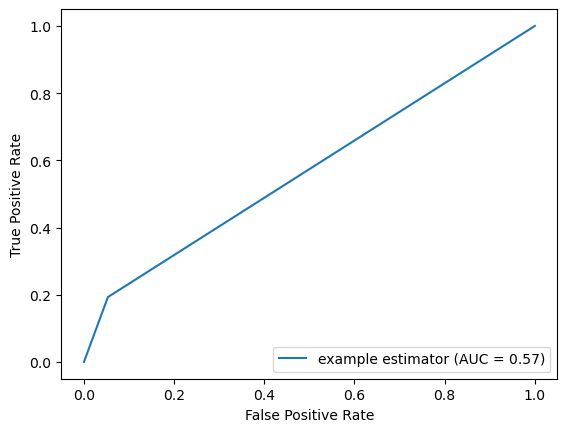

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.94    0.95      0.95    809.0
1                  0.20    0.19      0.20     57.0
accuracy           0.90    0.90      0.90      0.9
macro avg          0.57    0.57      0.57    866.0
weighted avg       0.89    0.90      0.90    866.0
None
Affichage de la matrice de confusion après optimisation


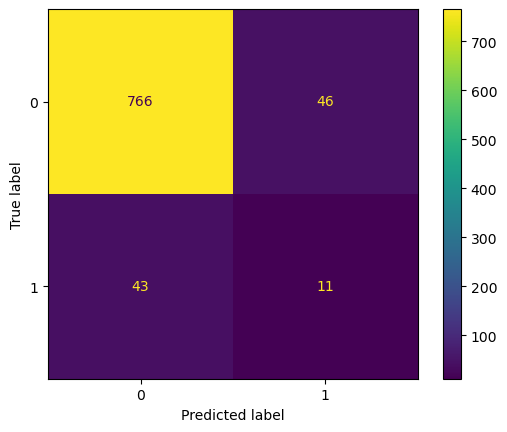

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.00
******* Best recall: 0.00
******* Best cost: 378.00
******* Best precision score: 0.00
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.93          0.0        570                   0.0   

   True Positives  True Negatives sampling   standardisation  \
0               0             809     None  StandardScaler()   

                                       Best param        fe

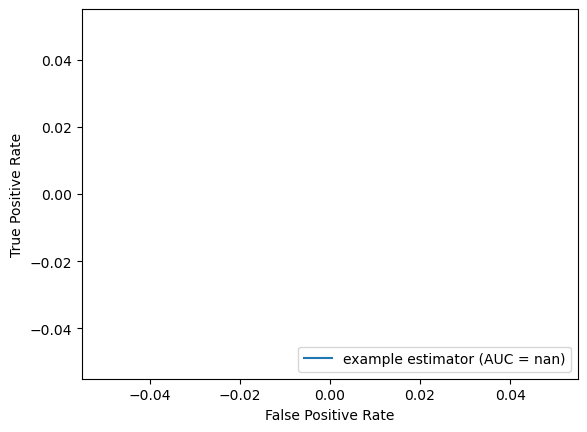

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.93    1.00      0.97   809.00
1                  0.00    0.00      0.00    57.00
accuracy           0.93    0.93      0.93     0.93
macro avg          0.47    0.50      0.48   866.00
weighted avg       0.87    0.93      0.90   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


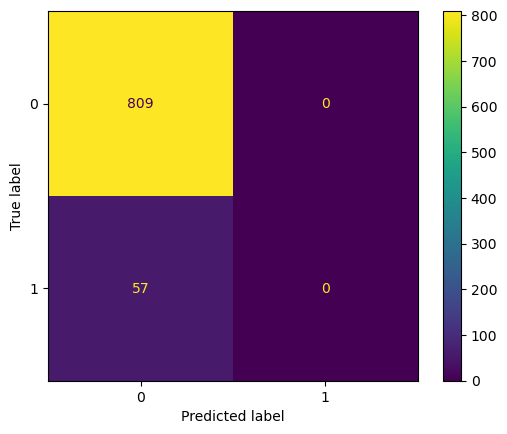

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.19
******* Best recall: 0.19
******* Best cost: 307.80
******* Best precision score: 0.82
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest            0.9         0.19        503                   0.2   

 

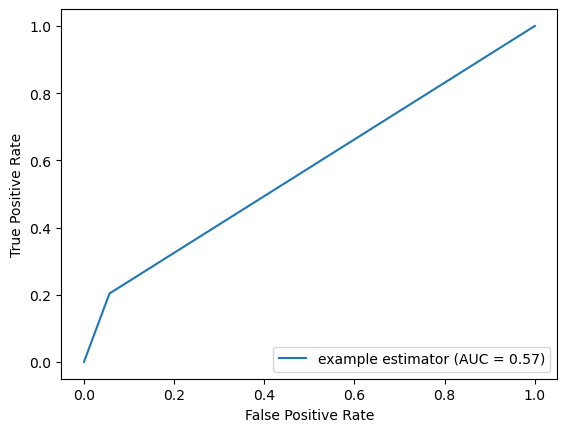

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.95      0.95    809.0
1                  0.20    0.19      0.20     57.0
accuracy           0.90    0.90      0.90      0.9
macro avg          0.57    0.57      0.57    866.0
weighted avg       0.89    0.90      0.90    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


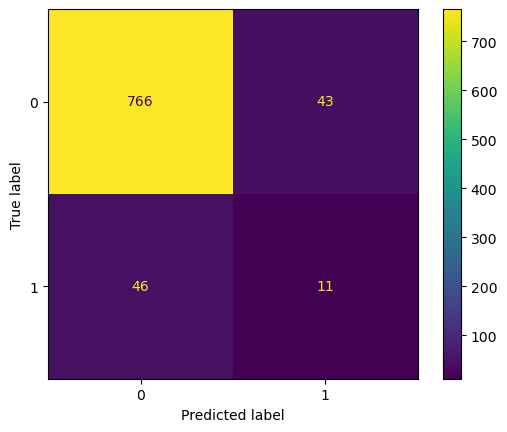

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': {0: 2.0, 1: 2.0}, 'penalty': 'l2'}
Best accuracy:  0.3684210526315789
Best recall:  0.3684210526315789
Best cost:  249.4
Best precision score:  0.7148571428571429
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression            0.9         0.19        503   

   Best precision Score  True Positives  True Negatives       sampling  \
0                   0.2              11             766  undersampling   

  standardisation                                         Best pa

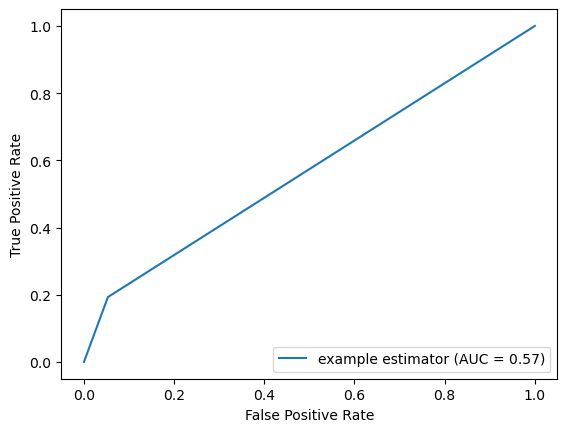

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.94    0.95      0.95    809.0
1                  0.20    0.19      0.20     57.0
accuracy           0.90    0.90      0.90      0.9
macro avg          0.57    0.57      0.57    866.0
weighted avg       0.89    0.90      0.90    866.0
None
Affichage de la matrice de confusion après optimisation


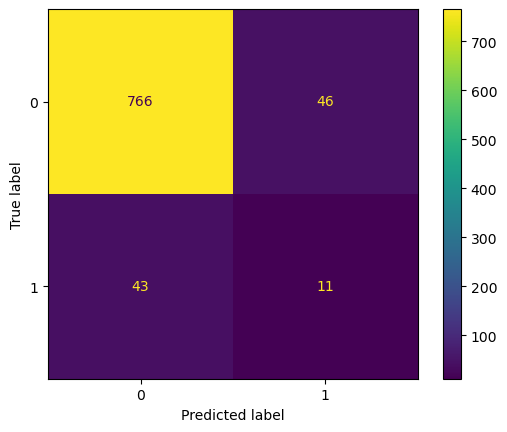

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.34
******* Best recall: 0.34
******* Best cost: 259.00
******* Best precision score: 0.57
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM            0.9         0.19        503                   0.2   

   True Positives  True Negatives       sampling standardisation  \
0              11             766  undersampling  RobustScaler()   

                                       Best param  

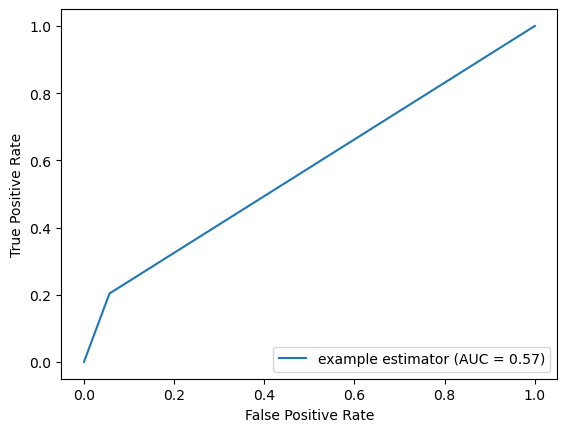

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.95      0.95    809.0
1                  0.20    0.19      0.20     57.0
accuracy           0.90    0.90      0.90      0.9
macro avg          0.57    0.57      0.57    866.0
weighted avg       0.89    0.90      0.90    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


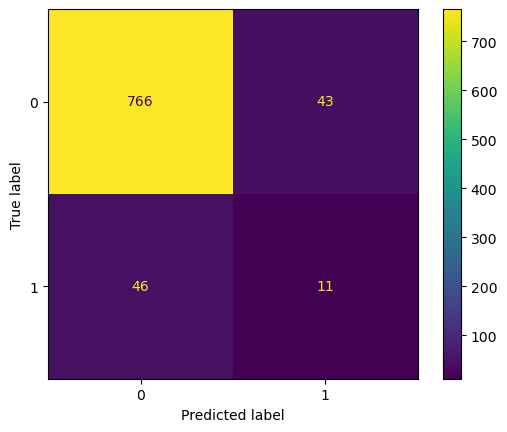

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.19
******* Best recall: 0.19
******* Best cost: 5308.80
******* Best precision score: 0.78
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest            0.9         0.19        503                   0.2   



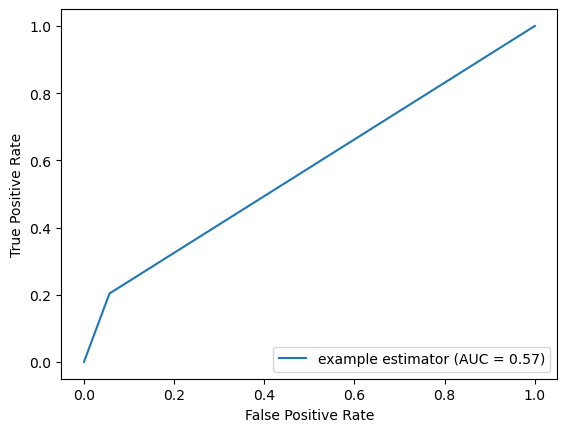

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.95      0.95    809.0
1                  0.20    0.19      0.20     57.0
accuracy           0.90    0.90      0.90      0.9
macro avg          0.57    0.57      0.57    866.0
weighted avg       0.89    0.90      0.90    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


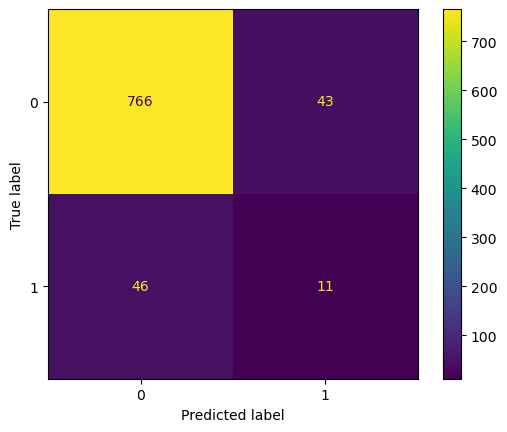

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.1946200714335738
Best recall:  0.1946200714335738
Best cost:  5308.8
Best precision score:  0.7753152483459378
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression            0.9         0.19        503   

   Best precision Score  True Positives  True Negatives      sampling  \
0                   0.2              11             766  oversampling   

  standardisation                                         Best param  \


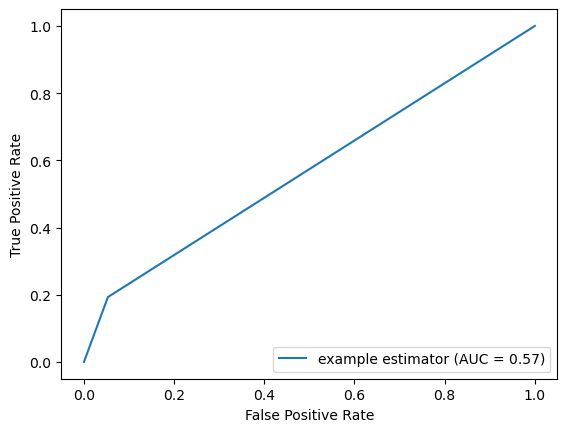

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.94    0.95      0.95    809.0
1                  0.20    0.19      0.20     57.0
accuracy           0.90    0.90      0.90      0.9
macro avg          0.57    0.57      0.57    866.0
weighted avg       0.89    0.90      0.90    866.0
None
Affichage de la matrice de confusion après optimisation


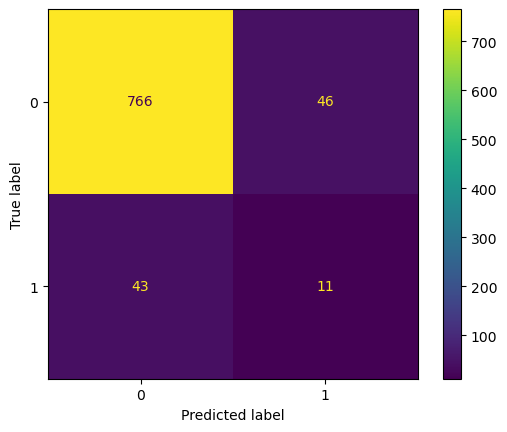

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.44
******* Best recall: 0.44
******* Best cost: 3953.20
******* Best precision score: 0.35
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM            0.9         0.19        503                   0.2   

   True Positives  True Negatives      sampling standardisation  \
0              11             766  oversampling  RobustScaler()   

                                       Best param   

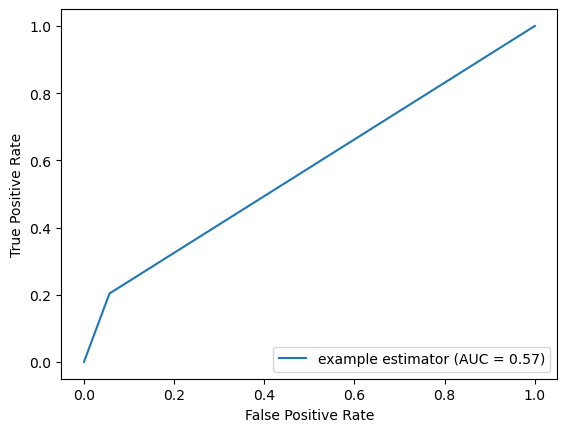

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.95      0.95    809.0
1                  0.20    0.19      0.20     57.0
accuracy           0.90    0.90      0.90      0.9
macro avg          0.57    0.57      0.57    866.0
weighted avg       0.89    0.90      0.90    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


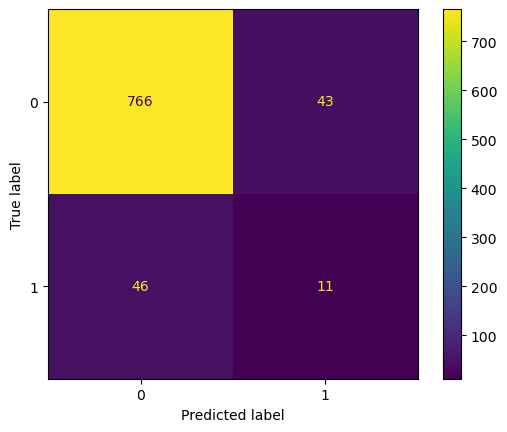

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.19
******* Best recall: 0.19
******* Best cost: 342.80
******* Best precision score: 0.16
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest            0.9         0.19        503                   0.2   

 

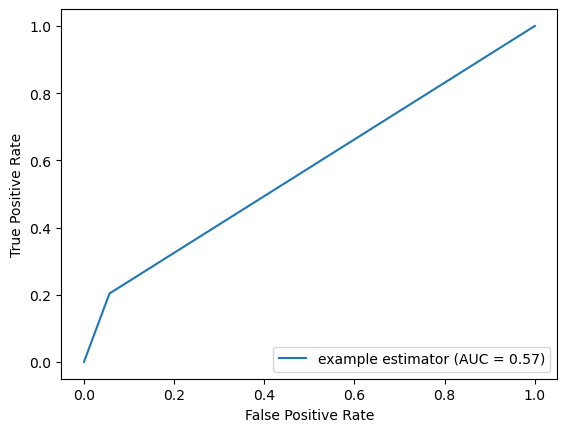

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.95      0.95    809.0
1                  0.20    0.19      0.20     57.0
accuracy           0.90    0.90      0.90      0.9
macro avg          0.57    0.57      0.57    866.0
weighted avg       0.89    0.90      0.90    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


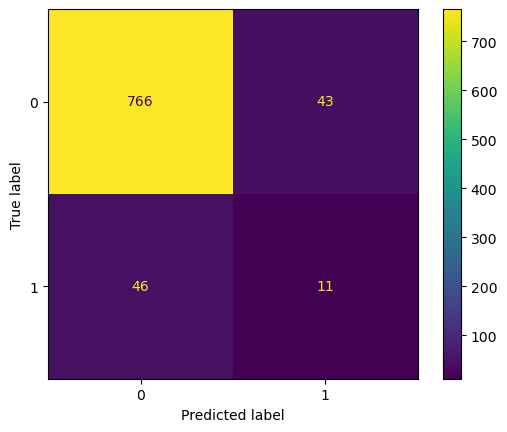

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.19103840682788048
Best recall:  0.19103840682788048
Best cost:  342.8
Best precision score:  0.16277895231383605
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression            0.9         0.19        503   

   Best precision Score  True Positives  True Negatives sampling  \
0                   0.2              11             766     None   

  standardisation                                         Best param  \
0  Robus

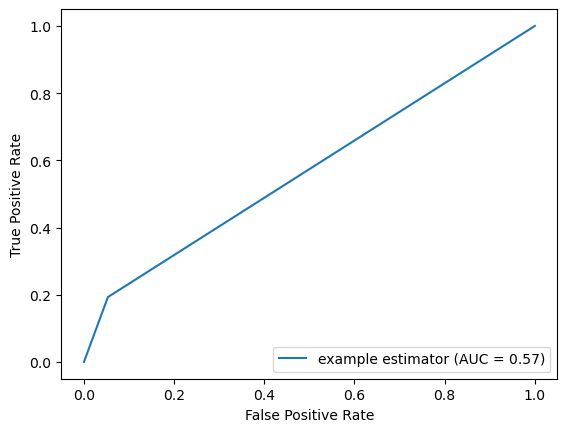

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.94    0.95      0.95    809.0
1                  0.20    0.19      0.20     57.0
accuracy           0.90    0.90      0.90      0.9
macro avg          0.57    0.57      0.57    866.0
weighted avg       0.89    0.90      0.90    866.0
None
Affichage de la matrice de confusion après optimisation


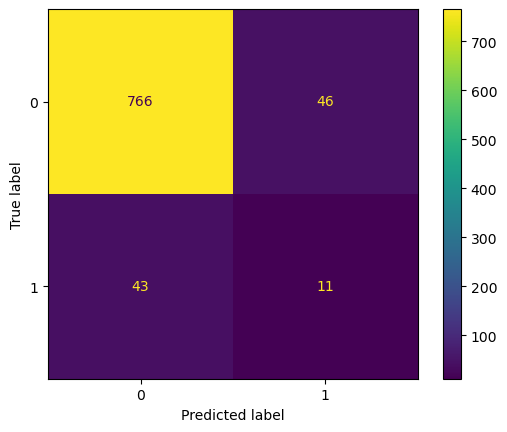

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.00
******* Best recall: 0.00
******* Best cost: 378.00
******* Best precision score: 0.00
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.93          0.0        570                   0.0   

   True Positives  True Negatives sampling standardisation  \
0               0             809     None  RobustScaler()   

                                       Best param        featur

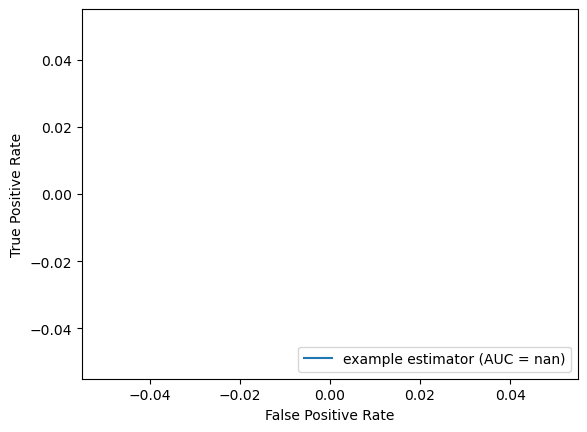

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.93    1.00      0.97   809.00
1                  0.00    0.00      0.00    57.00
accuracy           0.93    0.93      0.93     0.93
macro avg          0.47    0.50      0.48   866.00
weighted avg       0.87    0.93      0.90   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


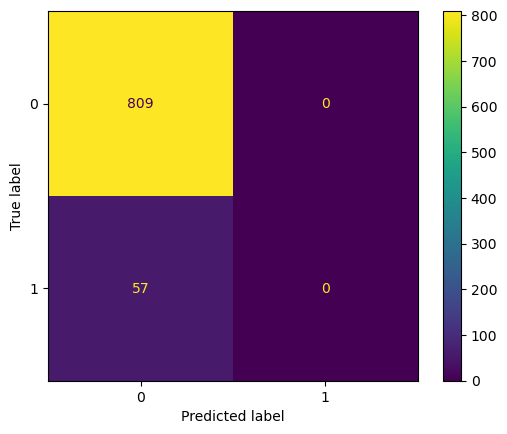

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.89
******* Best recall: 0.89
******* Best cost: 70.60
******* Best precision score: 0.54
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.31         0.89        654                  0.08   

  

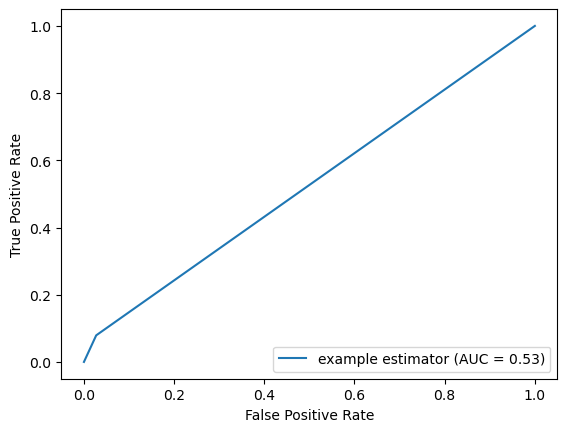

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.97    0.27      0.42   809.00
1                  0.08    0.89      0.15    57.00
accuracy           0.31    0.31      0.31     0.31
macro avg          0.53    0.58      0.28   866.00
weighted avg       0.91    0.31      0.40   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


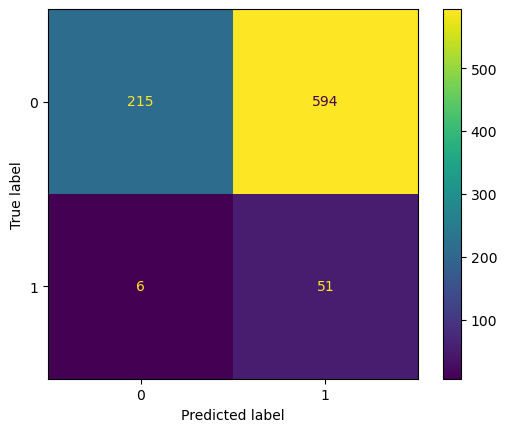

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.8887624466571834
Best recall:  0.8887624466571834
Best cost:  70.6
Best precision score:  0.540079803855584
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.31         0.89        654   

   Best precision Score  True Positives  True Negatives       sampling  \
0                  0.08              51             215  undersampling   

    standardisation                                         Best param  \

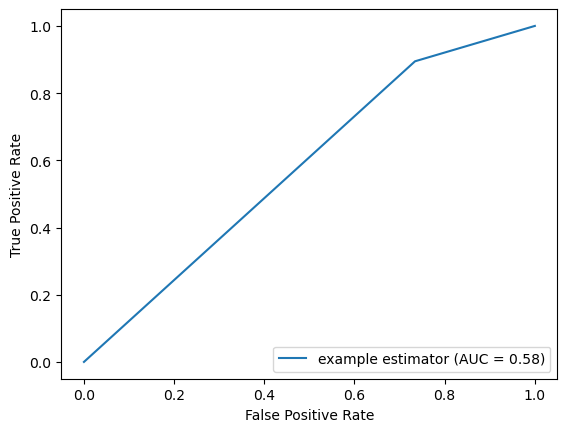

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.97    0.27      0.42   809.00
1                  0.08    0.89      0.15    57.00
accuracy           0.31    0.31      0.31     0.31
macro avg          0.53    0.58      0.28   866.00
weighted avg       0.91    0.31      0.40   866.00
None
Affichage de la matrice de confusion après optimisation


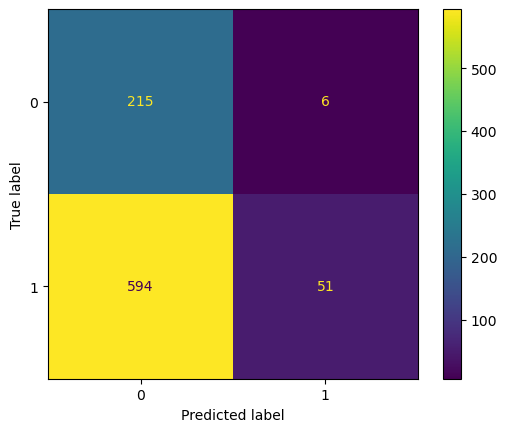

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.1, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.89
******* Best recall: 0.89
******* Best cost: 70.60
******* Best precision score: 0.54
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.31         0.89        654                  0.08   

   True Positives  True Negatives       sampling   standardisation  \
0              51             215  undersampling  StandardScaler()   

                                     Best param   

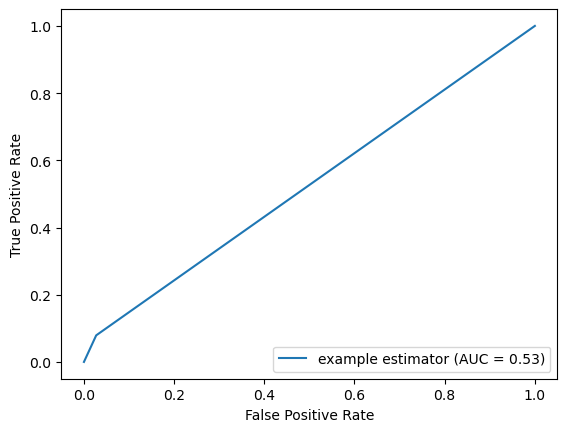

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.97    0.27      0.42   809.00
1                  0.08    0.89      0.15    57.00
accuracy           0.31    0.31      0.31     0.31
macro avg          0.53    0.58      0.28   866.00
weighted avg       0.91    0.31      0.40   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


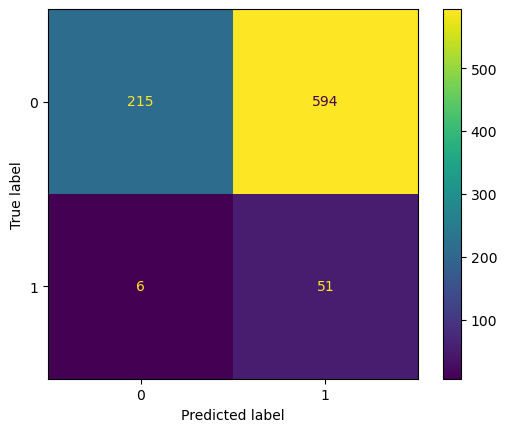

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.90
******* Best recall: 0.90
******* Best cost: 1181.20
******* Best precision score: 0.54
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.31         0.89        654                  0.08   



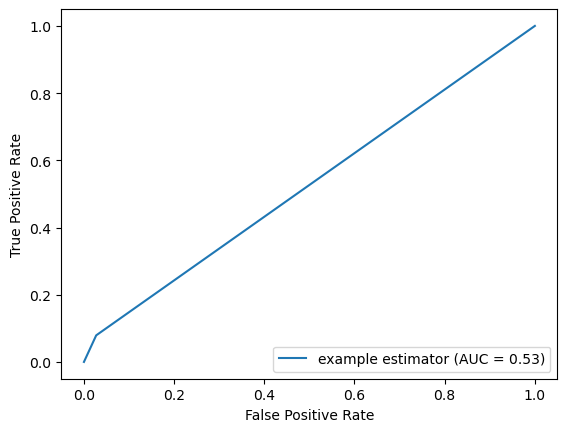

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.97    0.27      0.42   809.00
1                  0.08    0.89      0.15    57.00
accuracy           0.31    0.31      0.31     0.31
macro avg          0.53    0.58      0.28   866.00
weighted avg       0.91    0.31      0.40   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


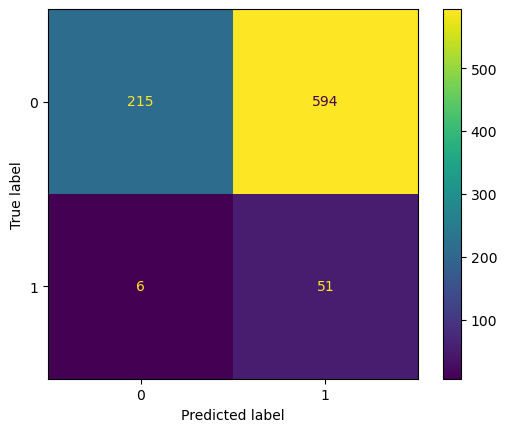

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.8951962088848425
Best recall:  0.8951962088848425
Best cost:  1181.2
Best precision score:  0.5419854753373495
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.31         0.89        654   

   Best precision Score  True Positives  True Negatives      sampling  \
0                  0.08              51             215  oversampling   

    standardisation                                         Best param  

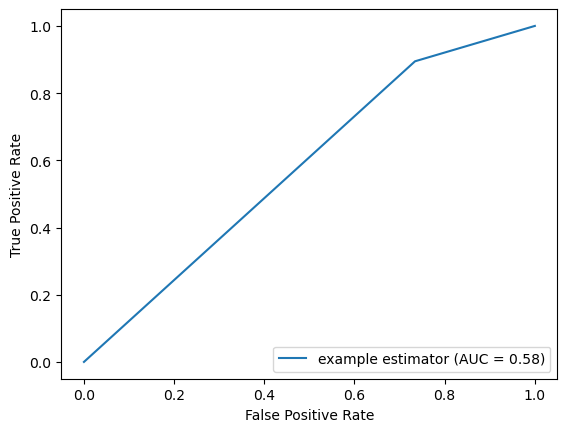

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.97    0.27      0.42   809.00
1                  0.08    0.89      0.15    57.00
accuracy           0.31    0.31      0.31     0.31
macro avg          0.53    0.58      0.28   866.00
weighted avg       0.91    0.31      0.40   866.00
None
Affichage de la matrice de confusion après optimisation


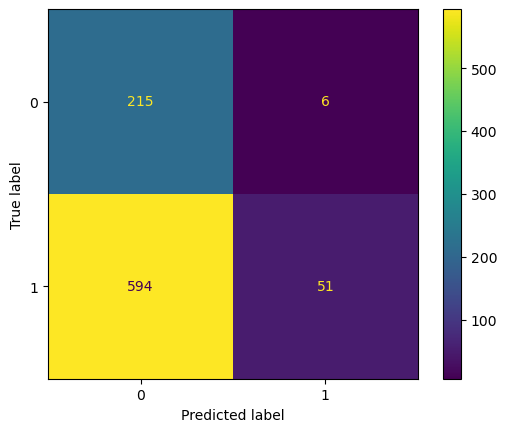

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.01, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.90
******* Best recall: 0.90
******* Best cost: 1181.20
******* Best precision score: 0.54
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.31         0.89        654                  0.08   

   True Positives  True Negatives      sampling   standardisation  \
0              51             215  oversampling  StandardScaler()   

                                      Best param 

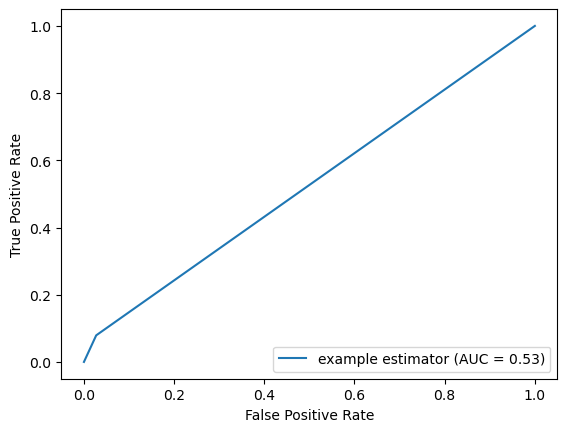

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.97    0.27      0.42   809.00
1                  0.08    0.89      0.15    57.00
accuracy           0.31    0.31      0.31     0.31
macro avg          0.53    0.58      0.28   866.00
weighted avg       0.91    0.31      0.40   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


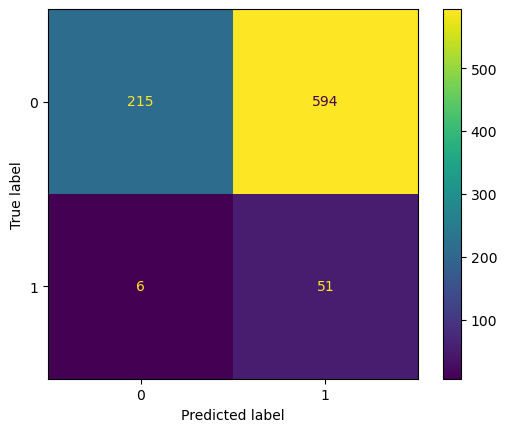

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.89
******* Best recall: 0.89
******* Best cost: 537.20
******* Best precision score: 0.06
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.31         0.89        654                  0.08   

 

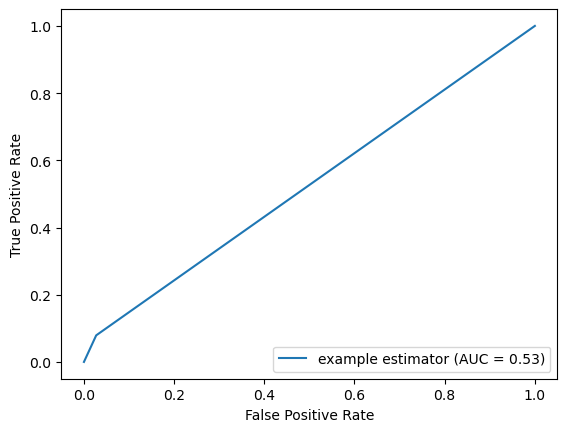

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.97    0.27      0.42   809.00
1                  0.08    0.89      0.15    57.00
accuracy           0.31    0.31      0.31     0.31
macro avg          0.53    0.58      0.28   866.00
weighted avg       0.91    0.31      0.40   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


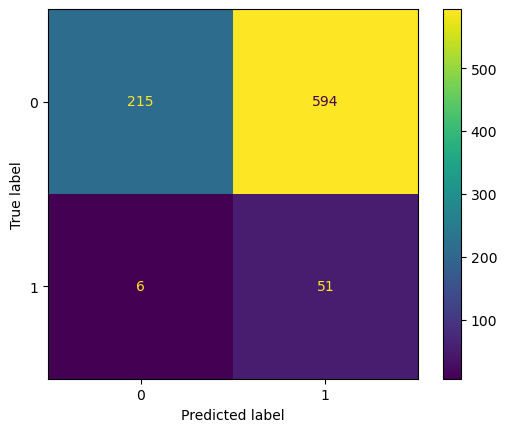

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.8886201991465148
Best recall:  0.8886201991465148
Best cost:  537.2
Best precision score:  0.06351635017832913
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.31         0.89        654   

   Best precision Score  True Positives  True Negatives sampling  \
0                  0.08              51             215     None   

    standardisation                                         Best param  \
0  Stand

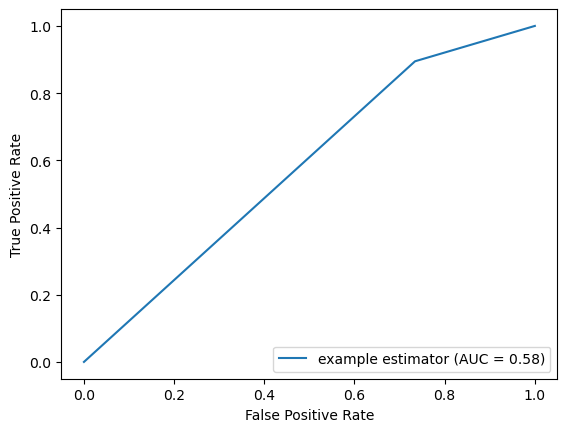

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.97    0.27      0.42   809.00
1                  0.08    0.89      0.15    57.00
accuracy           0.31    0.31      0.31     0.31
macro avg          0.53    0.58      0.28   866.00
weighted avg       0.91    0.31      0.40   866.00
None
Affichage de la matrice de confusion après optimisation


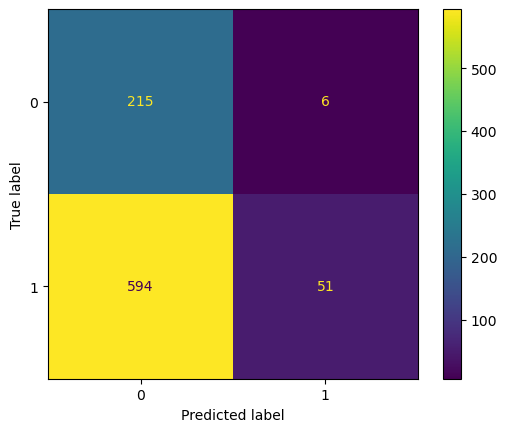

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.00
******* Best recall: 0.00
******* Best cost: 378.00
******* Best precision score: 0.00
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.93          0.0        570                   0.0   

   True Positives  True Negatives sampling   standardisation  \
0               0             809     None  StandardScaler()   

                                       Best param       fea

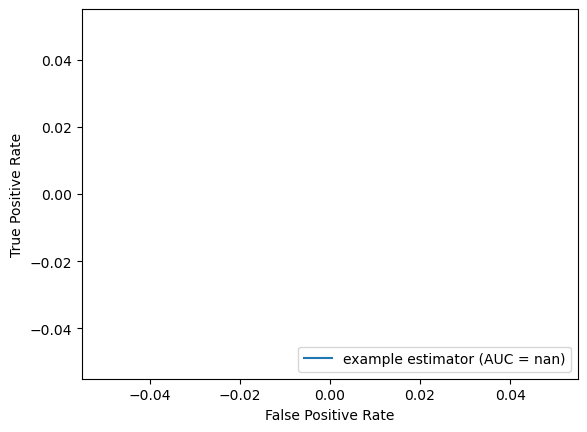

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.93    1.00      0.97   809.00
1                  0.00    0.00      0.00    57.00
accuracy           0.93    0.93      0.93     0.93
macro avg          0.47    0.50      0.48   866.00
weighted avg       0.87    0.93      0.90   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


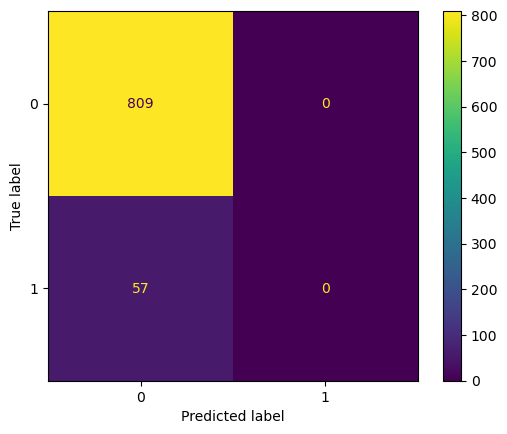

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.89
******* Best recall: 0.89
******* Best cost: 71.60
******* Best precision score: 0.53
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.31         0.89        654                  0.08   

  

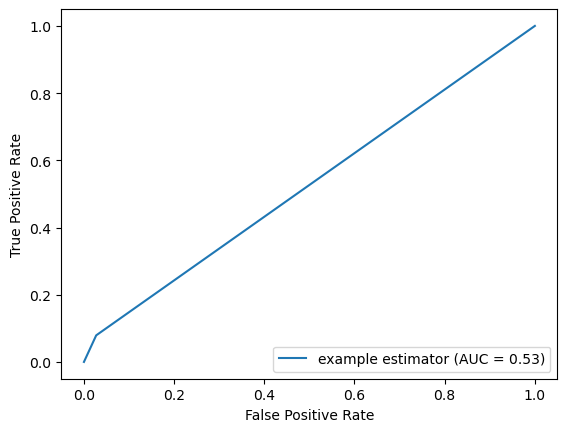

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.97    0.27      0.42   809.00
1                  0.08    0.89      0.15    57.00
accuracy           0.31    0.31      0.31     0.31
macro avg          0.53    0.58      0.28   866.00
weighted avg       0.91    0.31      0.40   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


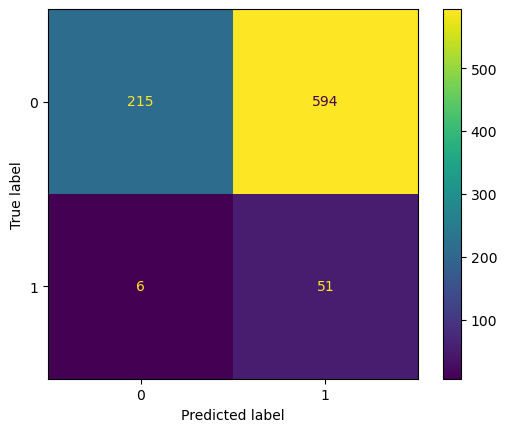

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.8887624466571834
Best recall:  0.8887624466571834
Best cost:  71.6
Best precision score:  0.5314649625596215
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.31         0.89        654   

   Best precision Score  True Positives  True Negatives       sampling  \
0                  0.08              51             215  undersampling   

  standardisation                                         Best param  \


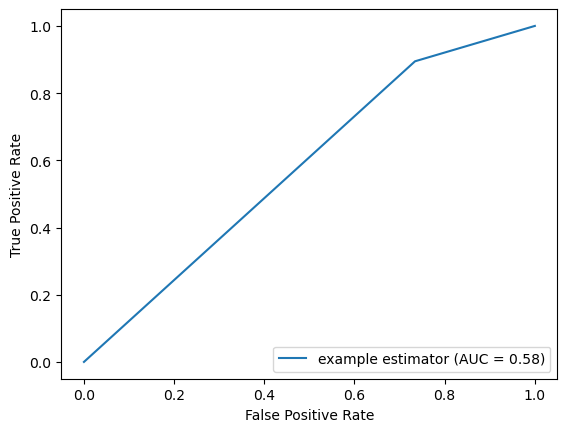

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.97    0.27      0.42   809.00
1                  0.08    0.89      0.15    57.00
accuracy           0.31    0.31      0.31     0.31
macro avg          0.53    0.58      0.28   866.00
weighted avg       0.91    0.31      0.40   866.00
None
Affichage de la matrice de confusion après optimisation


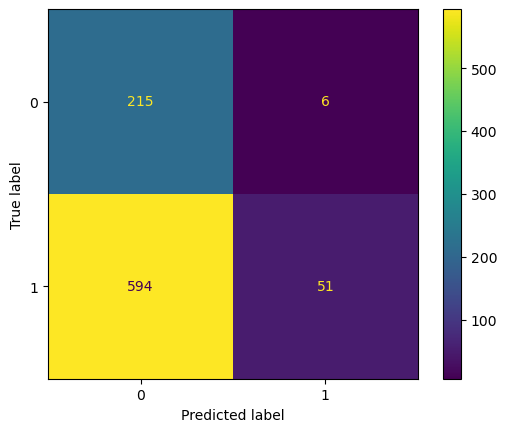

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.1, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.89
******* Best recall: 0.89
******* Best cost: 71.60
******* Best precision score: 0.53
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.31         0.89        654                  0.08   

   True Positives  True Negatives       sampling standardisation  \
0              51             215  undersampling  RobustScaler()   

                                     Best param       

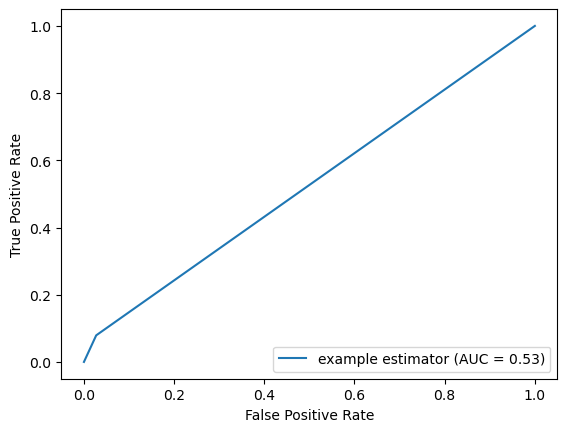

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.97    0.27      0.42   809.00
1                  0.08    0.89      0.15    57.00
accuracy           0.31    0.31      0.31     0.31
macro avg          0.53    0.58      0.28   866.00
weighted avg       0.91    0.31      0.40   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


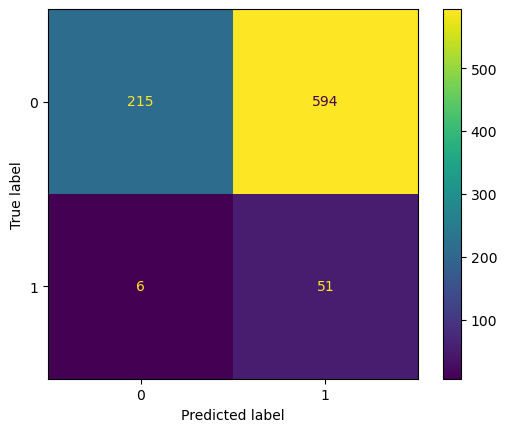

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.90
******* Best recall: 0.90
******* Best cost: 1175.20
******* Best precision score: 0.54
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.31         0.89        654                  0.08   



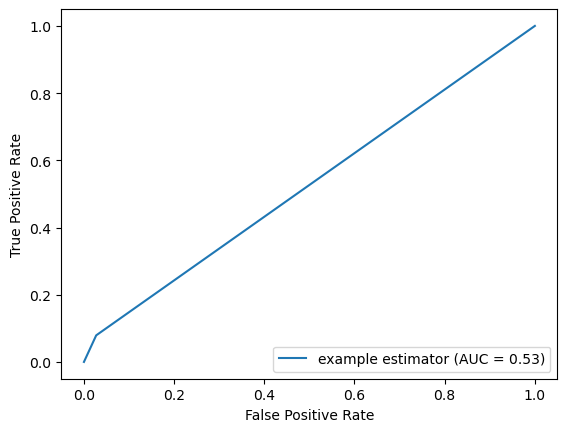

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.97    0.27      0.42   809.00
1                  0.08    0.89      0.15    57.00
accuracy           0.31    0.31      0.31     0.31
macro avg          0.53    0.58      0.28   866.00
weighted avg       0.91    0.31      0.40   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


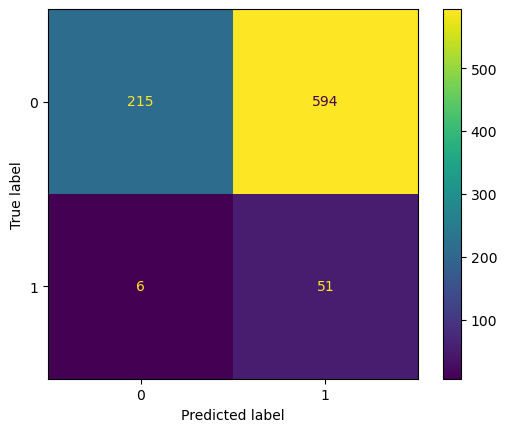

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.8961197095968437
Best recall:  0.8961197095968437
Best cost:  1175.2
Best precision score:  0.5422356875941022
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.31         0.89        654   

   Best precision Score  True Positives  True Negatives      sampling  \
0                  0.08              51             215  oversampling   

  standardisation                                         Best param  \


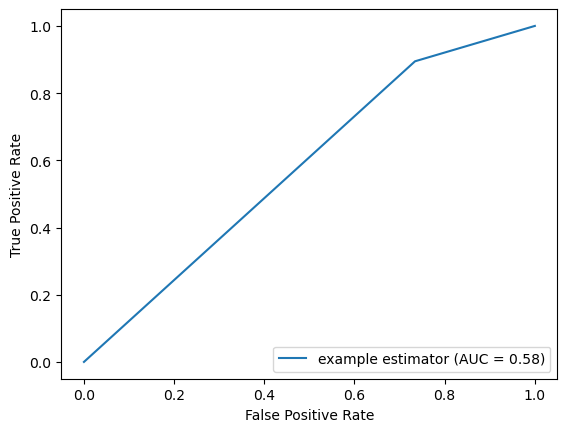

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.97    0.27      0.42   809.00
1                  0.08    0.89      0.15    57.00
accuracy           0.31    0.31      0.31     0.31
macro avg          0.53    0.58      0.28   866.00
weighted avg       0.91    0.31      0.40   866.00
None
Affichage de la matrice de confusion après optimisation


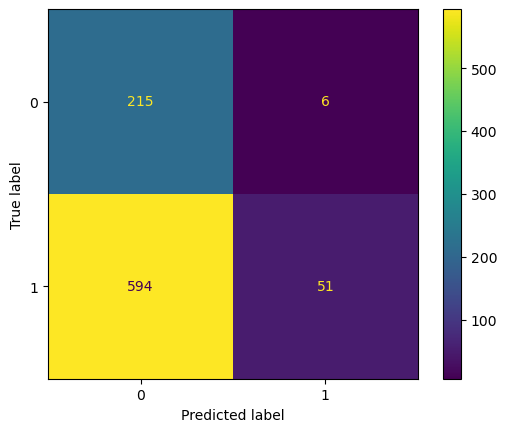

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.01, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.90
******* Best recall: 0.90
******* Best cost: 1175.20
******* Best precision score: 0.54
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.31         0.89        654                  0.08   

   True Positives  True Negatives      sampling standardisation  \
0              51             215  oversampling  RobustScaler()   

                                      Best param     

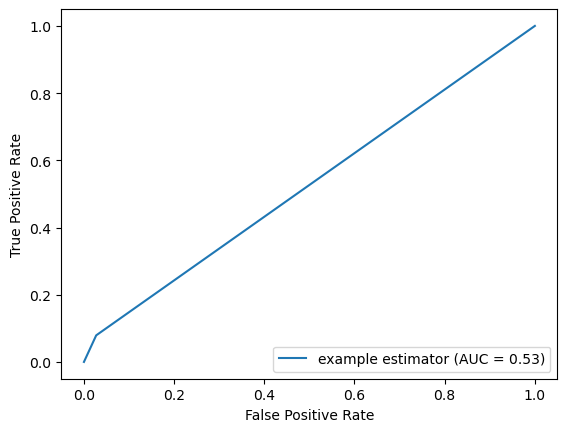

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.97    0.27      0.42   809.00
1                  0.08    0.89      0.15    57.00
accuracy           0.31    0.31      0.31     0.31
macro avg          0.53    0.58      0.28   866.00
weighted avg       0.91    0.31      0.40   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


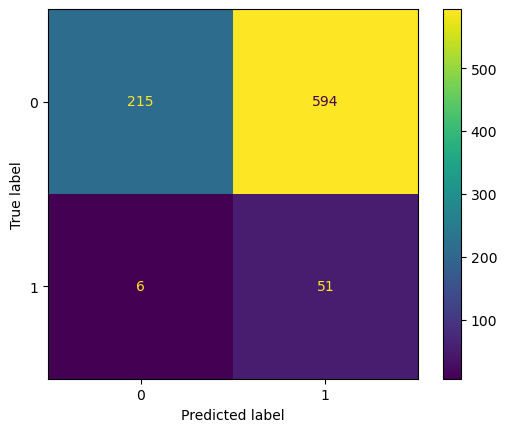

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.89
******* Best recall: 0.89
******* Best cost: 537.20
******* Best precision score: 0.06
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.31         0.89        654                  0.08   

 

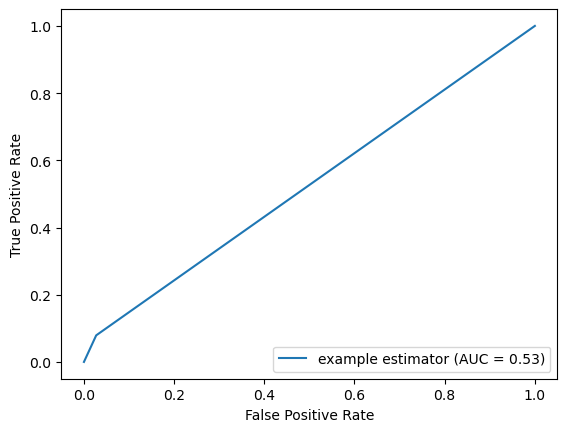

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.97    0.27      0.42   809.00
1                  0.08    0.89      0.15    57.00
accuracy           0.31    0.31      0.31     0.31
macro avg          0.53    0.58      0.28   866.00
weighted avg       0.91    0.31      0.40   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


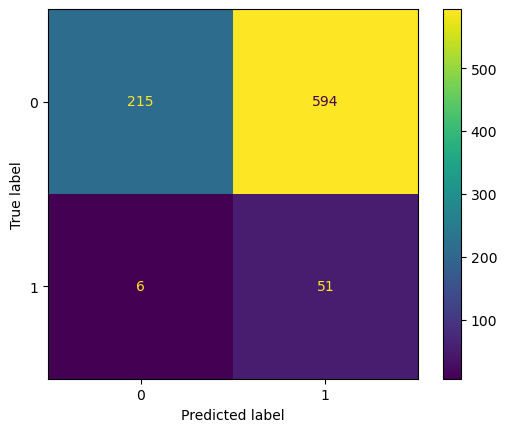

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.8886201991465148
Best recall:  0.8886201991465148
Best cost:  537.2
Best precision score:  0.06351635017832913
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.31         0.89        654   

   Best precision Score  True Positives  True Negatives sampling  \
0                  0.08              51             215     None   

  standardisation                                         Best param  \
0  RobustS

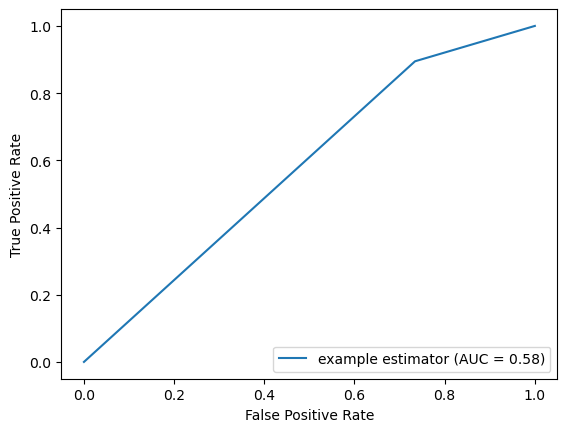

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.97    0.27      0.42   809.00
1                  0.08    0.89      0.15    57.00
accuracy           0.31    0.31      0.31     0.31
macro avg          0.53    0.58      0.28   866.00
weighted avg       0.91    0.31      0.40   866.00
None
Affichage de la matrice de confusion après optimisation


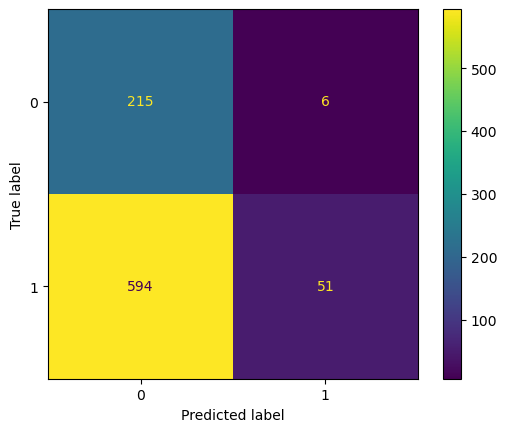

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.00
******* Best recall: 0.00
******* Best cost: 378.00
******* Best precision score: 0.00
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.93          0.0        570                   0.0   

   True Positives  True Negatives sampling standardisation  \
0               0             809     None  RobustScaler()   

                                       Best param       feature

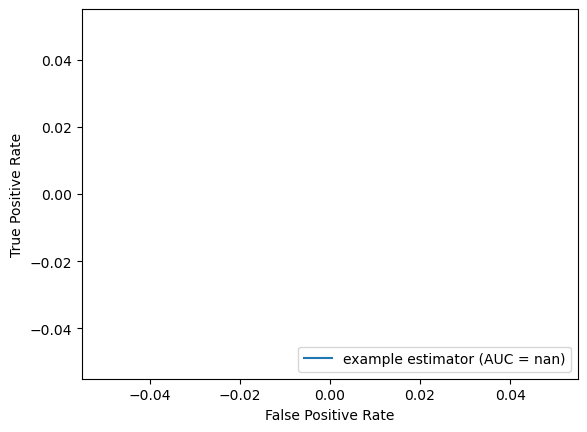

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.93    1.00      0.97   809.00
1                  0.00    0.00      0.00    57.00
accuracy           0.93    0.93      0.93     0.93
macro avg          0.47    0.50      0.48   866.00
weighted avg       0.87    0.93      0.90   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


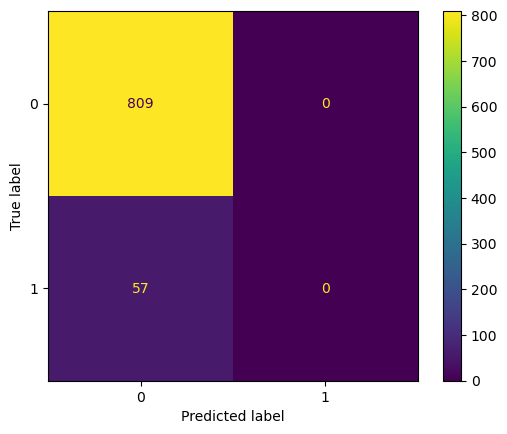

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.26
******* Best recall: 0.26
******* Best cost: 284.20
******* Best precision score: 0.63
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.79         0.26        557                   0.1   

 

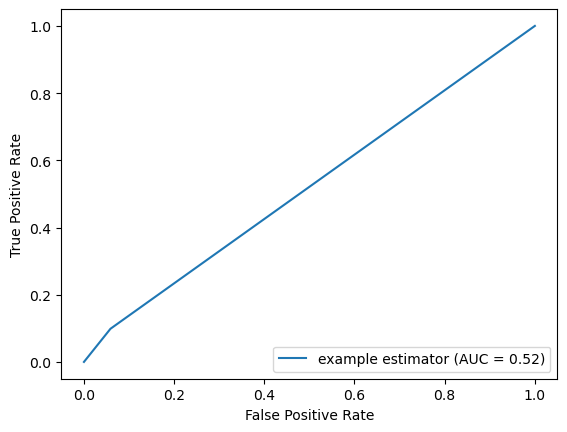

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.83      0.88   809.00
1                  0.10    0.26      0.14    57.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.52    0.55      0.51   866.00
weighted avg       0.89    0.79      0.83   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


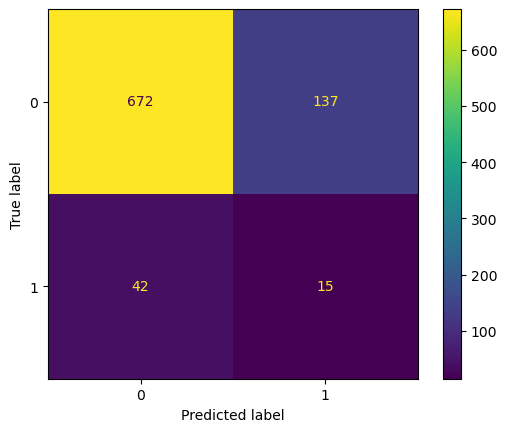

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': {0: 2.0, 1: 2.0}, 'penalty': 'l2'}
Best accuracy:  0.41052631578947363
Best recall:  0.41052631578947363
Best cost:  237.0
Best precision score:  0.5808576300085251
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.79         0.26        557   

   Best precision Score  True Positives  True Negatives       sampling  \
0                   0.1              15             672  undersampling   

    standardisation                                         Bes

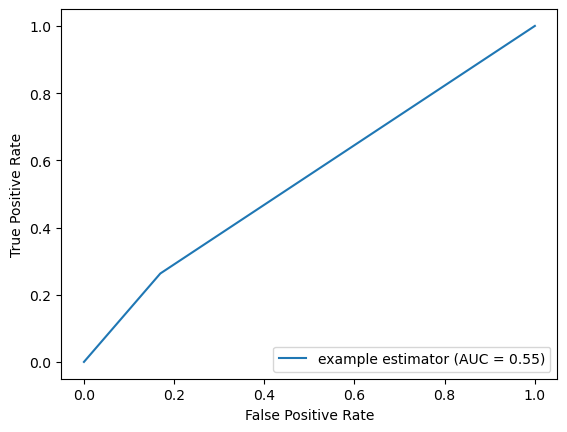

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.94    0.83      0.88   809.00
1                  0.10    0.26      0.14    57.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.52    0.55      0.51   866.00
weighted avg       0.89    0.79      0.83   866.00
None
Affichage de la matrice de confusion après optimisation


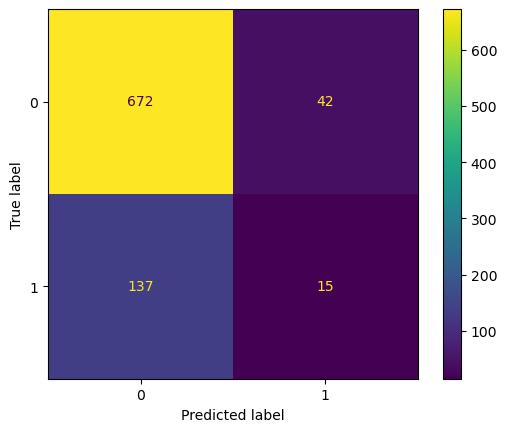

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.37
******* Best recall: 0.37
******* Best cost: 250.00
******* Best precision score: 0.46
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.79         0.26        557                   0.1   

   True Positives  True Negatives       sampling   standardisation  \
0              15             672  undersampling  StandardScaler()   

                                       Best par

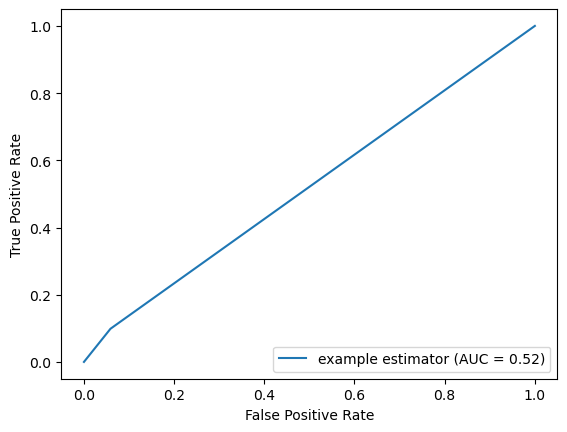

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.83      0.88   809.00
1                  0.10    0.26      0.14    57.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.52    0.55      0.51   866.00
weighted avg       0.89    0.79      0.83   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


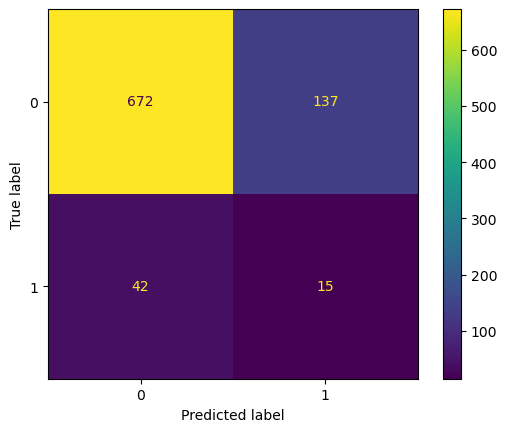

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.27
******* Best recall: 0.27
******* Best cost: 4893.00
******* Best precision score: 0.59
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.79         0.26        557                   0.1   



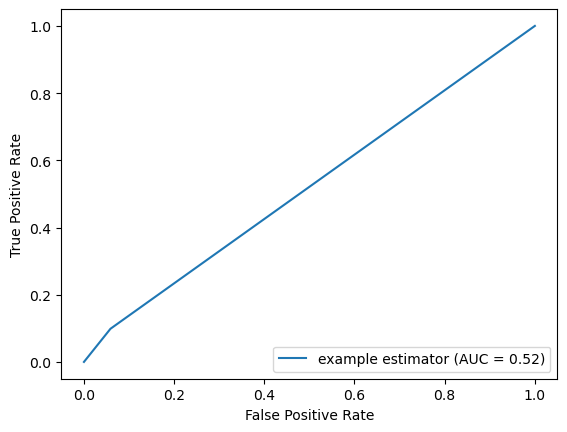

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.83      0.88   809.00
1                  0.10    0.26      0.14    57.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.52    0.55      0.51   866.00
weighted avg       0.89    0.79      0.83   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


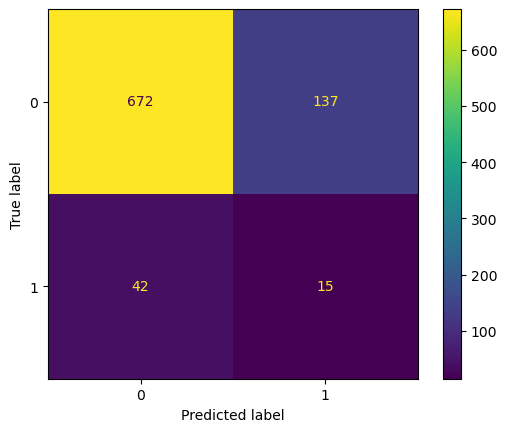

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.2710175782617831
Best recall:  0.2710175782617831
Best cost:  4893.0
Best precision score:  0.5946252758334543
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.79         0.26        557   

   Best precision Score  True Positives  True Negatives      sampling  \
0                   0.1              15             672  oversampling   

    standardisation                                         Best param  

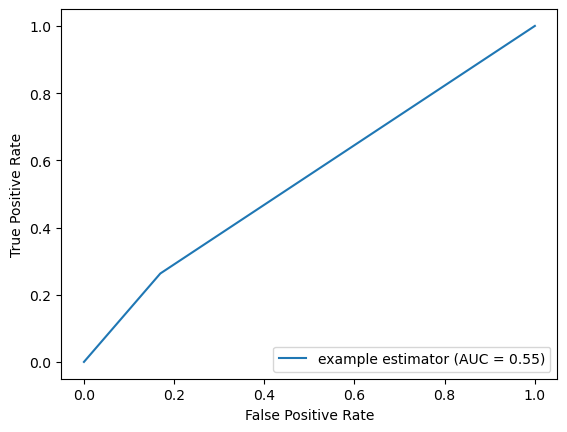

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.94    0.83      0.88   809.00
1                  0.10    0.26      0.14    57.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.52    0.55      0.51   866.00
weighted avg       0.89    0.79      0.83   866.00
None
Affichage de la matrice de confusion après optimisation


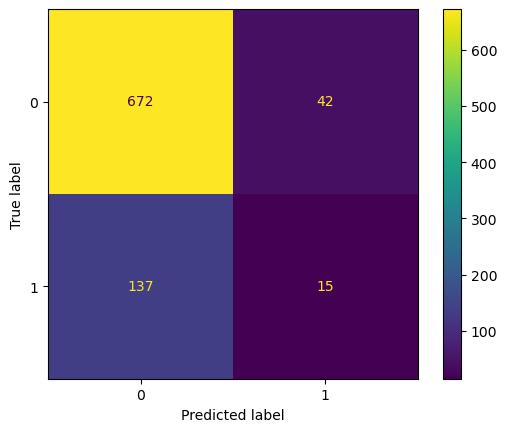

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.45
******* Best recall: 0.45
******* Best cost: 3872.80
******* Best precision score: 0.32
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.79         0.26        557                   0.1   

   True Positives  True Negatives      sampling   standardisation  \
0              15             672  oversampling  StandardScaler()   

                                       Best para

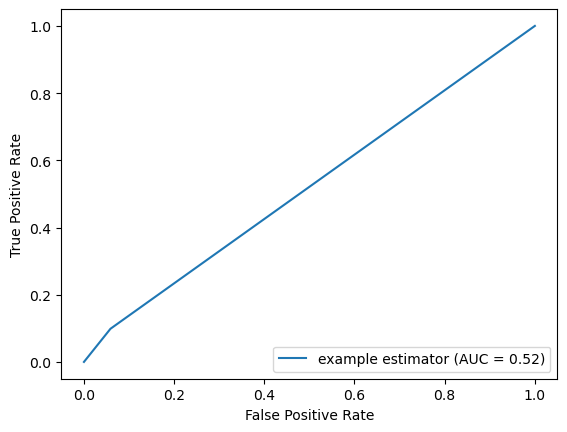

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.83      0.88   809.00
1                  0.10    0.26      0.14    57.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.52    0.55      0.51   866.00
weighted avg       0.89    0.79      0.83   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


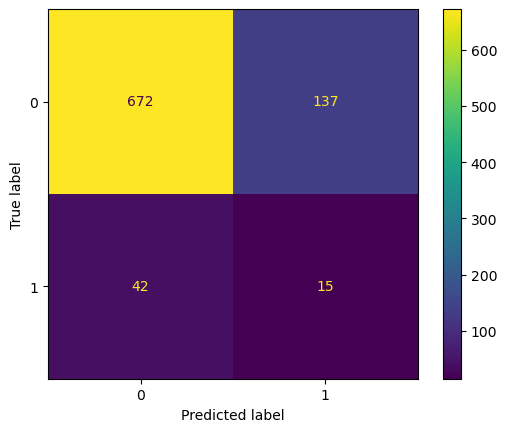

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.26
******* Best recall: 0.26
******* Best cost: 399.00
******* Best precision score: 0.08
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.79         0.26        557                   0.1   

 

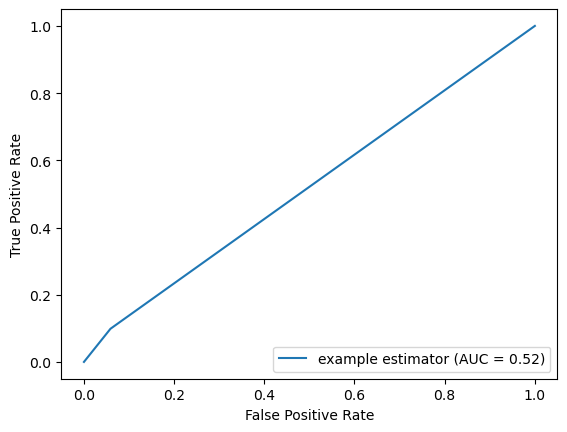

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.83      0.88   809.00
1                  0.10    0.26      0.14    57.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.52    0.55      0.51   866.00
weighted avg       0.89    0.79      0.83   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


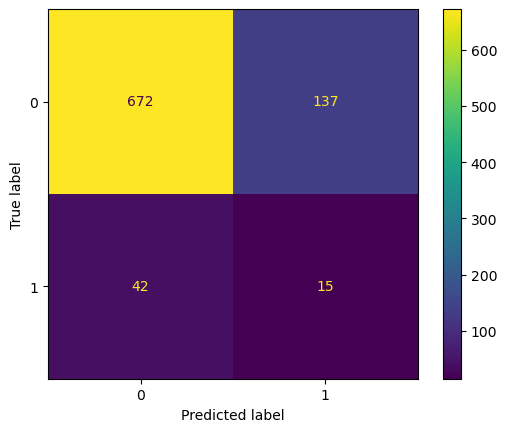

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.2648648648648648
Best recall:  0.2648648648648648
Best cost:  399.0
Best precision score:  0.0761231897386847
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.79         0.26        557   

   Best precision Score  True Positives  True Negatives sampling  \
0                   0.1              15             672     None   

    standardisation                                         Best param  \
0  Standa

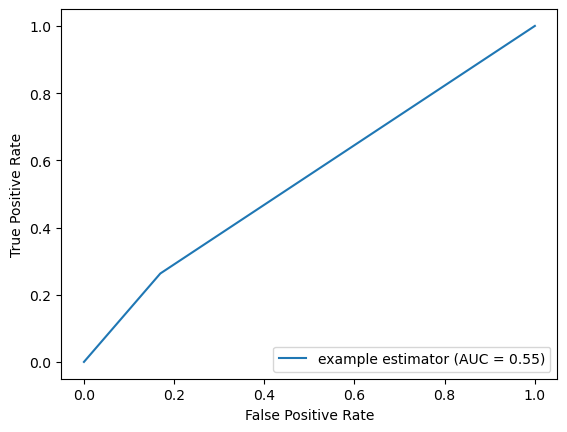

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.94    0.83      0.88   809.00
1                  0.10    0.26      0.14    57.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.52    0.55      0.51   866.00
weighted avg       0.89    0.79      0.83   866.00
None
Affichage de la matrice de confusion après optimisation


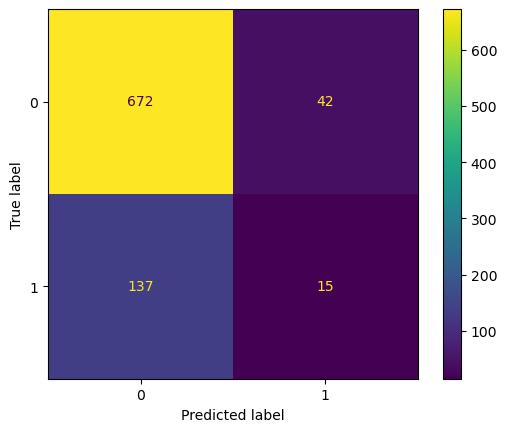

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.00
******* Best recall: 0.00
******* Best cost: 378.00
******* Best precision score: 0.00
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.93          0.0        570                   0.0   

   True Positives  True Negatives sampling   standardisation  \
0               0             809     None  StandardScaler()   

                                       Best param    featur

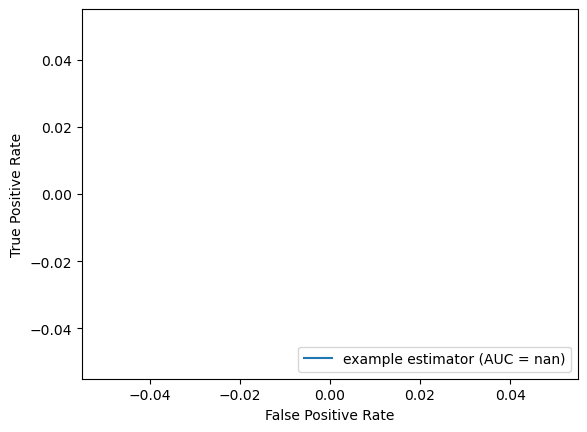

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.93    1.00      0.97   809.00
1                  0.00    0.00      0.00    57.00
accuracy           0.93    0.93      0.93     0.93
macro avg          0.47    0.50      0.48   866.00
weighted avg       0.87    0.93      0.90   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


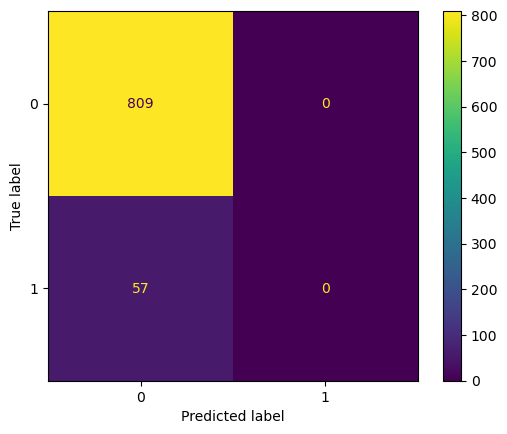

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.26
******* Best recall: 0.26
******* Best cost: 282.80
******* Best precision score: 0.70
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.79         0.26        557                   0.1   

 

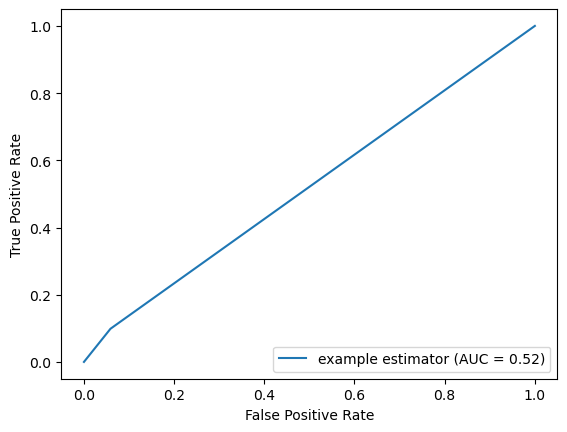

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.83      0.88   809.00
1                  0.10    0.26      0.14    57.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.52    0.55      0.51   866.00
weighted avg       0.89    0.79      0.83   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


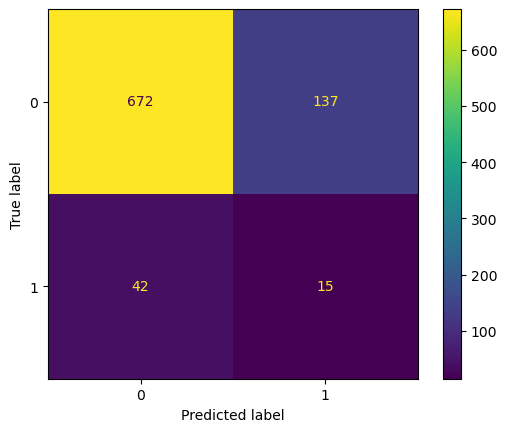

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': {0: 2.0, 1: 2.0}, 'penalty': 'l2'}
Best accuracy:  0.41052631578947363
Best recall:  0.41052631578947363
Best cost:  234.4
Best precision score:  0.6953986928104575
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.79         0.26        557   

   Best precision Score  True Positives  True Negatives       sampling  \
0                   0.1              15             672  undersampling   

  standardisation                                         Best 

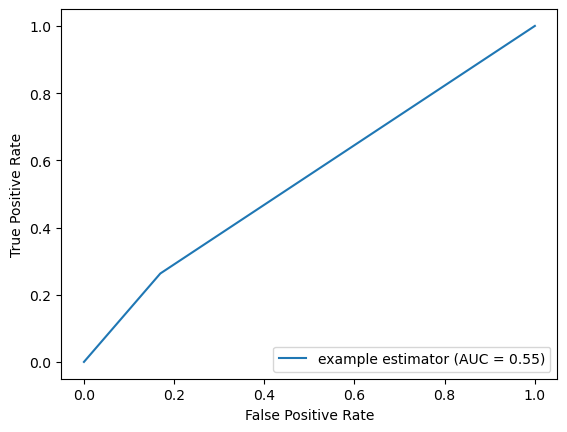

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.94    0.83      0.88   809.00
1                  0.10    0.26      0.14    57.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.52    0.55      0.51   866.00
weighted avg       0.89    0.79      0.83   866.00
None
Affichage de la matrice de confusion après optimisation


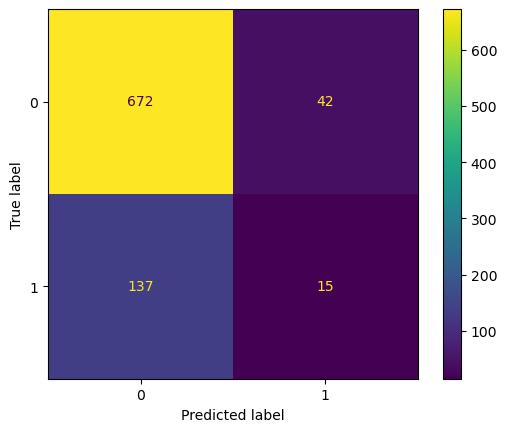

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.37
******* Best recall: 0.37
******* Best cost: 248.00
******* Best precision score: 0.54
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.79         0.26        557                   0.1   

   True Positives  True Negatives       sampling standardisation  \
0              15             672  undersampling  RobustScaler()   

                                       Best param  

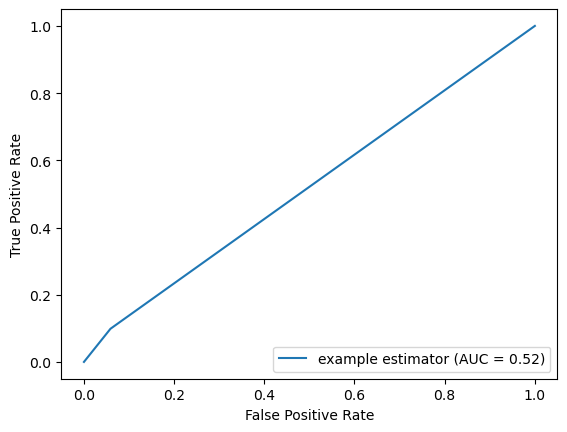

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.83      0.88   809.00
1                  0.10    0.26      0.14    57.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.52    0.55      0.51   866.00
weighted avg       0.89    0.79      0.83   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


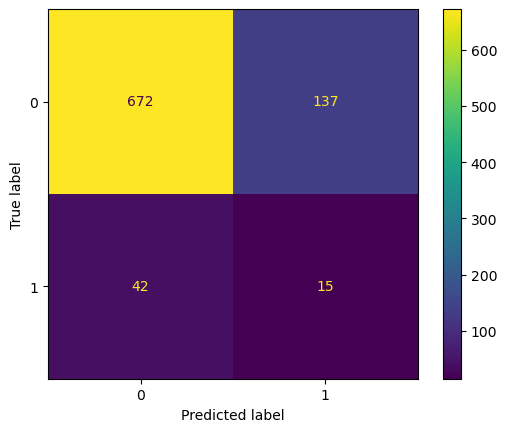

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.26
******* Best recall: 0.26
******* Best cost: 4937.00
******* Best precision score: 0.59
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.79         0.26        557                   0.1   



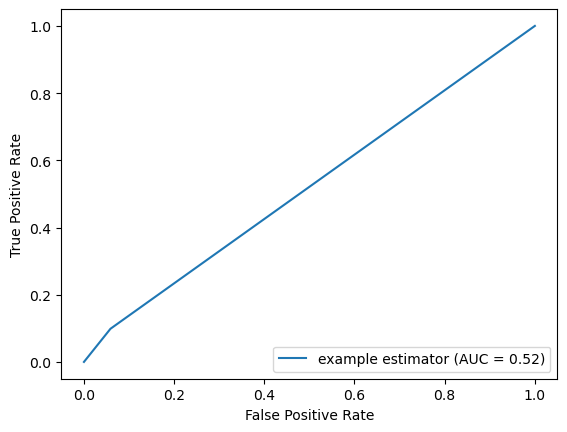

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.83      0.88   809.00
1                  0.10    0.26      0.14    57.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.52    0.55      0.51   866.00
weighted avg       0.89    0.79      0.83   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


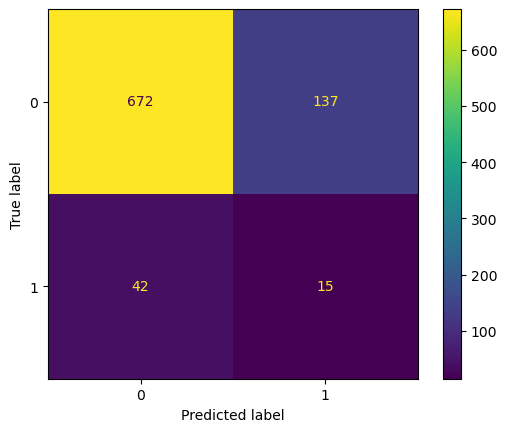

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.2642883488572963
Best recall:  0.2642883488572963
Best cost:  4937.0
Best precision score:  0.5878043396347482
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.79         0.26        557   

   Best precision Score  True Positives  True Negatives      sampling  \
0                   0.1              15             672  oversampling   

  standardisation                                         Best param  \


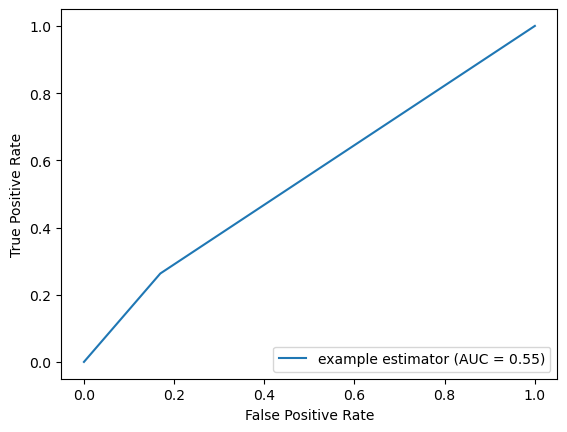

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.94    0.83      0.88   809.00
1                  0.10    0.26      0.14    57.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.52    0.55      0.51   866.00
weighted avg       0.89    0.79      0.83   866.00
None
Affichage de la matrice de confusion après optimisation


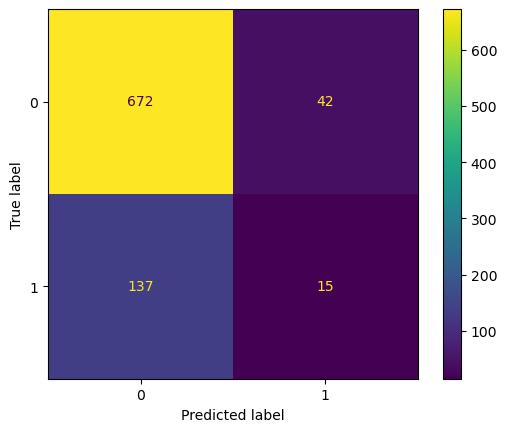

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.45
******* Best recall: 0.45
******* Best cost: 3870.80
******* Best precision score: 0.32
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.79         0.26        557                   0.1   

   True Positives  True Negatives      sampling standardisation  \
0              15             672  oversampling  RobustScaler()   

                                       Best param   

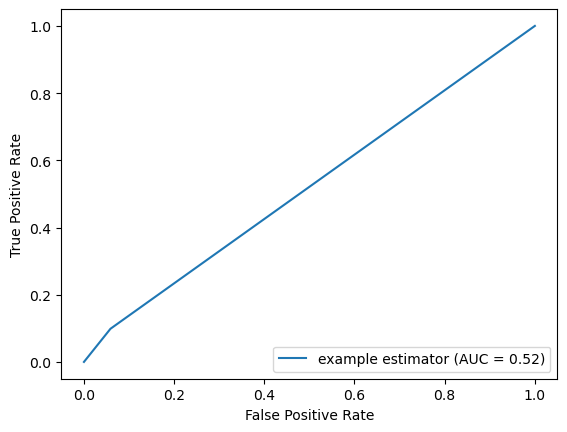

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.83      0.88   809.00
1                  0.10    0.26      0.14    57.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.52    0.55      0.51   866.00
weighted avg       0.89    0.79      0.83   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


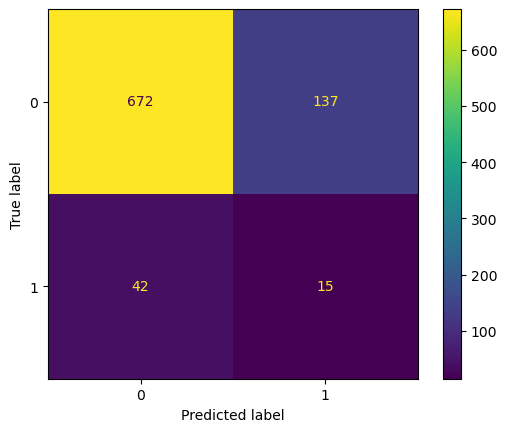

None
******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': None, 'n_estimators': 10}
******* Best accuracy: 0.26
******* Best recall: 0.26
******* Best cost: 399.00
******* Best precision score: 0.08
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.79         0.26        557                   0.1   

 

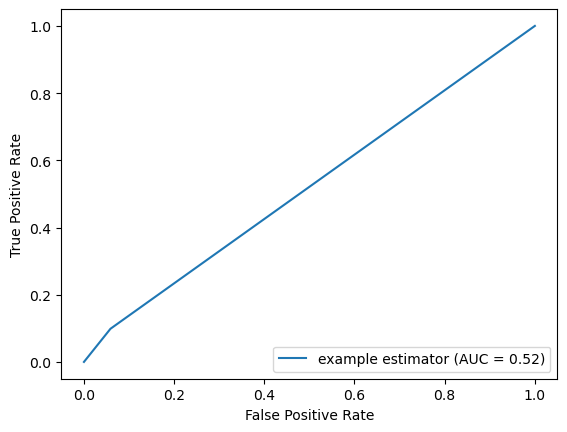

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.94    0.83      0.88   809.00
1                  0.10    0.26      0.14    57.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.52    0.55      0.51   866.00
weighted avg       0.89    0.79      0.83   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


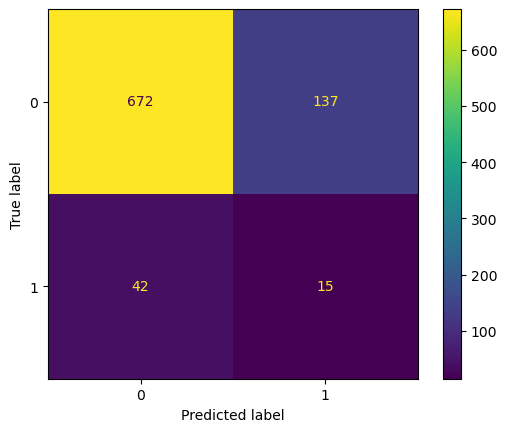

None
Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
Best accuracy:  0.2648648648648648
Best recall:  0.2648648648648648
Best cost:  399.0
Best precision score:  0.0761231897386847
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.79         0.26        557   

   Best precision Score  True Positives  True Negatives sampling  \
0                   0.1              15             672     None   

  standardisation                                         Best param  \
0  RobustSc

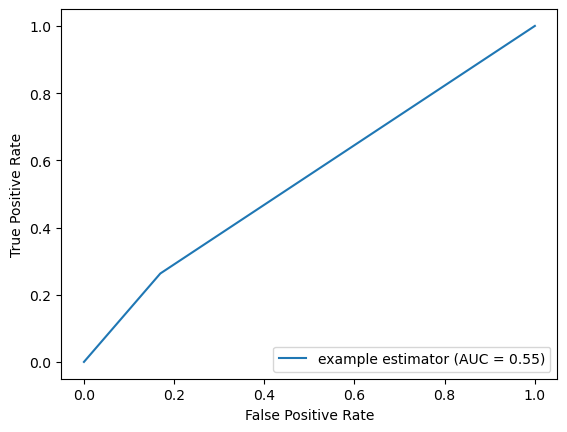

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.94    0.83      0.88   809.00
1                  0.10    0.26      0.14    57.00
accuracy           0.79    0.79      0.79     0.79
macro avg          0.52    0.55      0.51   866.00
weighted avg       0.89    0.79      0.83   866.00
None
Affichage de la matrice de confusion après optimisation


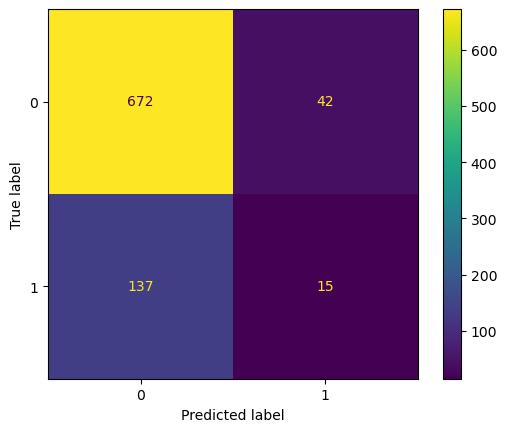

None
******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.001, 'gamma': 0.1, 'kernel': 'linear'}
******* Best accuracy: 0.00
******* Best recall: 0.00
******* Best cost: 378.00
******* Best precision score: 0.00
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM           0.93          0.0        570                   0.0   

   True Positives  True Negatives sampling standardisation  \
0               0             809     None  RobustScaler()   

                                       Best param    feature  


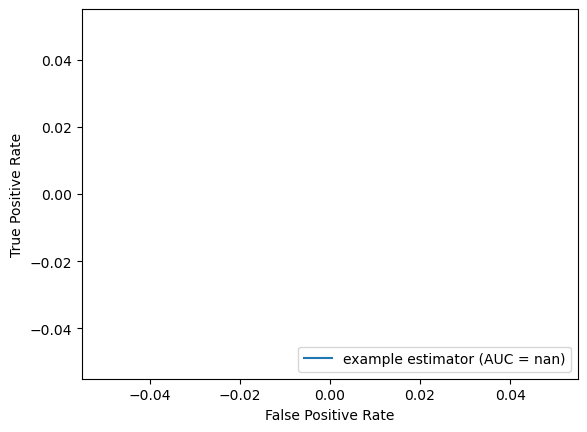

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.93    1.00      0.97   809.00
1                  0.00    0.00      0.00    57.00
accuracy           0.93    0.93      0.93     0.93
macro avg          0.47    0.50      0.48   866.00
weighted avg       0.87    0.93      0.90   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


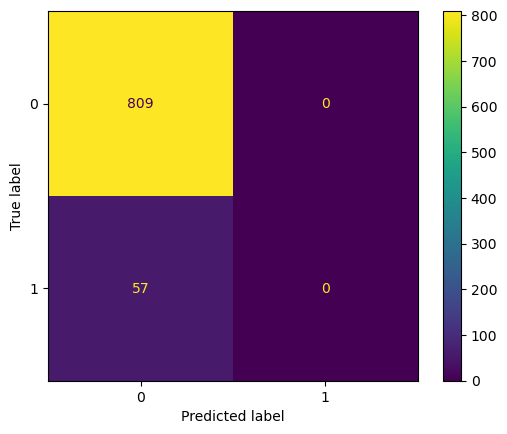

None
                  Modèle  Best accuracy  Best recall Best cost  \
0          Random forest           0.67         0.84       365   
1    Logistic Regression           0.83         0.70       303   
2                    SVM           0.28         1.00       624   
3          Random forest           0.73         0.79       343   
4    Logistic Regression           0.83         0.70       303   
5                    SVM           0.34         1.00       569   
6          Random forest           0.63         0.88       380   
7    Logistic Regression           0.83         0.70       303   
8                    SVM           0.93         0.00       570   
9          Random forest           0.78         0.75       320   
10   Logistic Regression           0.83         0.70       303   
11                   SVM           0.28         1.00       624   
12         Random forest           0.67         0.84       365   
13   Logistic Regression           0.83         0.70       303   
14   

In [67]:
# Liste des colonnes à tester
liste_col = ['age', 'bmi','smoking_status','avg_glucose_level', 'hypertension', 'heart_disease', 'ever_married', 'work_type']

# Liste des standardiseurs à tester
liste_standardiseurs = [StandardScaler(), RobustScaler()]

# Liste des modes de prétraitement à tester
liste_modes_preprocessing = ['undersampling', 'oversampling', None]

# Liste des modèles à tester
liste_modeles = ['RandomForest', 'LogisticRegression', 'SVM']

# DataFrame pour enregistrer les résultats
df_eval = pd.DataFrame(columns=['Modèle', 'Best accuracy', 'Best recall', 'Best cost', 'Best precision Score', 'True Positives', 'True Negatives', 'Sampling', 'Standardisation', 'Feature'])

# DataFrame original (remplacez df_cleaned par votre DataFrame original)

# Boucle pour tester chaque colonne
for colonne in liste_col:
    # Boucle pour tester chaque standardiseur
    for standardiseur in liste_standardiseurs:
        # Boucle pour tester chaque mode de prétraitement
        for mode_preprocessing in liste_modes_preprocessing:
            # Prétraitement des données
            X_train, X_test, y_train, y_test, x_col = preprocessing(df_cleaned[[colonne,'stroke']], standardiser=standardiseur, mode=mode_preprocessing,nbr_feature=1)
            
            # Boucle pour tester chaque modèle
            for modele in liste_modeles:
                if modele == 'RandomForest':
                    y_pred, y_proba, model, y_pred_best, y_proba_best, best_model, results, df_results = random_forest(X_train, y_train, X_test, y_test, x_col, mode=mode_preprocessing, standardiser=standardiseur, feature=colonne)
                elif modele == 'LogisticRegression':
                    y_pred, y_proba, model, y_pred_best, y_proba_best, best_model, results, df_results = logistic_regression(X_train, y_train, X_test, y_test, x_col, mode=mode_preprocessing, standardiser=standardiseur, feature=colonne)
                elif modele == 'SVM':
                    y_pred_best, y_proba_best, model, best_model, results, df_results = svm_classifier(X_train, y_train, X_test, y_test, x_col, mode=mode_preprocessing, standardiser=standardiseur, feature=colonne)
                
                # Ajouter les résultats au DataFrame
                
                df_eval = pd.concat([df_eval, df_results], ignore_index=True)


# Enregistrez les résultats dans un fichier CSV ou affichez-les
df_eval.to_csv('resultats_sans_enfant_modeles.csv', index=False)
print(df_eval)


In [45]:
df_eval=pd.read_csv('resultats_modeles.csv')

In [46]:
df_eval= df_eval.drop(['Sampling','Standardisation','Feature'],axis=1)

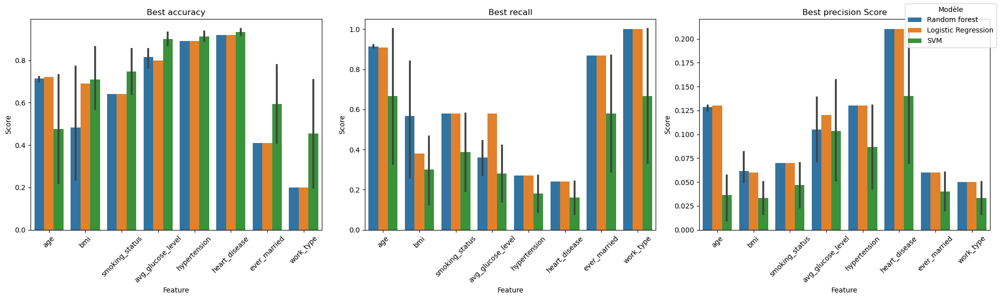

In [47]:
# Liste des métriques à afficher
metriques = ['Best accuracy', 'Best recall', 'Best precision Score']

# Nombre de graphiques par ligne
graphiques_par_ligne = 3

# Calcul du nombre de lignes
nombre_de_lignes = 1

# Création des sous-graphiques
fig, axs = plt.subplots(nombre_de_lignes, graphiques_par_ligne, figsize=(20, 6 * nombre_de_lignes))

# Parcours des métriques
for i, metrique in enumerate(metriques):
    # Restructurer les données pour cette métrique
    df_melted = df_eval.melt(id_vars=['Modèle', 'feature'], 
                             value_vars=[metrique],
                             var_name='Métrique', 
                             value_name='Score')
    
    # Tracer le graphique
    ax = axs[i]
    sns.barplot(data=df_melted, x='feature', y='Score', hue='Modèle', ax=ax)
    ax.set_title(metrique)
    ax.set_xlabel('Feature')
    ax.set_ylabel('Score')
    ax.get_legend().remove()  
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

# Afficher une seule légende en dehors des graphiques
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', title='Modèle')

plt.tight_layout()
plt.show()

## random forest

In [48]:
X_train, X_test, y_train, y_test, x_col = preprocessing(df_cleaned[['age','avg_glucose_level','hypertension','heart_disease','smoking_status','stroke']],standardiser=RobustScaler(),mode='undersampling',nbr_feature=6)

******* Création d'un modèle ********
******* Entrainement du modèle sur X_train / y_train *******
******* Optimisation du seuil de classification pour maximiser l'AUC *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 40 candidates, totalling 200 fits
******* Best parameters:  {'class_weight': 'balanced', 'max_depth': 1, 'n_estimators': 75}
******* Best accuracy: 0.87
******* Best recall: 0.87
******* Best cost: 65.20
******* Best precision score: 0.68
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Optimisation du seil de classification pour maximiser l'AUC ******* 
******* Scores du modèle après optimisation ******* 
          Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0  Random forest           0.74         0.79        335                  0.17   

   True Po

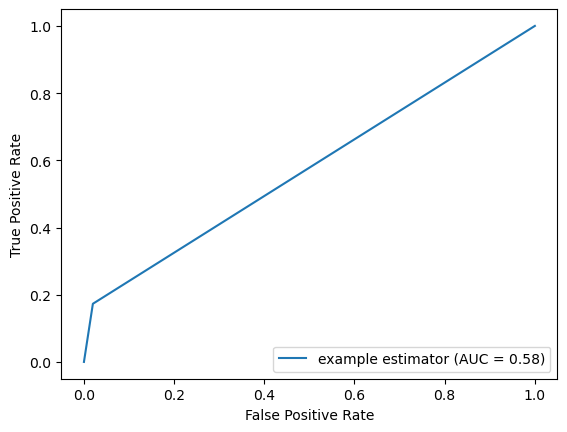

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  0.98    0.73      0.84   809.00
1                  0.17    0.79      0.28    57.00
accuracy           0.74    0.74      0.74     0.74
macro avg          0.58    0.76      0.56   866.00
weighted avg       0.93    0.74      0.80   866.00
None
******* Affichage de la matrice de confusion après optimisation ******* 


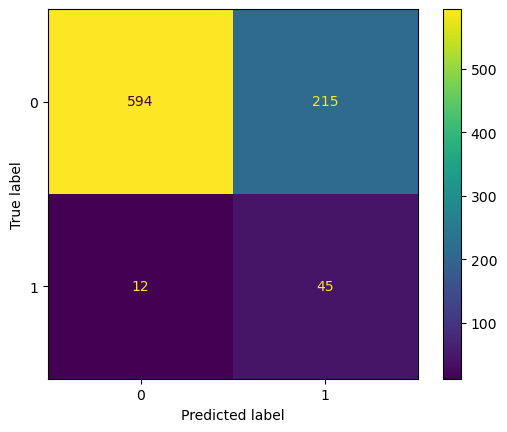

None


In [49]:
y_pred, y_proba, rf_model, y_pred_best, y_proba_best, best_rf_model,results_rf, last_result = random_forest(X_train,y_train,X_test,y_test,x_col,mode='undersampling',standardiser='Robustscaler',feature='age +3')

## Regression logistique

In [50]:
X_train, X_test, y_train, y_test, x_col = preprocessing(df_cleaned[['age','avg_glucose_level','hypertension','heart_disease','smoking_status','stroke']],standardiser=RobustScaler(),mode='undersampling',nbr_feature=6)

Création d'un modèle de régression logistique
Entrainement du modèle sur X_train / y_train
Optimisation du seuil de classification pour maximiser l'AUC
Création d'un dictionnaire de scoring
Execution de GridSearchCV sur le modèle
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters:  {'C': 0.01, 'class_weight': {0: 2.0, 1: 2.0}, 'penalty': 'l2'}
Best accuracy:  0.7933143669985776
Best recall:  0.7933143669985776
Best cost:  89.4
Best precision score:  0.7245755756816449
Ajustement du modèle avec les paramètres optimisés
Optimisation du seuil de classification pour maximiser l'AUC
Scores du modèle après optimisation
                Modèle  Best accuracy  Best recall  Best cost  \
0  Logistic Regression           0.73         0.86        303   

   Best precision Score  True Positives  True Negatives       sampling  \
0                  0.18              49             586  undersampling   

  standardisation                                         Best param fea

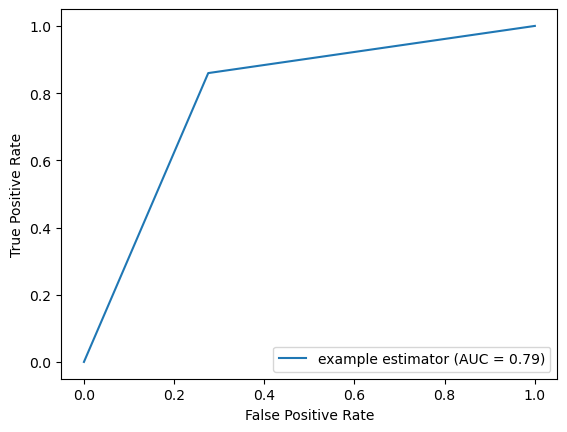

None
Affichage du rapport de classification après optimisation
              precision  recall  f1-score  support
0                  0.99    0.72      0.84   809.00
1                  0.18    0.86      0.30    57.00
accuracy           0.73    0.73      0.73     0.73
macro avg          0.58    0.79      0.57   866.00
weighted avg       0.93    0.73      0.80   866.00
None
Affichage de la matrice de confusion après optimisation


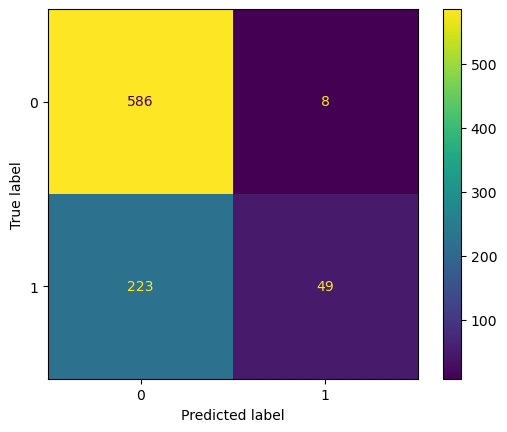

None


In [51]:
y_pred, y_proba, log_reg_model, y_pred_best, y_proba_best, best_log_reg_model, results_log_reg, df_result_log_reg = logistic_regression(X_train,y_train,X_test,y_test,x_col,mode='undersampling',standardiser='Robuscaler',feature='age+3')

## SVM (Support Vector Machine)

In [52]:
X_train, X_test, y_train, y_test, x_col = preprocessing(df_cleaned[['age','avg_glucose_level','hypertension','heart_disease','smoking_status','stroke']],standardiser=RobustScaler(),mode='undersampling',nbr_feature=6)

******* Création d'un modèle SVM ********
******* Entrainement du modèle sur X_train / y_train *******
******* Création d'un dictionnaire pour optimiser les paramètres ******* 
******* Création d'un dictionnaire de scoring ******* 
******* Execution de GridSearchCV sur le modèle ******* 
Fitting 5 folds for each of 27 candidates, totalling 135 fits
******* Best parameters:  {'C': 0.01, 'gamma': 1, 'kernel': 'poly'}
******* Best accuracy: 0.89
******* Best recall: 0.89
******* Best cost: 61.80
******* Best precision score: 0.63
******* Ajustement du modèle avec les paramètres optimisés ******* 
******* Scores du modèle après optimisation ******* 
  Modèle  Best accuracy  Best recall  Best cost  Best precision Score  \
0    SVM            0.5         0.98        444                  0.11   

   True Positives  True Negatives       sampling standardisation  \
0              56             375  undersampling    Robustscaler   

                                  Best param feature  
0  {'C'

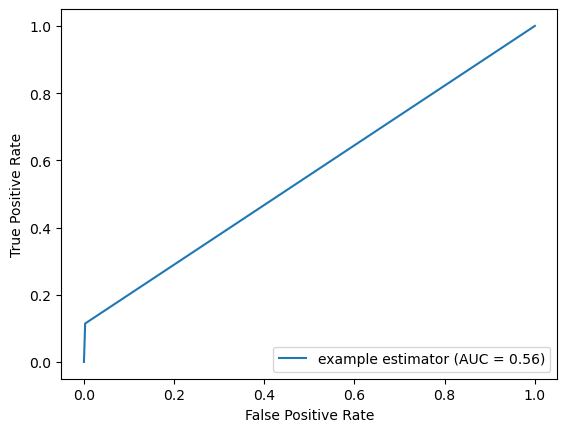

None
******* Affichage du rapport de classification après optimisation ******* 
              precision  recall  f1-score  support
0                  1.00    0.46      0.63    809.0
1                  0.11    0.98      0.20     57.0
accuracy           0.50    0.50      0.50      0.5
macro avg          0.56    0.72      0.42    866.0
weighted avg       0.94    0.50      0.60    866.0
None
******* Affichage de la matrice de confusion après optimisation ******* 


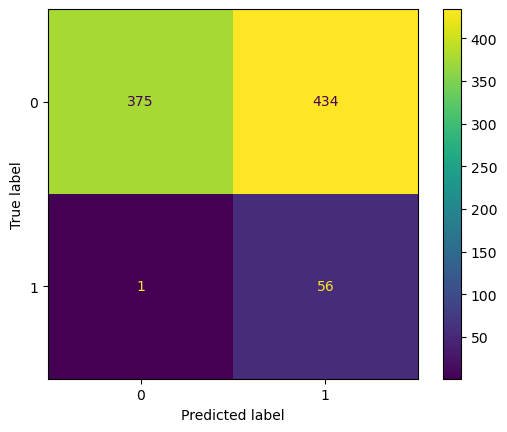

None


In [53]:
y_pred_best, y_proba_best, svm_model, best_svm_model, results, df_results_svm = svm_classifier(X_train,y_train,X_test,y_test,x_col,mode='undersampling',standardiser='Robustscaler',feature='age +3')


## Lime

LIME est une bibliothèque permettant d'expliquer les prédictions des modèles d'apprentissage automatique. 

In [54]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                 mode='classification',
                                 class_names=['Pas AVC', 'AVC'],
                                 feature_names=list(X_train.columns),
                                 random_state=42)



In [56]:
best_rf_explanation = explainer.explain_instance(X_test.values[17],
                                               best_rf_model.predict_proba,
                                               num_features = 5
                                               )
best_rf_explanation.show_in_notebook(show_table=True)